### General code

In [1]:
%run ../../../../ModelSEED/ModelSEEDpy/modelseedpy/core/msgapfill.py

import os
local_cobrakbase_path = os.path.join('C:', 'Users', 'Andrew Freiburger','Documents','Argonne','cobrakbase')
os.environ["HOME"] = local_cobrakbase_path
import cobrakbase
with open("D:/Users/Andrew Freiburger/Documents/Argonne/kbase_token.txt") as token_file:
    kbase = cobrakbase.KBaseAPI(token_file.readline())

cobrakbase 0.3.1


In [2]:
# import the models
from cobra.io import load_json_model
ecoli = load_json_model("../ecoli.json")
pf = load_json_model("../pf.json")
# print(ecoli.optimize())
# print(pf.optimize())
    
# load peripheral packages
import warnings
warnings.filterwarnings(action='once')
from pandas import set_option
set_option("display.max_rows", None)
from time import process_time

### Debugging PF

In [7]:
media = kbase.get_from_ws("93465/35/1")
# gapfilled_pf = MSGapfill.gapfill(pf, media)

In [64]:
gapfilled_pf

Name,GCF_001612705.1.RAST.mdl
Memory address,1e9dba05100
Number of metabolites,1400
Number of reactions,1608
Number of genes,1442
Number of groups,0
Objective expression,1.0*bio1 - 1.0*bio1_reverse_b18f7
Compartments,"c0, e0"


In [65]:
pf

Name,GCF_001612705.1.RAST.mdl
Memory address,1e9dba05100
Number of metabolites,1400
Number of reactions,1608
Number of genes,1442
Number of groups,0
Objective expression,1.0*bio1 - 1.0*bio1_reverse_b18f7
Compartments,"c0, e0"


In [10]:
print(set(gapfilled_pf.reactions)-set(pf.reactions))
print(set(gapfilled_pf.metabolites)-set(pf.metabolites))

set()
set()


In [12]:
%run ../../../../ModelSEED/ModelSEEDpy/modelseedpy/core/msmodelutl.py

pf_msutil = MSModelUtil(pf)
pf_msutil.add_medium(media)
sol = pf_msutil.run(media)
display([(ID, flux) for ID, flux in sol.fluxes.items() if flux != 0 and "EX_" in ID])
print(sorted(list(pf_msutil.model.medium.keys())))  # molybdate is ommitted, presumably because the model lacks a corresponding exchange 
print(pf_msutil.model.optimize())

# pf_gf_msutil = MSModelUtil(gapfilled_pf)
# print(pf_gf_msutil.run(media))

C:\Users\Andrew Freiburger\Documents\Argonne\ModelSEED\ModelSEEDpy\modelseedpy\core\msmodelutl.py:31: DeprecationWarning: invalid escape sequence \d
  if re.search("^(cpd\d+)", metabolite.id):


[('EX_cpd00067_e0', -3.831748875885718),
 ('EX_cpd00136_e0', -2.527324174146313),
 ('EX_cpd00063_e0', -0.0005261845718486807),
 ('EX_cpd00058_e0', -0.0005261845718486808),
 ('EX_cpd00013_e0', -1.614778703045386),
 ('EX_cpd00205_e0', -0.0005261845718486808),
 ('EX_cpd00009_e0', -0.14298452182108692),
 ('EX_cpd00034_e0', -0.0005261845718486808),
 ('EX_cpd10516_e0', -0.0005261845718486808),
 ('EX_cpd10515_e0', -0.001578553715546042),
 ('EX_cpd00048_e0', -0.042451871294202595),
 ('EX_cpd00030_e0', -0.0005261845718486807),
 ('EX_cpd00149_e0', -0.0005261845718486808),
 ('EX_cpd00099_e0', -0.0005261845718486808),
 ('EX_cpd00254_e0', -0.0005261845718486808),
 ('EX_cpd00001_e0', 4.592917058064036),
 ('EX_cpd00007_e0', -10.0),
 ('EX_cpd00116_e0', 0.0005261845718486809),
 ('EX_cpd00011_e0', 10.66039443757873)]

['EX_cpd00001_e0', 'EX_cpd00007_e0', 'EX_cpd00009_e0', 'EX_cpd00013_e0', 'EX_cpd00030_e0', 'EX_cpd00034_e0', 'EX_cpd00048_e0', 'EX_cpd00058_e0', 'EX_cpd00063_e0', 'EX_cpd00067_e0', 'EX_cpd00099_e0', 'EX_cpd00136_e0', 'EX_cpd00149_e0', 'EX_cpd00205_e0', 'EX_cpd00244_e0', 'EX_cpd00254_e0', 'EX_cpd00971_e0', 'EX_cpd10515_e0', 'EX_cpd10516_e0']
<Solution 0.188 at 0x22a009b8850>


In [15]:
%run ../../../../ModelSEED/ModelSEEDpy/modelseedpy/core/msmodelutl.py

media = kbase.get_from_ws("93465/35/1")
mdlutl = MSModelUtil.get(pf)
mdlutl.pkgmgr.getpkg("KBaseMediaPkg",1).build_package(media)
mdlutl.pkgmgr.getpkg("ElementUptakePkg",1).build_package({"C":7})
mdlutl.model.reactions.EX_cpd00007_e0.lower_bound = -2
mdlutl.model.objective = "bio1"
mdlutl.model.optimize()
mdlutl.model.summary()

Metabolite,Reaction,Flux,C-Number,C-Flux
cpd00007_e0,EX_cpd00007_e0,2,0,0.00%
cpd00013_e0,EX_cpd00013_e0,0.1972,0,0.00%
cpd00028_e0,EX_cpd00028_e0,0.0005987,34,0.25%
cpd00030_e0,EX_cpd00030_e0,0.0005987,0,0.00%
cpd00033_e0,EX_cpd00033_e0,0.1277,2,3.19%
cpd00034_e0,EX_cpd00034_e0,0.0005987,0,0.00%
cpd00039_e0,EX_cpd00039_e0,0.0609,6,4.57%
cpd00048_e0,EX_cpd00048_e0,0.0005987,0,0.00%
cpd00051_e0,EX_cpd00051_e0,0.05263,6,3.95%
cpd00058_e0,EX_cpd00058_e0,0.0005987,0,0.00%


### Debug the phenotyping

In [13]:
%run ../../../../ModelSEED/ModelSEEDpy/modelseedpy/community/commhelper.py

community_members = {
    ecoli: {
        'name': 'ecoli',
        'phenotypes': {
            'Maltose': {"consumed":["cpd00179"],
                     "excreted":["cpd00029"]}, #kbase_api.get_from_ws("93465/23/1")} #'93465/9/1')}   # !!! The phenotype name must align with the experimental IDs for the graphs to find the appropriate data
            'Acetate': {"consumed":["cpd00029"]}, #kbase_api.get_from_ws('93465/13/1'), 
        }
    },
    pf: {
        'name': 'pf',
        'phenotypes': {
            'Acetate': {"consumed":["cpd00029"]}, # kbase_api.get_from_ws("93465/25/1"), #'93465/11/1'), 
            # this phenotype is somehow different from the other phenotypes of either model, which prevents it from operating with pFBA or maximizing excretion in the phenotyping despite not launching an OptimizationError
            '4-Hydroxybenzoate': {"consumed":["cpd00136"]}, 
            # 'Glycerol': {"consumed":["cpd00100"],
            #          "excreted":["cpd00266"]}, #kbase_api.get_from_ws('93465/13/1'), 
        }
    }
}
fluxes, members = phenotypes(community_members)
display(fluxes)

C:\Users\Andrew Freiburger\Documents\Argonne\ModelSEED\ModelSEEDpy\modelseedpy\community\commhelper.py:23: DeprecationWarning: invalid escape sequence \_
  return re.sub("(\_\w\d)", "", ID)
C:\Users\Andrew Freiburger\Documents\Argonne\ModelSEED\ModelSEEDpy\modelseedpy\community\commhelper.py:93: DeprecationWarning: invalid escape sequence \d
  if re.search('^(bio)(\d+)$', rxn.id):



 GCF_000005845.2.RAST.mdl
The new bounds of cpd00029 exchange are: (0, 100.0)
-6.452599184046088
The new bounds of cpd00179 exchange are: (0, 100.0)
-30.698514492030842

 GCF_001612705.1.RAST.mdl
The new bounds of cpd00136 exchange are: (0, 100)
-30.63614460242051
The new bounds of cpd00029 exchange are: (0, 100)
-13.478267681535252


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\site-packages\cobra\util\solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


,ecoli_Maltose,ecoli_Acetate,pf_Acetate,pf_4~Hydroxybenzoate
rxn,,,,
EX_cpd00001_e0,1.618125e+01,4.544367e+01,4.533296e+01,2.449548e+01
EX_cpd00007_e0,-6.452599e+00,-2.035609e+01,-2.025521e+01,-5.333079e+01
EX_cpd00009_e0,-7.625410e-01,-7.625410e-01,-7.625410e-01,-7.625410e-01
EX_cpd00011_e0,1.073081e+00,2.388151e+01,2.377641e+01,5.685199e+01
EX_cpd00013_e0,-8.611666e+00,-8.611666e+00,-8.611666e+00,-8.611666e+00
EX_cpd00029_e0,1.051566e+01,-3.069851e+01,-3.063614e+01,0.000000e+00
EX_cpd00030_e0,-2.806159e-03,-2.806159e-03,-2.806159e-03,-2.806159e-03
EX_cpd00034_e0,-2.806159e-03,-2.806159e-03,-2.806159e-03,-2.806159e-03
EX_cpd00047_e0,1.781127e+01,0.000000e+00,0.000000e+00,0.000000e+00


In [ ]:
pf

In [2]:
from cobra.flux_analysis import variability

df = variability.flux_variability_analysis(ecoli, list(ecoli.reactions)[:3])
df.min(axis=0)

minimum   -5.291656e-12
maximum    0.000000e+00
dtype: float64

In [9]:
display(df)
index = df["minimum"].idxmin()
display(df.loc[index])

,minimum,maximum
rxn02201_c0,0.000000e+00,6.462376e-12
rxn00351_c0,0.000000e+00,1.369580e-12
rxn00836_c0,-3.231188e-12,0.000000e+00


minimum   -3.231188e-12
maximum    0.000000e+00
Name: rxn00836_c0, dtype: float64

In [2]:
# print(dir(pf.problem.Constraint))
# from pprint import pprint
# var = pf.problem.Variable("test")
# var2 = pf.problem.Variable("test2")
# cons = pf.problem.Constraint(var2-2*var, name="|bio")
# pf.add_cons_vars([var, cons])
# pprint(pf.solver.to_json())

In [2]:
# Define the standard graphs from each simulation
graphs_list = [
    {
        'trial':'G48',
        "phenotype": '*',
        'content': 'biomass',
        'experimental_data': False,
        # "parsed":True
    },
    {
        'trial':'G48',
        'content': "conc",
    },
    {
        'trial':'G48',
        "phenotype": '*',
        'content': 'biomass',
        "parsed": True
    },
    {
        'trial':'G48',
        'content': 'total_biomass',
        'experimental_data': True
    }
]

def update_graphs(trial):
    graphs = graphs_list.copy()
    for graph in graphs:
        graph["trial"] = trial
    return graphs

#### Maltose & 4HB conditions

In [3]:
species_abundances = {
    1:{"ecoli":0, "pf":1},
    2:{"ecoli":1, "pf":50},
    3:{"ecoli":1, "pf":20},
    4:{"ecoli":1, "pf":10},
    5:{"ecoli":1, "pf":3},
    6:{"ecoli":1, "pf":1},
    7:{"ecoli":3, "pf":1},
    8:{"ecoli":10, "pf":1},
    9:{"ecoli":20, "pf":1},
    10:{"ecoli":1, "pf":0},
    11:{"ecoli":0, "pf":0}
}
carbon_conc_series = {'rows': {
    'cpd00136': {'B':0, 'C': 0, 'D': 1, 'E': 1, 'F': 4, 'G': 4},
    'cpd00179': {'B':5, 'C': 5, 'D':5, 'E': 5, 'F': 5, 'G': 5},
}}
species_identities_rows = {
    1:{"ecoli":"mRuby"},
    2:{"ecoli":"ACS"},
    3:{"ecoli":"mRuby"},
    4:{"ecoli":"ACS"},
    5:{"ecoli":"mRuby"},
    6:{"ecoli":"ACS"}
}

# Maltose

#### coculture

##### All phenotypes

In [34]:
%%time 

%run ../../../../ModelSEED/ModelSEEDpy/modelseedpy/community/datastandardization.py

growth_data_path="../data/Jeffs_data/PF-EC 4-29-22 ratios and 4HB changes.xlsx"
experimental_metadata, growth_df, fluxes_df, standardized_carbon_conc, requisite_biomass, trial_name_conversion, data_timestep_hr, simulation_timestep, media_conc = GrowthData.process(
    community_members = {
        ecoli: {
            'name': 'ecoli', 
            'phenotypes': {
                'Maltose': {"consumed":["cpd00179"],
                         "excreted":["cpd00029"]}, #kbase_api.get_from_ws("93465/23/1")} #'93465/9/1')}   # !!! The phenotype name must align with the experimental IDs for the graphs to find the appropriate data
                'Acetate': {"consumed":["cpd00029"]}, #kbase_api.get_from_ws('93465/13/1'), 
                }
        },
        pf: {
            'name': 'pf',
            'phenotypes': {
                'Acetate': {"consumed":["cpd00029"]}, # kbase_api.get_from_ws("93465/25/1"), #'93465/11/1'), 
                # this phenotype is somehow different from the other phenotypes of either model, which prevents it from operating with pFBA or maximizing excretion in the phenotyping despite not launching an OptimizationError
                '4-Hydroxybenzoate': {"consumed":["cpd00136"]}, 
                # 'Glycerol': {"consumed":["cpd00100"],
                #          "excreted":["cpd00266"]}, #kbase_api.get_from_ws('93465/13/1'), 
                }
        }
    },
    data_paths = {'path':growth_data_path, 'Raw OD(590)':'OD', 'mNeonGreen':'pf', 'mRuby':'ecoli'},
    species_abundances = species_abundances,
    carbon_conc_series = carbon_conc_series,
    ignore_trials = {'rows': ['C', 'D', 'E', 'F', 'G'], 'columns': [1,2,3,4,5,6,8,9,10,11,12]},
    species_identities_rows = species_identities_rows
)


 GCF_000005845.2.RAST.mdl
EX_cpd00179_e0
EX_cpd00029_e0

 GCF_001612705.1.RAST.mdl
EX_cpd00029_e0
EX_cpd00136_e0


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\site-packages\cobra\util\solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\site-packages\cobra\util\solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


The EX_cpd00136_e0 phenotype of the GCF_001612705.1.RAST.mdl model is unable to be simulated with pFBA and yields a < None (infeasible). > error.
The ['B2', 'B3', 'B4', 'B5', 'B6', 'B8', 'B9', 'B10', 'B11', 'B12', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12'] trials were dropped from the OD measurements per the ignore_trials parameter.
The [97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166] timesteps (

,ecoli_Maltose,ecoli_Acetate,pf_Acetate,pf_4~Hydroxybenzoate
rxn,,,,
EX_cpd00001_e0,1.618125e+01,4.544367e+01,4.533296e+01,24.494174
EX_cpd00007_e0,-6.452599e+00,-2.035609e+01,-2.025521e+01,-53.330320
EX_cpd00009_e0,-7.625410e-01,-7.625410e-01,-7.625410e-01,-0.762541
EX_cpd00011_e0,1.073081e+00,2.388151e+01,2.377641e+01,56.852225
EX_cpd00013_e0,-8.611666e+00,-8.611666e+00,-8.611666e+00,-8.611666
EX_cpd00029_e0,1.051566e+01,-3.069851e+01,-3.063614e+01,0.000000
EX_cpd00030_e0,-2.806159e-03,-2.806159e-03,-2.806159e-03,-0.002806
EX_cpd00034_e0,-2.806159e-03,-2.806159e-03,-2.806159e-03,-0.002806
EX_cpd00047_e0,1.781127e+01,0.000000e+00,0.000000e+00,0.000000


CPU times: total: 10.1 s
Wall time: 10.8 s


In [3]:
# Define the standard graphs from each simulation
graphs_list = [
    {
        'trial':'G48',
        "phenotype": '*',
        'content': 'biomass',
        'experimental_data': False,
        # "parsed":True
    },
    {
        'trial':'G48',
        'content': "conc",
    },
    {
        'trial':'G48',
        "phenotype": '*',
        'content': 'biomass',
        "parsed": True
    },
    {
        'trial':'G48',
        'content': 'total_biomass',
        'experimental_data': True
    }
]

def update_graphs(trial):
    graphs = graphs_list.copy()
    for graph in graphs:
        graph["trial"] = trial
    return graphs

species_abundances = {
    1:{"ecoli":0, "pf":1},
    2:{"ecoli":1, "pf":50},
    3:{"ecoli":1, "pf":20},
    4:{"ecoli":1, "pf":10},
    5:{"ecoli":1, "pf":3},
    6:{"ecoli":1, "pf":1},
    7:{"ecoli":3, "pf":1},
    8:{"ecoli":10, "pf":1},
    9:{"ecoli":20, "pf":1},
    10:{"ecoli":1, "pf":0},
    11:{"ecoli":0, "pf":0}
}
carbon_conc_series = {'rows': {
    'cpd00136': {'B':0, 'C': 0, 'D': 1, 'E': 1, 'F': 4, 'G': 4},
    'cpd00179': {'B':5, 'C': 5, 'D':5, 'E': 5, 'F': 5, 'G': 5},
    'cpd00100': {'B':5, 'C': 5, 'D':5, 'E': 5, 'F': 5, 'G': 5},
}}
species_identities_rows = {
    1:{"ecoli":"mRuby"},
    2:{"ecoli":"ACS"},
    3:{"ecoli":"mRuby"},
    4:{"ecoli":"ACS"},
    5:{"ecoli":"mRuby"},
    6:{"ecoli":"ACS"}
}

In [4]:
# with requisite biomass

In [ ]:
%%time

%run ../../../../ModelSEED/ModelSEEDpy/modelseedpy/community/mscommphitting.py

def _partition_coefs(initial_val, divisor):
    return (initial_val, initial_val/divisor, initial_val/divisor**2, initial_val/divisor**3, initial_val/divisor**4)

test_com = MSCommPhitting('../../../../ModelSEED/ModelSEEDDatabase',
                           community_members = {
                                ecoli: {
                                    'name': 'ecoli', 
                                    'phenotypes': {
                                        'Maltose': {"consumed":["cpd00179"],
                                                 "excreted":["cpd00029"]}, #kbase_api.get_from_ws("93465/23/1")} #'93465/9/1')}   # !!! The phenotype name must align with the experimental IDs for the graphs to find the appropriate data
                                        'Acetate': {"consumed":["cpd00029"]}, #kbase_api.get_from_ws('93465/13/1'), 
                                        }
                                },
                                pf: {
                                    'name': 'pf',
                                    'phenotypes': {
                                        'Acetate': {"consumed":["cpd00029"]}, # kbase_api.get_from_ws("93465/25/1"), #'93465/11/1'), 
                                        '4-Hydroxybenzoate': {"consumed":["cpd00136"]}, # kbase_api.get_from_ws('	93465/27/1')} #93465/15/1')}
                                        # 'Glycerol': {"consumed":["cpd00100"],
                                        #          "excreted":["cpd00266"]}, #kbase_api.get_from_ws('93465/13/1'), 
                                        }
                                }
                            },
                            data_paths = {'path':"../data/Jeffs_data/PF-EC 4-29-22 ratios and 4HB changes.xlsx", 'Raw OD(590)':'OD', 'mNeonGreen':'pf', 'mRuby':'ecoli'},
                            species_abundances = species_abundances,
                            carbon_conc = carbon_conc_series,
                            ignore_trials = {'rows': ['C', 'D', 'E', 'F', 'G'], 'columns': [1,2,3,4,5,6,7,8,9,10,12]},
                            species_identities_rows = species_identities_rows)

test_com.fit(parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 5e-3},
             rel_final_conc = {"cpd00179":0.1},
             zero_start = ["cpd00029"],
             abs_final_conc = {"cpd00029":0}, # metabolomics data
             graphs=update_graphs("G10"),
             export_zip_name = 'maltose_ecoli_test.zip',
             export_lp = "maltose_ecoli_test.lp",
             primals_export_path="maltose_ecoli_primals_test.json")

C:\Users\Andrew Freiburger\Documents\Argonne\ModelSEED\ModelSEEDpy\modelseedpy\community\mscommphitting.py:80: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)



 GCF_000005845.2.RAST.mdl
The new bounds of cpd00029 exchange are: (0, 100.0)
-6.452599184046088
The new bounds of cpd00179 exchange are: (0, 100.0)
-30.698514492030842

 GCF_001612705.1.RAST.mdl
The new bounds of cpd00136 exchange are: (0, 100.0)
-30.636144602420785
The new bounds of cpd00029 exchange are: (0, 100.0)
-13.478267681535378


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\site-packages\cobra\util\solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


The ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B12', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12'] trials were dropped from the OD measurements per the ignore_trials parameter.
The [81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166] timesteps (with [1.11135657 1.11403494 1.10087516 1.1021111  1.14037094 1.13783236
 1.10900805

,ecoli_Maltose,ecoli_Acetate,pf_Acetate,pf_4~Hydroxybenzoate
rxn,,,,
EX_cpd00001_e0,1.618125e+01,4.544367e+01,4.533296e+01,2.449548e+01
EX_cpd00007_e0,-6.452599e+00,-2.035609e+01,-2.025521e+01,-5.333079e+01
EX_cpd00009_e0,-7.625410e-01,-7.625410e-01,-7.625410e-01,-7.625410e-01
EX_cpd00011_e0,1.073081e+00,2.388151e+01,2.377641e+01,5.685199e+01
EX_cpd00013_e0,-8.611666e+00,-8.611666e+00,-8.611666e+00,-8.611666e+00
EX_cpd00029_e0,1.051566e+01,-3.069851e+01,-3.063614e+01,0.000000e+00
EX_cpd00030_e0,-2.806159e-03,-2.806159e-03,-2.806159e-03,-2.806159e-03
EX_cpd00034_e0,-2.806159e-03,-2.806159e-03,-2.806159e-03,-2.806159e-03
EX_cpd00047_e0,1.781127e+01,0.000000e+00,0.000000e+00,0.000000e+00


{'G10': {'ecoli|mRuby': rxn
EX_cpd00001_e0    1.128469e+01
EX_cpd00007_e0   -4.500000e+00
EX_cpd00009_e0   -5.317911e-01
EX_cpd00011_e0    7.483593e-01
EX_cpd00013_e0   -6.005719e+00
EX_cpd00029_e0    7.333552e+00
EX_cpd00030_e0   -1.956997e-03
EX_cpd00034_e0   -1.956997e-03
EX_cpd00047_e0    1.242146e+01
EX_cpd00048_e0   -1.578879e-01
EX_cpd00058_e0   -1.956997e-03
EX_cpd00063_e0   -1.956997e-03
EX_cpd00067_e0    2.430716e+01
EX_cpd00099_e0   -1.956997e-03
EX_cpd00116_e0    1.956997e-03
EX_cpd00142_e0   -1.503283e-12
EX_cpd00149_e0   -1.956997e-03
EX_cpd00179_e0   -4.500000e+00
EX_cpd00205_e0   -1.956997e-03
EX_cpd00254_e0   -1.956997e-03
EX_cpd00609_e0    7.532845e-16
EX_cpd00751_e0    3.752638e-29
EX_cpd01914_e0    9.172570e-13
EX_cpd03048_e0    4.862570e-13
EX_cpd10515_e0   -5.870991e-03
EX_cpd10516_e0   -1.956997e-03
EX_cpd15378_e0    1.956997e-03
bio               6.973934e-01
Name: ecoli_Maltose, dtype: float64, 'pf|mNeonGreen': rxn
EX_cpd00001_e0    1.074310e+01
EX_cpd00007_e0 

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_ecoli_test.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)



 GCF_000005845.2.RAST.mdl
EX_cpd00179_e0
EX_cpd00029_e0

 GCF_001612705.1.RAST.mdl
EX_cpd00029_e0
EX_cpd00136_e0


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\site-packages\cobra\util\solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\site-packages\cobra\util\solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


The EX_cpd00136_e0 phenotype of the GCF_001612705.1.RAST.mdl model is unable to be simulated with pFBA and yields a < None (infeasible). > error.
The ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B12', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12'] trials were dropped from the OD measurements per the ignore_trials parameter.
The [81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156

,ecoli_Maltose,ecoli_Acetate,pf_Acetate,pf_4~Hydroxybenzoate
rxn,,,,
EX_cpd00001_e0,1.618125e+01,4.544367e+01,4.533296e+01,24.494174
EX_cpd00007_e0,-6.452599e+00,-2.035609e+01,-2.025521e+01,-53.330320
EX_cpd00009_e0,-7.625410e-01,-7.625410e-01,-7.625410e-01,-0.762541
EX_cpd00011_e0,1.073081e+00,2.388151e+01,2.377641e+01,56.852225
EX_cpd00013_e0,-8.611666e+00,-8.611666e+00,-8.611666e+00,-8.611666
EX_cpd00029_e0,1.051566e+01,-3.069851e+01,-3.063614e+01,0.000000
EX_cpd00030_e0,-2.806159e-03,-2.806159e-03,-2.806159e-03,-0.002806
EX_cpd00034_e0,-2.806159e-03,-2.806159e-03,-2.806159e-03,-0.002806
EX_cpd00047_e0,1.781127e+01,0.000000e+00,0.000000e+00,0.000000


{'G10': {'ecoli|mRuby': rxn
EX_cpd00001_e0    1.128469e+01
EX_cpd00007_e0   -4.500000e+00
EX_cpd00009_e0   -5.317911e-01
EX_cpd00011_e0    7.483593e-01
EX_cpd00013_e0   -6.005719e+00
EX_cpd00029_e0    7.333552e+00
EX_cpd00030_e0   -1.956997e-03
EX_cpd00034_e0   -1.956997e-03
EX_cpd00047_e0    1.242146e+01
EX_cpd00048_e0   -1.578879e-01
EX_cpd00058_e0   -1.956997e-03
EX_cpd00063_e0   -1.956997e-03
EX_cpd00067_e0    2.430716e+01
EX_cpd00099_e0   -1.956997e-03
EX_cpd00105_e0   -9.697937e-16
EX_cpd00108_e0    1.458407e-17
EX_cpd00116_e0    1.956997e-03
EX_cpd00142_e0   -6.406049e-13
EX_cpd00149_e0   -1.956997e-03
EX_cpd00159_e0   -9.959698e-18
EX_cpd00179_e0   -4.500000e+00
EX_cpd00205_e0   -1.956997e-03
EX_cpd00254_e0   -1.956997e-03
EX_cpd00396_e0   -9.959698e-18
EX_cpd00751_e0    9.959698e-18
EX_cpd01914_e0    4.413682e-13
EX_cpd03048_e0    1.451914e-13
EX_cpd10515_e0   -5.870991e-03
EX_cpd10516_e0   -1.956997e-03
EX_cpd15378_e0    1.956997e-03
bio               6.973934e-01
Name: ecoli

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_ecoli_test.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 0.10286458333333333 min
starting optimization


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_ecoli_primals_test.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


maltose_ecoli_test.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'stationary', '4~Hydroxybenzoate', 'Acetate', 'Maltose'},
 'species': ['OD', 'pf', 'ecoli'],
 'trial': 'G10'}
graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00179', 'cpd00029'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'g

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G10_ecoli_stationary,4~Hydroxybenzoate,Acetate,Maltose phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G10_OD_stationary,4~Hydroxybenzoate,Acetate,Maltose phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G10_all species_OD,pf,ecoli_total_biomass.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G10_cpd00179,cpd00029_c.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\l

Optimization completed in 61.665104166666666 minutes
Graphing completed in 0.012239583333333333 minutes
CPU times: total: 1h 2min 13s
Wall time: 1h 2min 29s


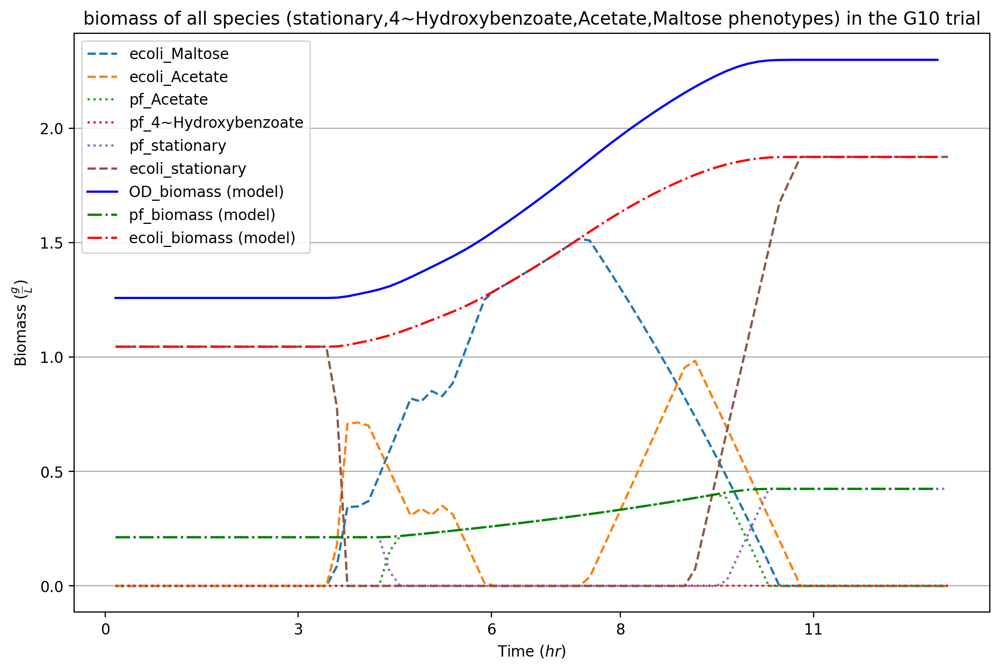

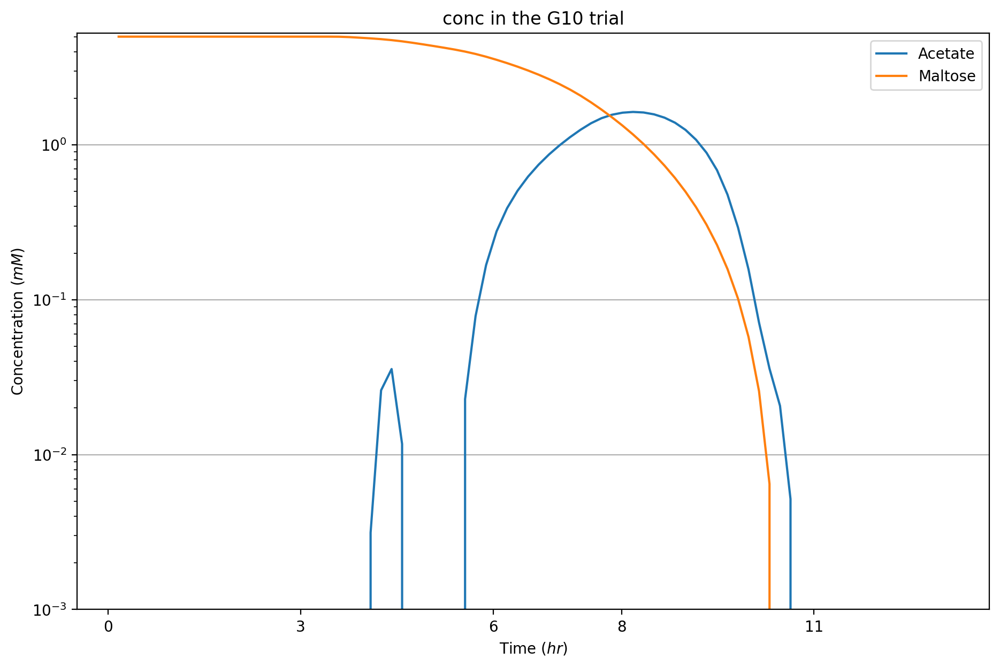

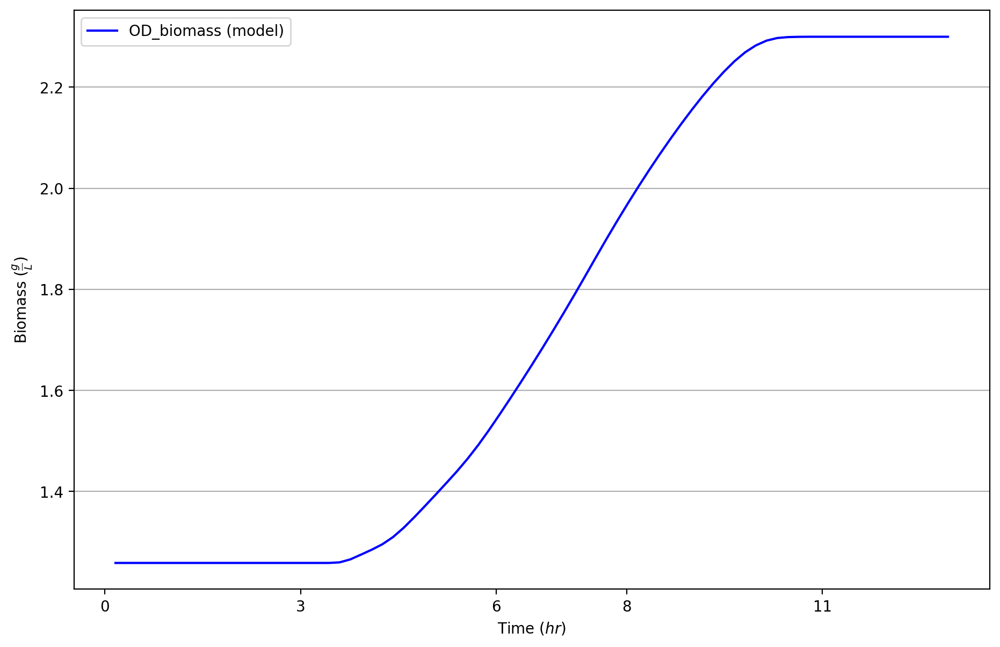

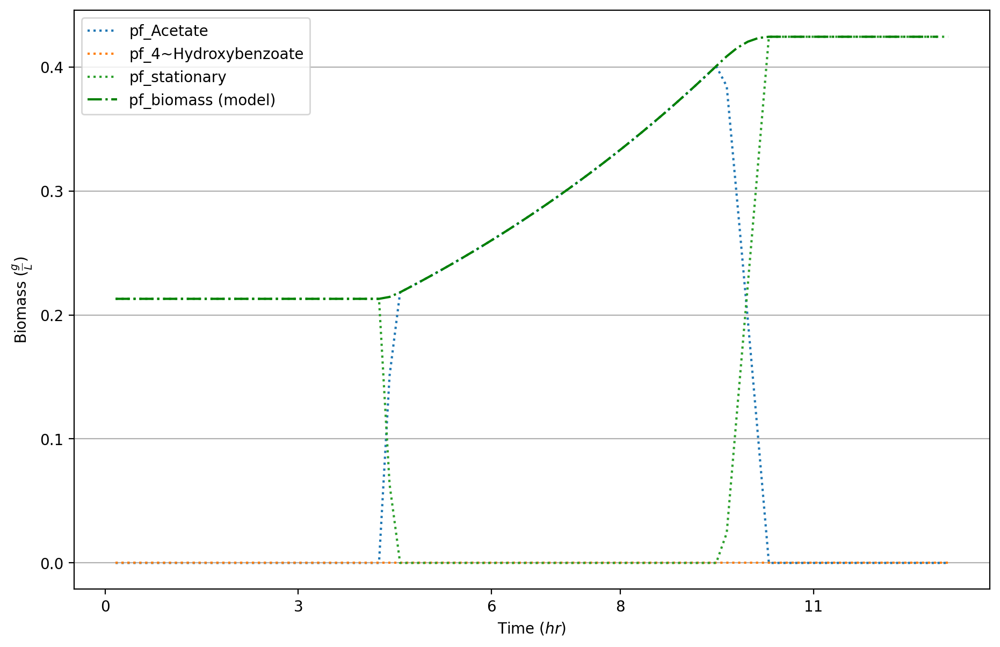

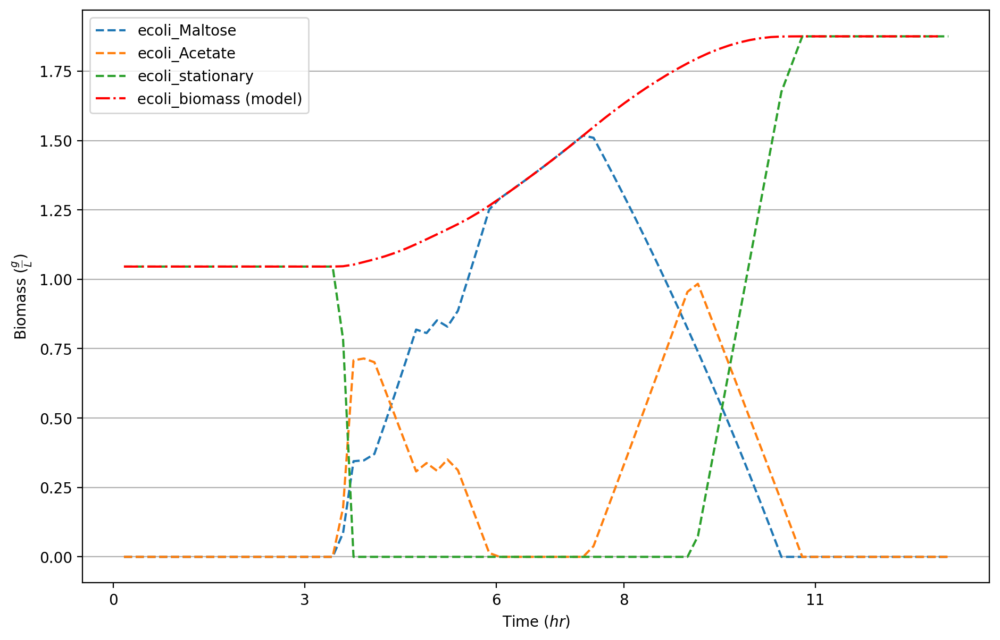

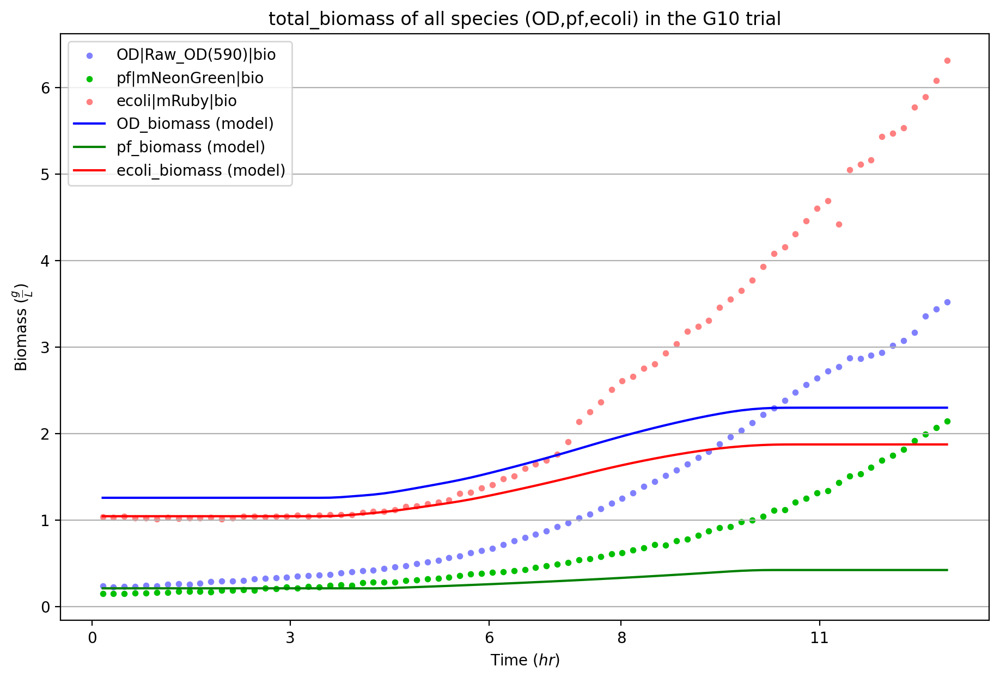

In [5]:
%%time

%run ../../../../ModelSEED/ModelSEEDpy/modelseedpy/community/mscommphitting.py

def _partition_coefs(initial_val, divisor):
    return (initial_val, initial_val/divisor, initial_val/divisor**2, initial_val/divisor**3, initial_val/divisor**4)

test_com = MSCommPhitting('../../../../ModelSEED/ModelSEEDDatabase',
                           community_members = {
                                ecoli: {
                                    'name': 'ecoli', 
                                    'phenotypes': {
                                        'Maltose': {"consumed":["cpd00179"],
                                                 "excreted":["cpd00029"]}, #kbase_api.get_from_ws("93465/23/1")} #'93465/9/1')}   # !!! The phenotype name must align with the experimental IDs for the graphs to find the appropriate data
                                        'Acetate': {"consumed":["cpd00029"]}, #kbase_api.get_from_ws('93465/13/1'), 
                                        }
                                },
                                pf: {
                                    'name': 'pf',
                                    'phenotypes': {
                                        'Acetate': {"consumed":["cpd00029"]}, # kbase_api.get_from_ws("93465/25/1"), #'93465/11/1'), 
                                        '4-Hydroxybenzoate': {"consumed":["cpd00136"]}, # kbase_api.get_from_ws('	93465/27/1')} #93465/15/1')}
                                        # 'Glycerol': {"consumed":["cpd00100"],
                                        #          "excreted":["cpd00266"]}, #kbase_api.get_from_ws('93465/13/1'), 
                                        }
                                }
                            },
                            data_paths = {'path':"../data/Jeffs_data/PF-EC 4-29-22 ratios and 4HB changes.xlsx", 'Raw OD(590)':'OD', 'mNeonGreen':'pf', 'mRuby':'ecoli'},
                            species_abundances = species_abundances,
                            carbon_conc = carbon_conc_series,
                            ignore_trials = {'rows': ['C', 'D', 'E', 'F', 'G'], 'columns': [1,2,3,4,5,6,7,8,9,10,12]},
                            species_identities_rows = species_identities_rows)

test_com.fit(parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 5e-3},
             rel_final_conc = {"cpd00179":0.1},
             zero_start = ["cpd00029"],
             abs_final_conc = {"cpd00029":0}, # metabolomics data
             graphs=update_graphs("G10"),
             export_zip_name = 'maltose_ecoli_test.zip',
             export_lp = "maltose_ecoli_test.lp",
             primals_export_path="maltose_ecoli_primals_test.json")

#### Disabled requisite biomass

C:\Users\Andrew Freiburger\Documents\Argonne\ModelSEED\ModelSEEDpy\modelseedpy\community\mscommphitting.py:80: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)



 GCF_000005845.2.RAST.mdl
The new bounds of cpd00029 exchange are: (0, 100.0)
-6.452599184046088
The new bounds of cpd00179 exchange are: (0, 100.0)
-30.698514492030842

 GCF_001612705.1.RAST.mdl
The new bounds of cpd00136 exchange are: (0, 100.0)
-30.636144602420785
The new bounds of cpd00029 exchange are: (0, 100.0)
-13.478267681535378


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\site-packages\cobra\util\solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


The ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B12', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12'] trials were dropped from the OD measurements per the ignore_trials parameter.
The [81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166] timesteps (with [1.11135657 1.11403494 1.10087516 1.1021111  1.14037094 1.13783236
 1.10900805

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_ecoli_test.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 0.055989583333333336 min
starting optimization


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_ecoli_primals_test.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


maltose_ecoli_test.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'stationary', 'Acetate', '4~Hydroxybenzoate', 'Maltose'},
 'species': ['OD', 'pf', 'ecoli'],
 'trial': 'G10'}
graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00179', 'cpd00029'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'g

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G10_OD_stationary,Acetate,4~Hydroxybenzoate,Maltose phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G10_all species_OD,pf,ecoli_total_biomass.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G10_pf_stationary,Acetate,4~Hydroxybenzoate,Maltose phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G10_ecoli_stationary,Acetate,4~Hydroxybenzoate,Maltose phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburge

Optimization completed in 11.85546875 minutes
Graphing completed in 0.013020833333333334 minutes
CPU times: total: 12min 23s
Wall time: 12min 30s


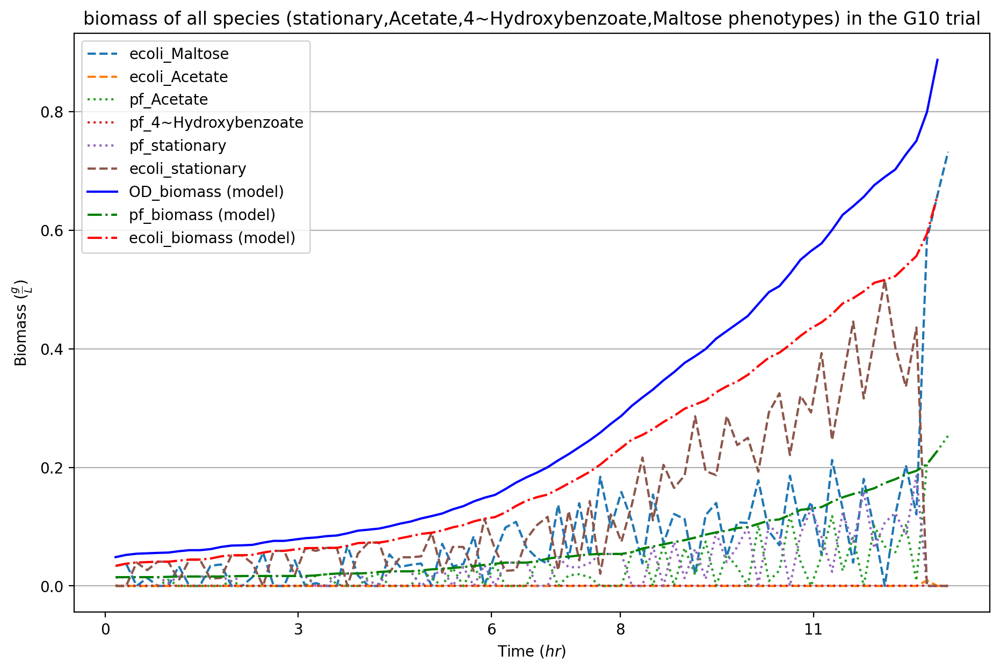

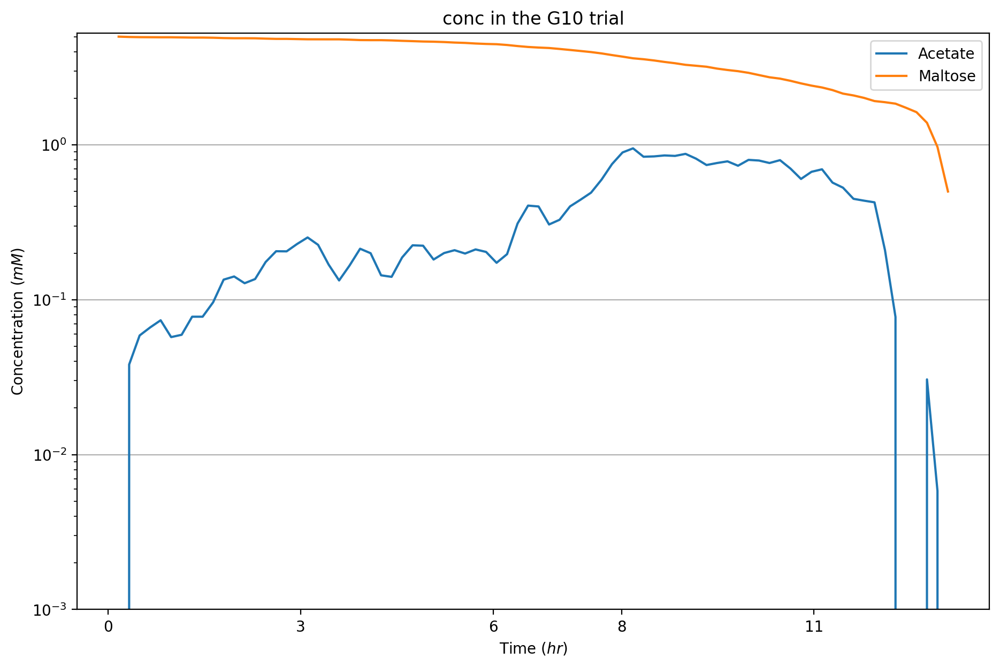

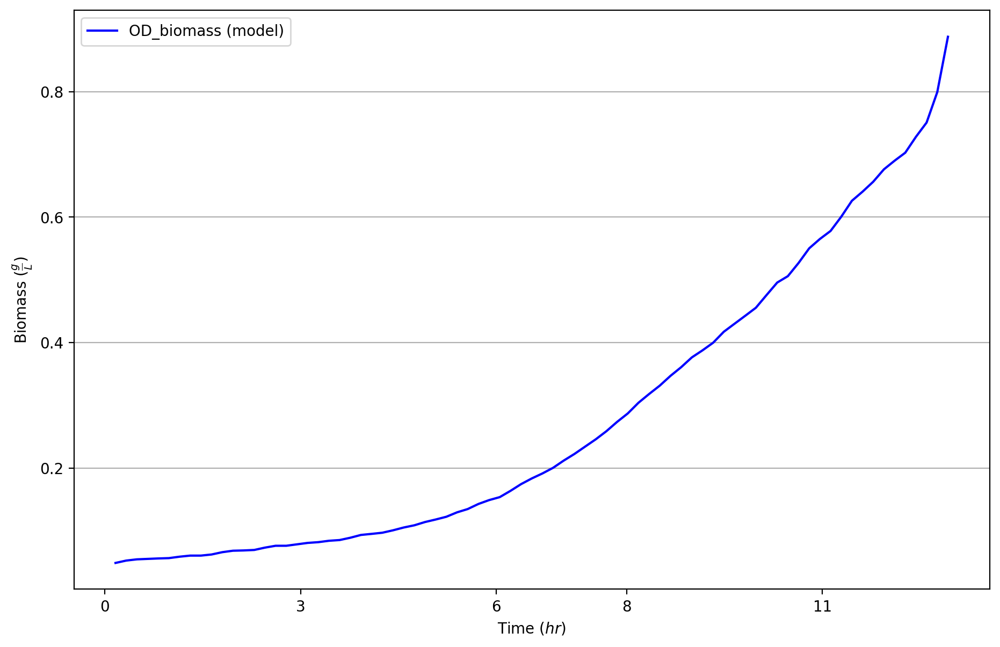

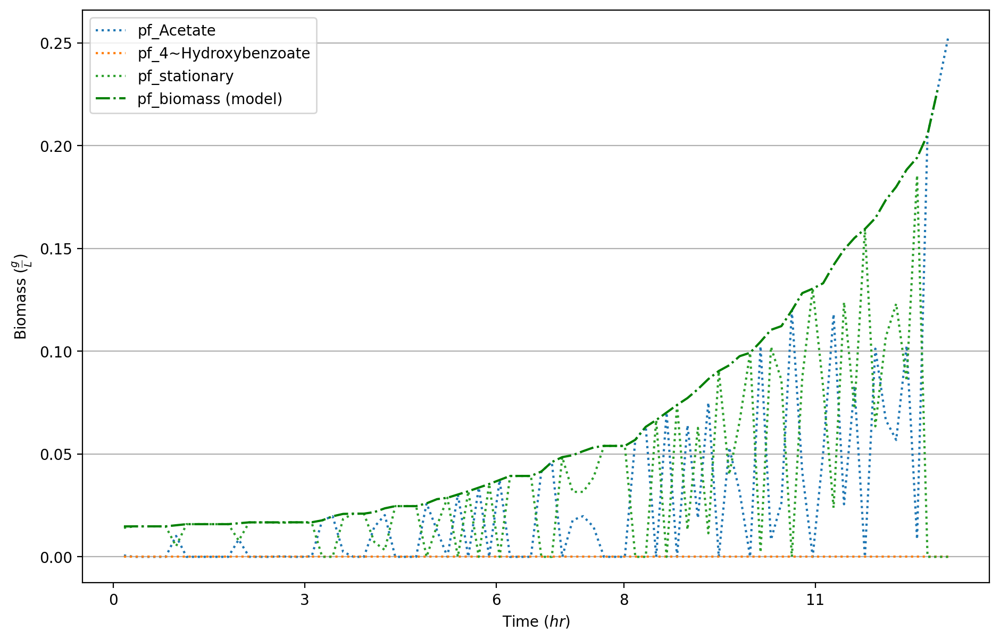

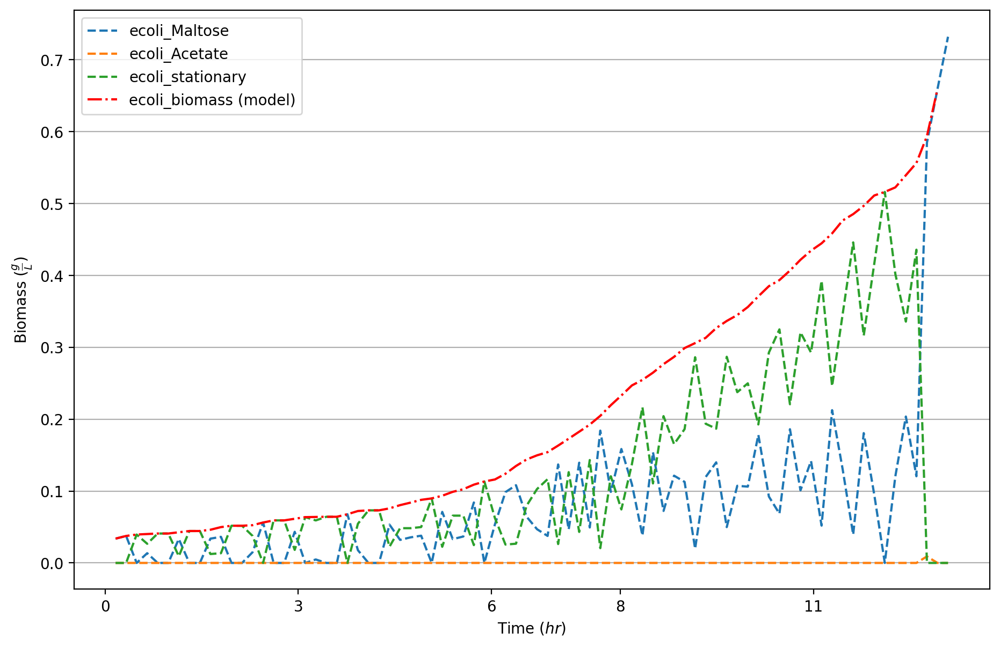

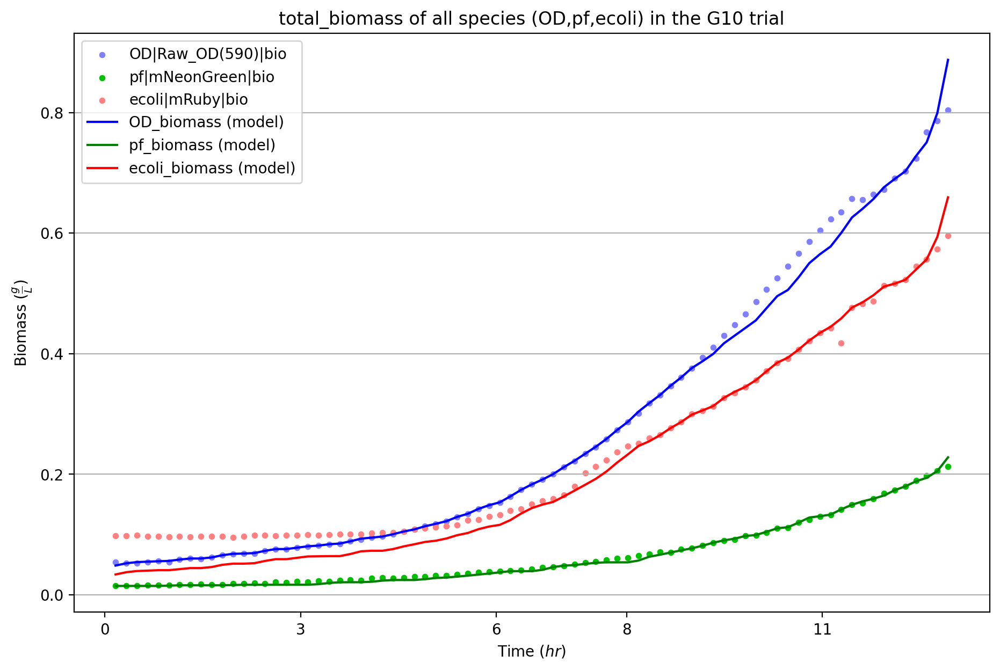

In [7]:
%%time

%run ../../../../ModelSEED/ModelSEEDpy/modelseedpy/community/mscommphitting.py

def _partition_coefs(initial_val, divisor):
    return (initial_val, initial_val/divisor, initial_val/divisor**2, initial_val/divisor**3, initial_val/divisor**4)

test_com = MSCommPhitting('../../../../ModelSEED/ModelSEEDDatabase',
                           community_members = {
                                ecoli: {
                                    'name': 'ecoli', 
                                    'phenotypes': {
                                        'Maltose': {"consumed":["cpd00179"],
                                                 "excreted":["cpd00029"]}, #kbase_api.get_from_ws("93465/23/1")} #'93465/9/1')}   # !!! The phenotype name must align with the experimental IDs for the graphs to find the appropriate data
                                        'Acetate': {"consumed":["cpd00029"]}, #kbase_api.get_from_ws('93465/13/1'), 
                                        }
                                },
                                pf: {
                                    'name': 'pf',
                                    'phenotypes': {
                                        'Acetate': {"consumed":["cpd00029"]}, # kbase_api.get_from_ws("93465/25/1"), #'93465/11/1'), 
                                        '4-Hydroxybenzoate': {"consumed":["cpd00136"]}, # kbase_api.get_from_ws('	93465/27/1')} #93465/15/1')}
                                        # 'Glycerol': {"consumed":["cpd00100"],
                                        #          "excreted":["cpd00266"]}, #kbase_api.get_from_ws('93465/13/1'), 
                                        }
                                }
                            },
                            data_paths = {'path':"../data/Jeffs_data/PF-EC 4-29-22 ratios and 4HB changes.xlsx", 'Raw OD(590)':'OD', 'mNeonGreen':'pf', 'mRuby':'ecoli'},
                            species_abundances = species_abundances,
                            carbon_conc = carbon_conc_series,
                            ignore_trials = {'rows': ['C', 'D', 'E', 'F', 'G'], 'columns': [1,2,3,4,5,6,7,8,9,10,12]},
                            species_identities_rows = species_identities_rows,
                            determine_requisite_biomass=False)

test_com.fit(parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 5e-3},
             rel_final_conc = {"cpd00179":0.1},
             zero_start = ["cpd00029"],
             abs_final_conc = {"cpd00029":0}, # metabolomics data
             graphs=update_graphs("G10"),
             export_zip_name = 'maltose_ecoli_test.zip',
             export_lp = "maltose_ecoli_test.lp",
             primals_export_path="maltose_ecoli_primals_test.json")

C:\Users\Andrew Freiburger\Documents\Argonne\ModelSEED\ModelSEEDpy\modelseedpy\community\mscommphitting.py:120: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)



 GCF_000005845.2.RAST.mdl
EX_cpd00179_e0
EX_cpd00029_e0

 GCF_001612705.1.RAST.mdl
EX_cpd00029_e0
EX_cpd00136_e0


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\site-packages\cobra\util\solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\site-packages\cobra\util\solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


The EX_cpd00136_e0 phenotype of the GCF_001612705.1.RAST.mdl model is unable to be simulated with pFBA and yields a < None (infeasible). > error.
The ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B12', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12'] trials were dropped from the OD measurements per the ignore_trials parameter.
The [81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156

,ecoli_Maltose,ecoli_Acetate,pf_Acetate,pf_4~Hydroxybenzoate
rxn,,,,
EX_cpd00001_e0,1.618125e+01,4.544367e+01,4.533296e+01,24.494174
EX_cpd00007_e0,-6.452599e+00,-2.035609e+01,-2.025521e+01,-53.330320
EX_cpd00009_e0,-7.625410e-01,-7.625410e-01,-7.625410e-01,-0.762541
EX_cpd00011_e0,1.073081e+00,2.388151e+01,2.377641e+01,56.852225
EX_cpd00013_e0,-8.611666e+00,-8.611666e+00,-8.611666e+00,-8.611666
EX_cpd00029_e0,1.051566e+01,-3.069851e+01,-3.063614e+01,0.000000
EX_cpd00030_e0,-2.806159e-03,-2.806159e-03,-2.806159e-03,-0.002806
EX_cpd00034_e0,-2.806159e-03,-2.806159e-03,-2.806159e-03,-0.002806
EX_cpd00047_e0,1.781127e+01,0.000000e+00,0.000000e+00,0.000000


Done with concentrations and biomass loops: 0.03046875 min
Done with DCC loop: 0.0026041666666666665 min
Done with the DBC & diffc loop: 0.0018229166666666667 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.10416666666666667 min
Done exporting the content: 0.07526041666666666 min
starting optimization


C:\Users\Andrew Freiburger\Documents\Argonne\ModelSEED\ModelSEEDpy\modelseedpy\community\mscommphitting.py:946: UserWarning: The conversion factor 5e-06 optimized to a bound, which may be indicative of an error, such as improper kinetic rates.
  warnings.warn(f"The conversion factor {value} optimized to a bound, which may be "


maltose_ecoli_test.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'Maltose', '4~Hydroxybenzoate', 'stationary', 'Acetate'},
 'species': ['OD', 'pf', 'ecoli'],
 'trial': 'G10'}
graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00179', 'cpd00029'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'g

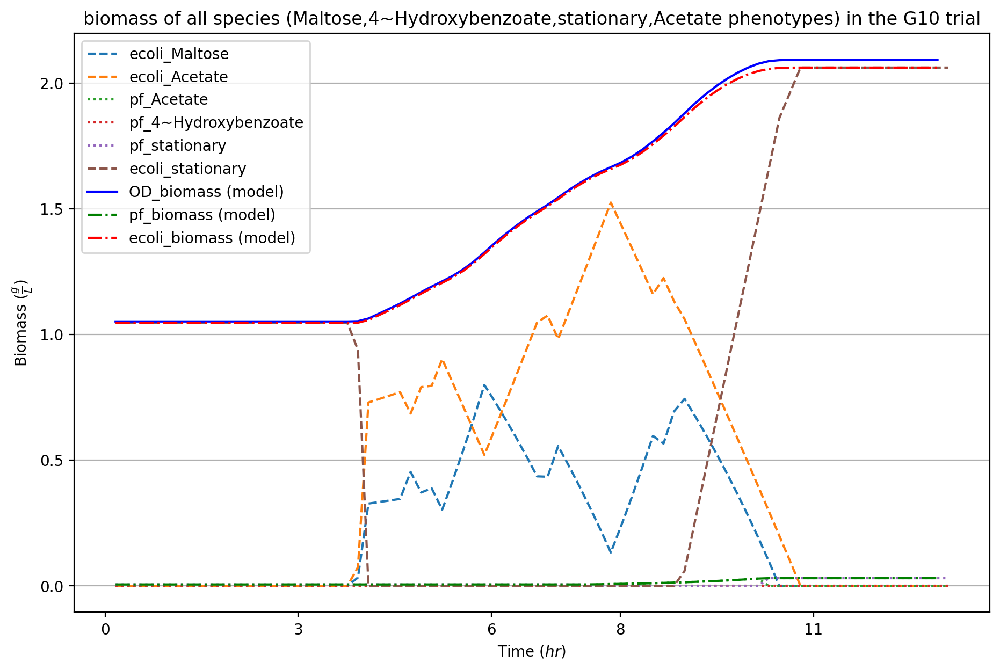

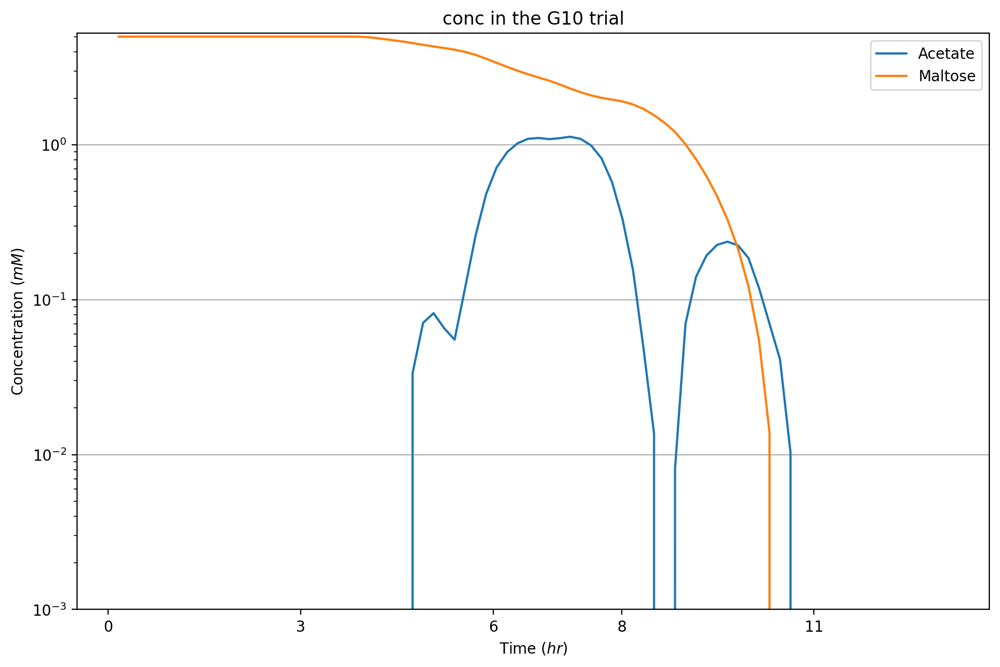

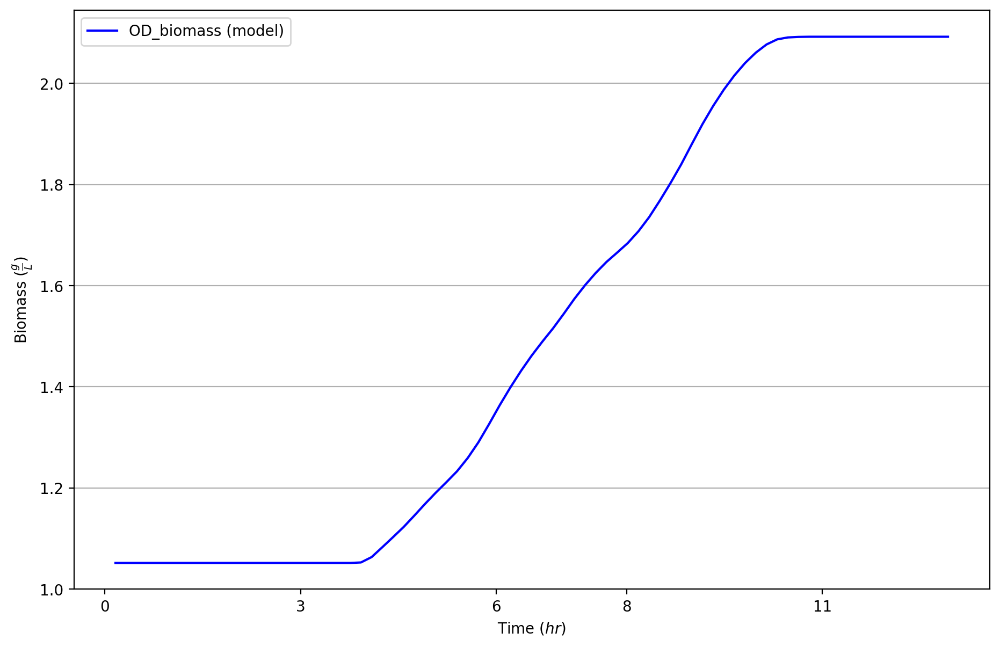

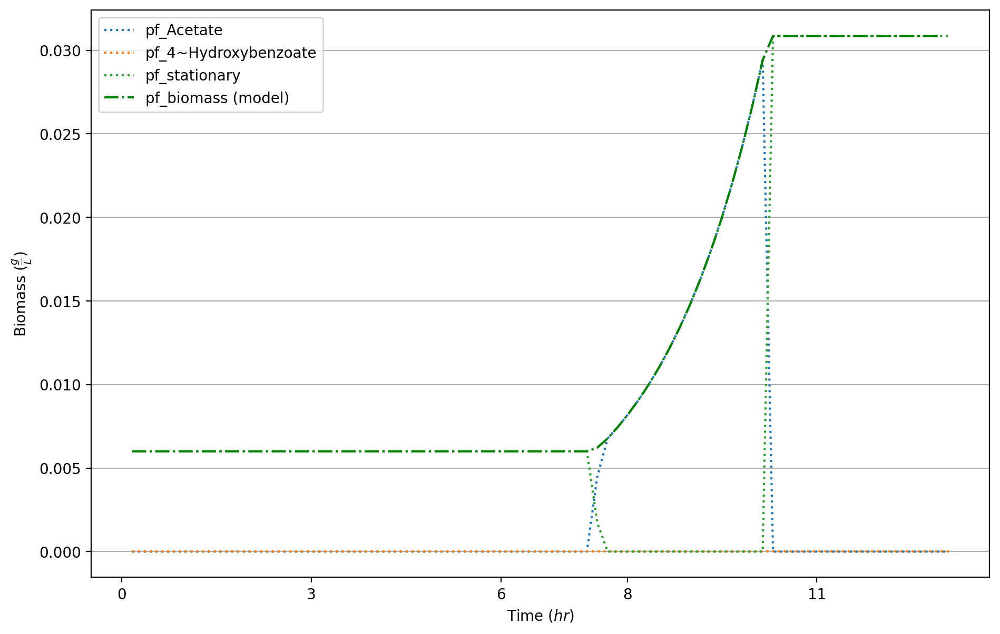

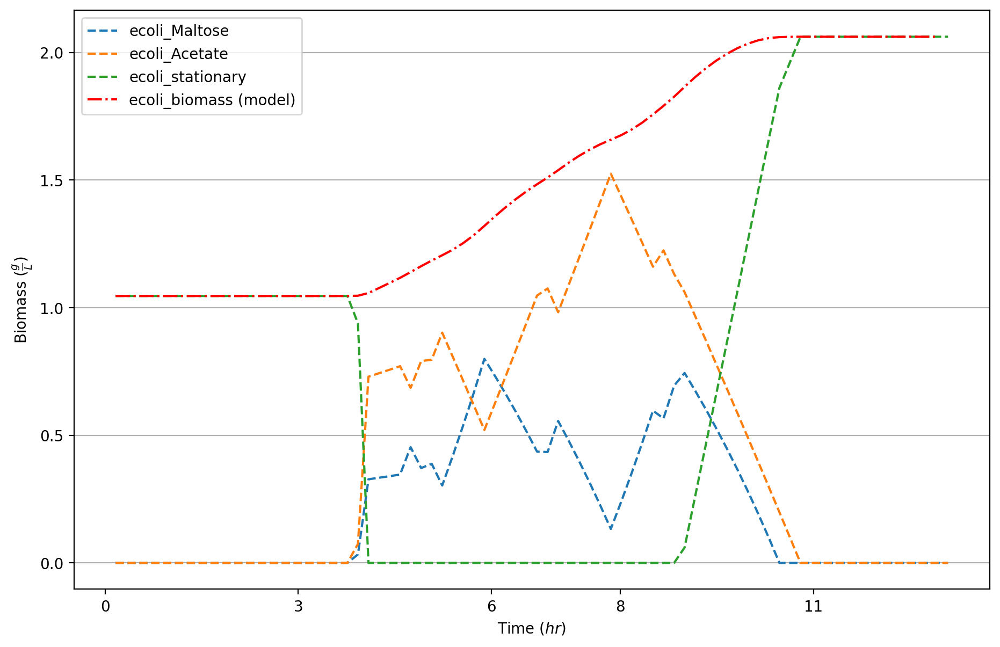

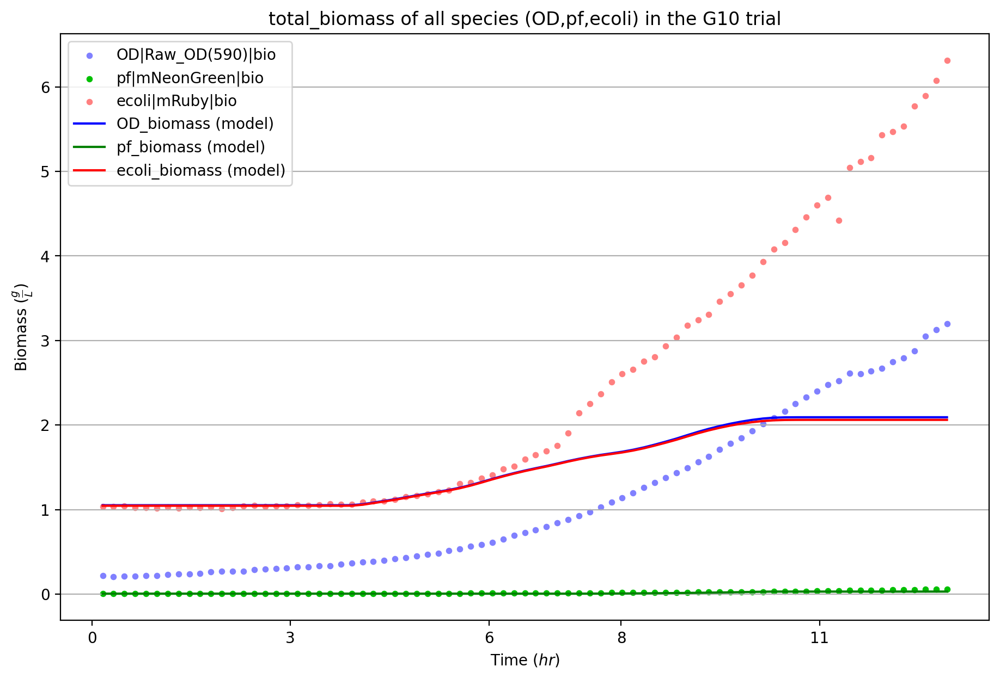

In [3]:
%%time

%run ../../../../ModelSEED/ModelSEEDpy/modelseedpy/community/mscommphitting.py

def _partition_coefs(initial_val, divisor):
    return (initial_val, initial_val/divisor, initial_val/divisor**2, initial_val/divisor**3, initial_val/divisor**4)

test_com = MSCommPhitting('../../../../ModelSEED/ModelSEEDDatabase',
                           community_members = {
                                ecoli: {
                                    'name': 'ecoli', 
                                    'phenotypes': {
                                        'Maltose': {"consumed":["cpd00179"],
                                                 "excreted":["cpd00029"]}, #kbase_api.get_from_ws("93465/23/1")} #'93465/9/1')}   # !!! The phenotype name must align with the experimental IDs for the graphs to find the appropriate data
                                        'Acetate': {"consumed":["cpd00029"]}, #kbase_api.get_from_ws('93465/13/1'), 
                                        }
                                },
                                pf: {
                                    'name': 'pf',
                                    'phenotypes': {
                                        'Acetate': {"consumed":["cpd00029"]}, # kbase_api.get_from_ws("93465/25/1"), #'93465/11/1'), 
                                        '4-Hydroxybenzoate': {"consumed":["cpd00136"]}, # kbase_api.get_from_ws('	93465/27/1')} #93465/15/1')}
                                        # 'Glycerol': {"consumed":["cpd00100"],
                                        #          "excreted":["cpd00266"]}, #kbase_api.get_from_ws('93465/13/1'), 
                                        }
                                }
                            },
                            data_paths = {'path':"../data/Jeffs_data/PF-EC 4-29-22 ratios and 4HB changes.xlsx", 'Raw OD(590)':'OD', 'mNeonGreen':'pf', 'mRuby':'ecoli'},
                            species_abundances = species_abundances,
                            carbon_conc = carbon_conc_series,
                            ignore_trials = {'rows': ['C', 'D', 'E', 'F', 'G'], 'columns': [1,2,3,4,5,6,7,8,9,10,12]},
                            species_identities_rows = species_identities_rows)

test_com.fit(parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 5e-3},
             rel_final_conc = {"cpd00179":0.1},
             zero_start = ["cpd00029"],
             abs_final_conc = {"cpd00029":0}, # metabolomics data
             graphs=update_graphs("G10"),
             export_zip_name = 'maltose_ecoli_test.zip',
             export_lp = "maltose_ecoli_test.lp",
             primals_export_path="maltose_ecoli_primals_test.json")

In [15]:
%%time 

%run ../../../../ModelSEED/ModelSEEDpy/modelseedpy/community/datastandardization.py
growth_data_path="../data/Jeffs_data/PF-EC 4-29-22 ratios and 4HB changes.xlsx"
experimental_metadata, growth_df, fluxes_df, standardized_carbon_conc, requisite_biomass, trial_name_conversion, data_timestep_hr, simulation_timestep, media_conc = GrowthData.process(
    community_members = {
        ecoli: {
            'name': 'ecoli', 
            'excretions': {
                "cpd00179":["cpd00029"]} #kbase_api.get_from_ws("93465/23/1")} #'93465/9/1')}   # !!! The phenotype name must align with the experimental IDs for the graphs to find the appropriate data
                },
        pf: {'name': 'pf'}
    },
    data_paths = {'path':growth_data_path, 'Raw OD(590)':'OD', 'mNeonGreen':'pf', 'mRuby':'ecoli'},
    species_abundances = species_abundances,
    carbon_conc_series = carbon_conc_series,
    ignore_trials = {'rows': ['C', 'D', 'E', 'F', 'G'], 'columns': [1,2,3,4,5,6,8,9,10,11,12]},
    species_identities_rows = species_identities_rows
)


 GCF_000005845.2.RAST.mdl


KeyError: 'EX_EX_cpd00182_e0_e0'

In [14]:
print(list(ecoli.reactions.EX_cpd00007_e0.metabolites)[0].name)

O2_e0


In [6]:
# display(fluxes_df)
# display(growth_df)
# display(requisite_biomass)
# display(experimental_metadata)
# display(standardized_carbon_conc)

In [13]:
%run ../mscommphitting.py

def _partition_coefs(initial_val, divisor):
    return (initial_val, initial_val/divisor, initial_val/divisor**2, initial_val/divisor**3, initial_val/divisor**4)

maltose_co = CommPhitting(fluxes_df, standardized_carbon_conc, media_conc, '../../../../ModelSEED/ModelSEEDDatabase', growth_df, experimental_metadata)
maltose_co.define_problem(
    parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 5e-3},
    mets_to_track = ["cpd00179","cpd00029"],
    rel_final_conc = {"cpd00179":0.1},
    zero_start = ["cpd00029", "cpd00136"],
    abs_final_conc = {"cpd00029":0}, # metabolomics data
    export_zip_name = 'maltose_co.zip',
    requisite_biomass = requisite_biomass,
    biomass_coefs=_partition_coefs(1, 2),
    export_lp = "maltose_coculture.lp"
)

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommPhitting\mscommphitting.py:80: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


Done with concentrations and biomass loops: 100.40625 min
Done with DCC loop: 4.178385416666667 min
Done with the DBC & diffc loop: 8.307552083333333 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 17.982291666666665 min


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_coculture.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 9.83359375 min


In [7]:
maltose_co.compute(update_graphs("G6"), None, None, True, "test_primals.json")

starting optimization


C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommPhitting\mscommphitting.py:80: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


FeasibilityError: The solution is sub-optimal, with a(n) infeasible status.

##### Specified phenotypes

In [24]:
%%time 

%run ../data/standardized_data/datastandardization.py
growth_data_path="../data/Jeffs_data/PF-EC 4-29-22 ratios and 4HB changes.xlsx"
experimental_metadata, growth_df, fluxes_df, standardized_carbon_conc, requisite_biomass, trial_name_conversion, data_timestep_hr, simulation_timestep, media_conc = GrowthData.process(
    community_members = {
        ecoli: {
            'name': 'ecoli', 
            'phenotypes': {
                'Maltose': {"consumed":["cpd00179"],
                         "excreted":["cpd00029"]}, #kbase_api.get_from_ws("93465/23/1")} #'93465/9/1')}   # !!! The phenotype name must align with the experimental IDs for the graphs to find the appropriate data
                'Acetate': {"consumed":["cpd00029"]}, #kbase_api.get_from_ws('93465/13/1'), 
                }
        },
        pf: {
            'name': 'pf',
            'phenotypes': {
                'Acetate': {"consumed":["cpd00029"]}, # kbase_api.get_from_ws("93465/25/1"), #'93465/11/1'), 
                '4-Hydroxybenzoate': {"consumed":["cpd00136"]} # kbase_api.get_from_ws('	93465/27/1')} #93465/15/1')}
                }
        }
    },
    data_paths = {'path':growth_data_path, 'Raw OD(590)':'OD', 'mNeonGreen':'pf', 'mRuby':'ecoli'},
    species_abundances = species_abundances,
    carbon_conc_series = carbon_conc_series,
    ignore_trials = {'rows': ['C', 'D', 'E', 'F', 'G'], 'columns': [1,2,3,4,5,6,8,9,10,11,12]},
    species_identities_rows = species_identities_rows
)


 GCF_000005845.2.RAST.mdl

 GCF_001612705.1.RAST.mdl
The ['B2', 'B3', 'B4', 'B5', 'B6', 'B8', 'B9', 'B10', 'B11', 'B12', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12'] trials were dropped from the OD measurements per the ignore_trials parameter.
The [97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166] timesteps (with [1.12550559 1.12537038 1.12105398 1.11597471 1.11273534 1.12893569
 1.13334937 1.133368

In [28]:
%%time

%run ../mscommphitting.py

def _partition_coefs(initial_val, divisor):
    return (initial_val, initial_val/divisor, initial_val/divisor**2, initial_val/divisor**3, initial_val/divisor**4)

maltose_co = CommPhitting(fluxes_df, standardized_carbon_conc, media_conc, '../../../../ModelSEED/ModelSEEDDatabase', growth_df, experimental_metadata)
maltose_co.define_problem(
    parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 5e-3},
    mets_to_track = ["cpd00179","cpd00029"],
    rel_final_conc = {"cpd00179":0.1},
    zero_start = ["cpd00029", "cpd00136"],
    abs_final_conc = {"cpd00029":0}, # metabolomics data
    export_zip_name = 'maltose_co.zip',
    requisite_biomass = requisite_biomass,
    biomass_coefs=_partition_coefs(1, 2),
    export_lp = "maltose_coculture_simple.lp"
)

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommPhitting\mscommphitting.py:80: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


Done with concentrations and biomass loops: 0.017447916666666667 min
Done with DCC loop: 0.0018229166666666667 min
Done with the DBC & diffc loop: 0.00390625 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.11380208333333333 min


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_coculture_simple.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 0.06510416666666667 min
CPU times: total: 20.3 s
Wall time: 22.6 s


starting optimization


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'test_primals_simple.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
ic

c_cpd00011_e0-G6-1 0.0
c_cpd00011_e0-G6-2 0.00030710149508695624
c_cpd00011_e0-G6-3 0.00030710149508695624
c_cpd00011_e0-G6-4 0.00030710149508695624
c_cpd00011_e0-G6-5 0.00030710149508695624
c_cpd00011_e0-G6-6 0.00030710149508695624
c_cpd00011_e0-G6-7 0.00030710149508695624
c_cpd00011_e0-G6-8 0.00030710149508695624
c_cpd00011_e0-G6-9 0.00030710149508695624
c_cpd00011_e0-G6-10 0.00030710149508695624
c_cpd00011_e0-G6-11 0.00030710149508695624
c_cpd00011_e0-G6-12 0.00030710149508695624
c_cpd00011_e0-G6-13 0.00030710149508695624
c_cpd00011_e0-G6-14 0.00030710149508695624
c_cpd00011_e0-G6-15 0.00030710149508695624
c_cpd00011_e0-G6-16 0.00030710149508695624
c_cpd00011_e0-G6-17 0.00030710149508695624
c_cpd00011_e0-G6-18 0.00030710149508695624
c_cpd00011_e0-G6-19 0.00030710149508695624
c_cpd00011_e0-G6-20 0.00030710149508695624
c_cpd00011_e0-G6-21 0.00030710149508695624
c_cpd00011_e0-G6-22 0.00033717275626067827
c_cpd00011_e0-G6-23 0.0023545619603655295
c_cpd00011_e0-G6-24 0.006404814391202463

| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_Maltose'
ic| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_Acetate'

{'4~Hydroxybenzoate', 'Acetate', 'Maltose', 'stationary'}



ic| mscommphitting.py:1077 in graph()- basename: 'b_pf_Acetate'
ic| mscommphitting.py:1077 in graph()
    basename: 'b_pf_4~Hydroxybenzoate'
ic| mscommphitting.py:1077 in graph()- basename: 'b_pf_stationary'
ic| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_stationary'
ic| mscommphitting.py:1148 in graph()- name: 'OD'
ic| mscommphitting.py:1148 in graph()- name: 'pf'
ic| mscommphitting.py:1148 in graph()- name: 'ecoli'


{'4~Hydroxybenzoate', 'Acetate', 'Maltose', 'stationary'}
{'4~Hydroxybenzoate', 'Acetate', 'Maltose', 'stationary'}
{'4~Hydroxybenzoate', 'Acetate', 'Maltose', 'stationary'}
{'4~Hydroxybenzoate', 'Acetate', 'Maltose', 'stationary'}
{'4~Hydroxybenzoate', 'Acetate', 'Maltose', 'stationary'}


ic

graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00179', 'cpd00029'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'trial': 'G6'}
graph_2
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': True,
 'phenotype': {

| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_Maltose'
ic| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_Acetate'
ic| mscommphitting.py:1077 in graph()- basename: 'b_pf_Acetate'
ic| mscommphitting.py:1077 in graph()
    basename: 'b_pf_4~Hydroxybenzoate'
ic| mscommphitting.py:1077 in graph()- basename: 'b_pf_stationary'
ic| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_stationary'
ic| mscommphitting.py:1148 in graph()- name: 'OD'
ic| mscommphitting.py:1148 in graph()- name: 'pf'


{'4~Hydroxybenzoate', 'Acetate', 'Maltose', 'stationary'}
{'4~Hydroxybenzoate', 'Acetate', 'Maltose', 'stationary'}
{'4~Hydroxybenzoate', 'Acetate', 'Maltose', 'stationary'}
{'4~Hydroxybenzoate', 'Acetate', 'Maltose', 'stationary'}
{'4~Hydroxybenzoate', 'Acetate', 'Maltose', 'stationary'}
{'4~Hydroxybenzoate', 'Acetate', 'Maltose', 'stationary'}


ic| mscommphitting.py:1148 in graph()- name: 'ecoli'
ic| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_Maltose'
ic| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_Acetate'
ic| mscommphitting.py:1077 in graph()- basename: 'b_pf_Acetate'
ic| mscommphitting.py:1077 in graph()
    basename: 'b_pf_4~Hydroxybenzoate'
ic| mscommphitting.py:1077 in graph()- basename: 'b_pf_stationary'
ic| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_stationary'
ic| mscommphitting.py:1148 in graph()- name: 'OD'
ic| mscommphitting.py:1148 in graph()- name: 'pf'
ic| mscommphitting.py:1148 in graph()- name: 'ecoli'


graph_3
{'content': 'total_biomass',
 'experimental_data': True,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'species': ['OD', 'pf', 'ecoli'],
 'trial': 'G6'}


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G6_all species_4~Hydroxybenzoate,Acetate,Maltose,stationary phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G6_ecoli_4~Hydroxybenzoate,Acetate,Maltose,stationary phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G6_all species_OD,pf,ecoli_total_biomass.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G6_OD_4~Hydroxybenzoate,Acetate,Maltose,stationary phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Frei

Optimization completed in 19.771875 minutes
Graphing completed in 0.0140625 minutes
CPU times: total: 19min 47s
Wall time: 19min 49s


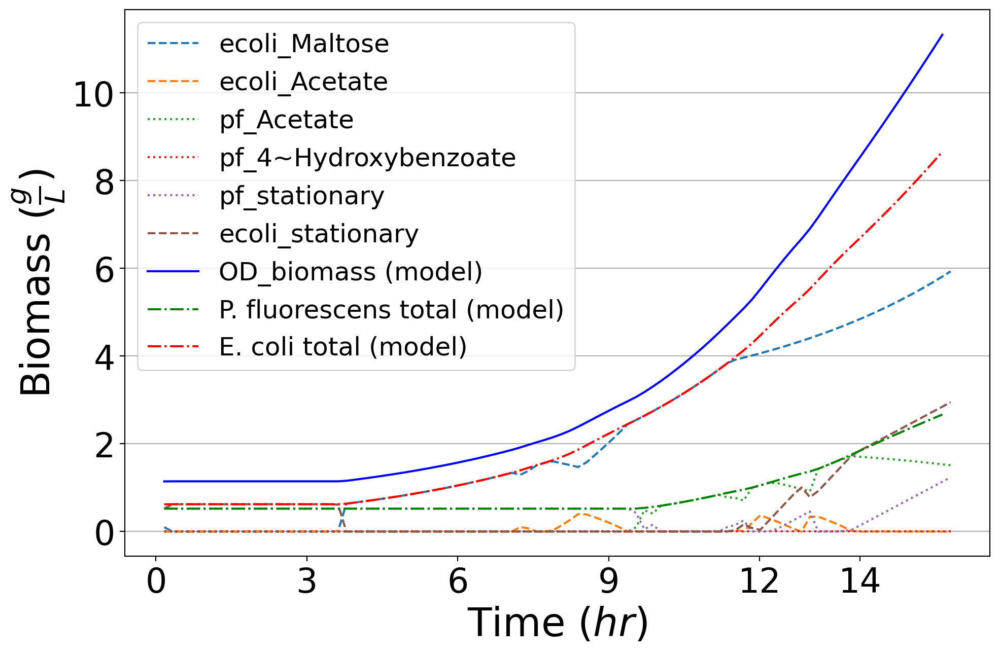

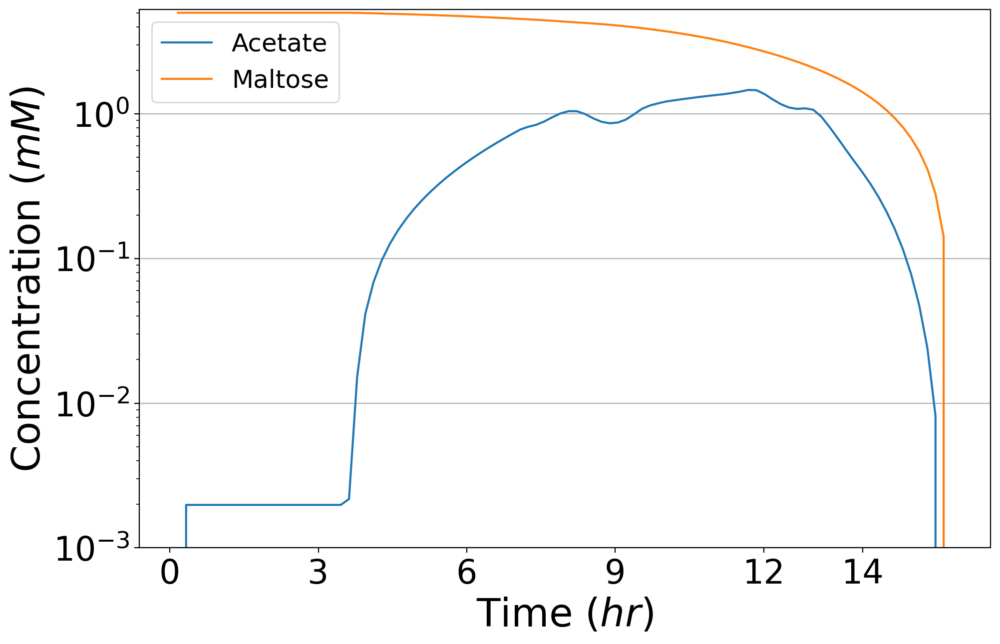

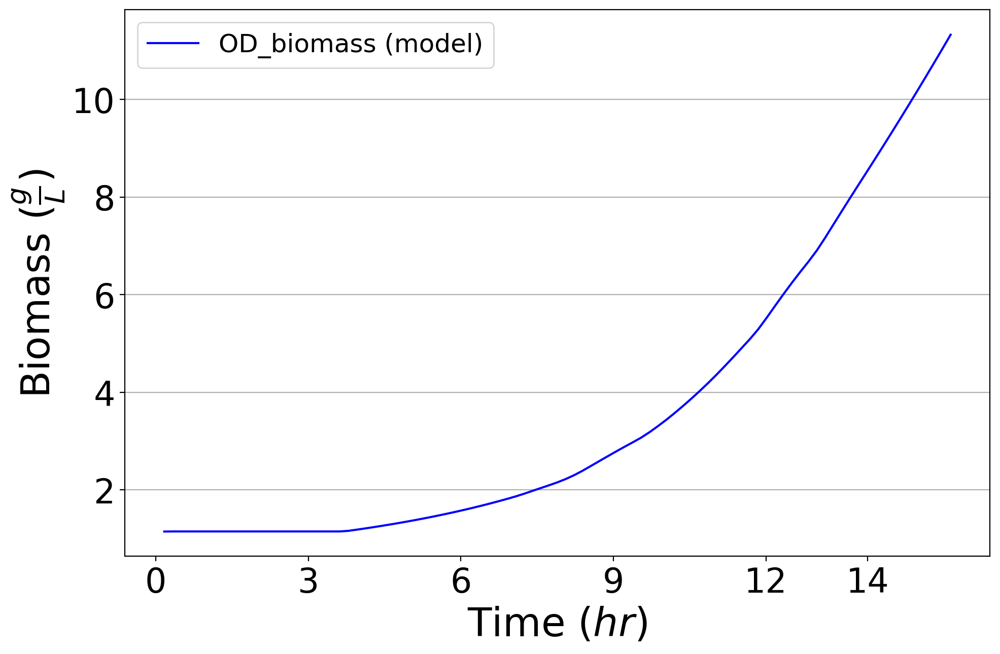

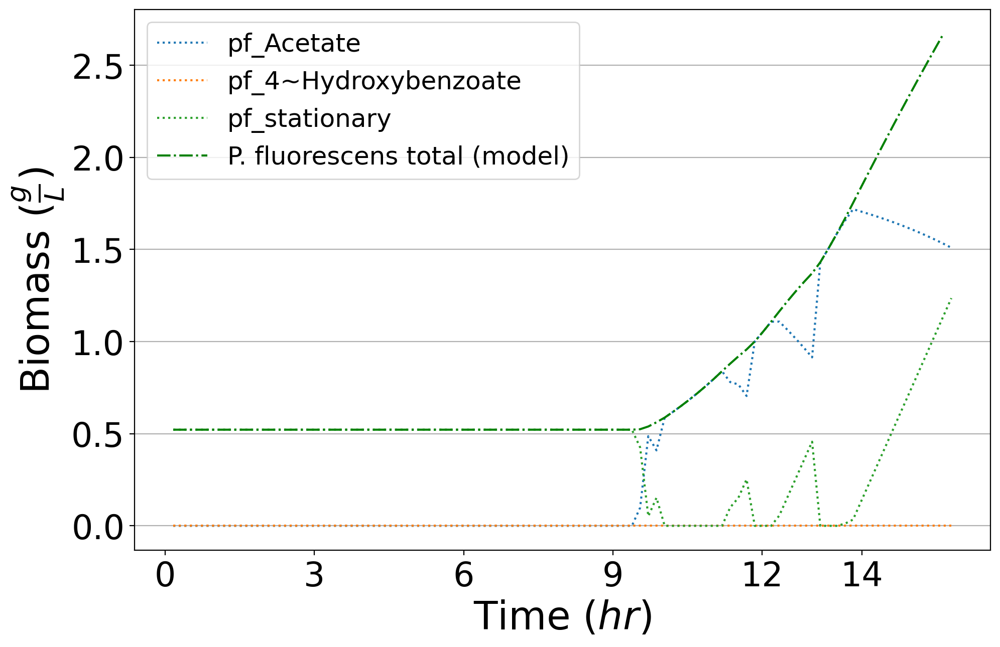

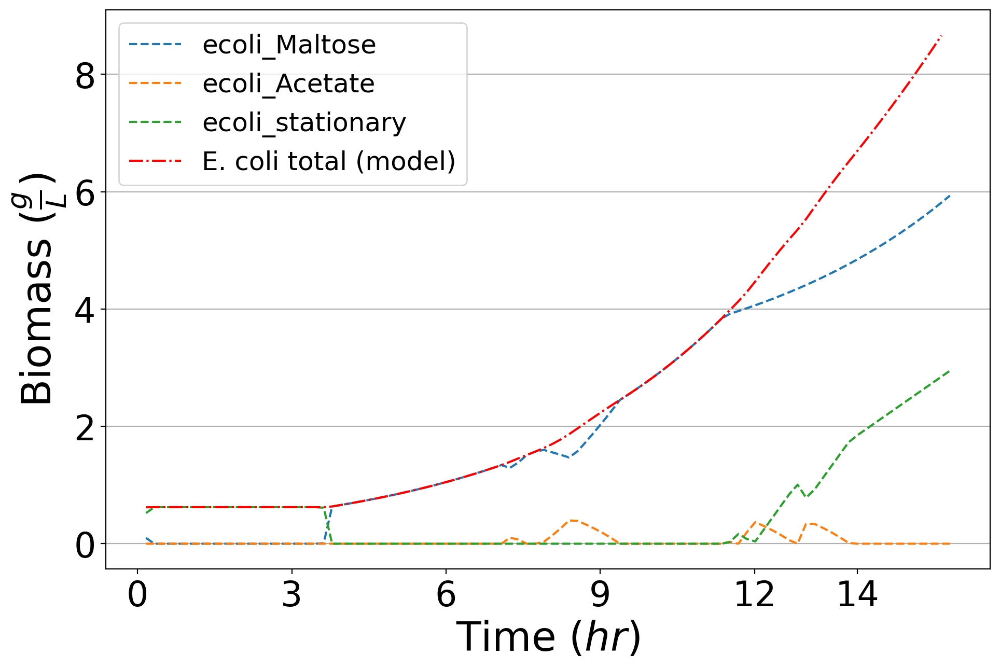

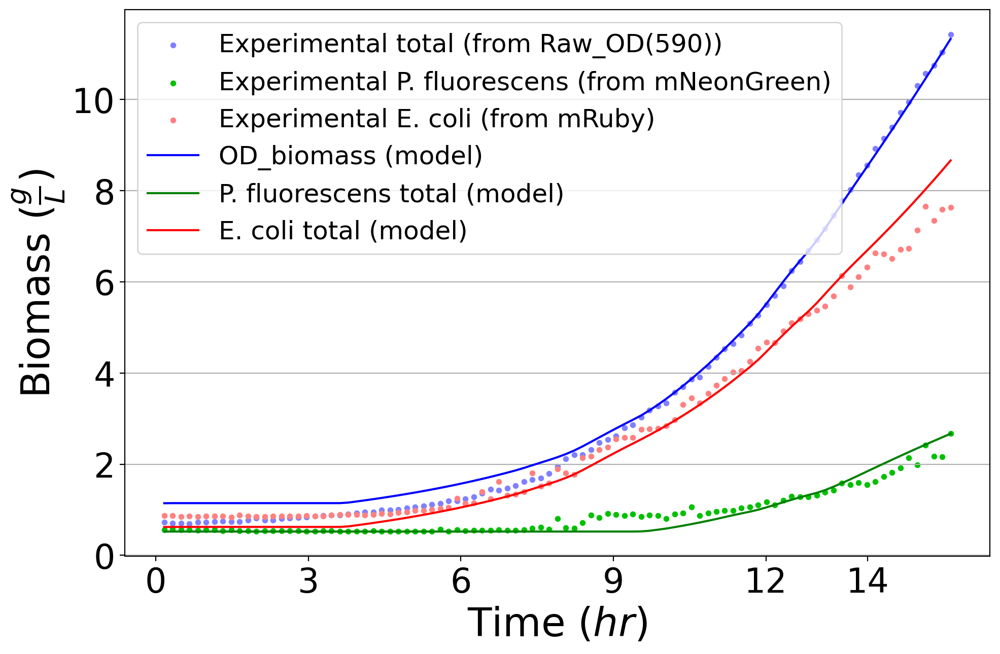

In [29]:
%%time 

maltose_co.compute(update_graphs("G6"), None, None, True, "test_primals_simple.json")

In [7]:
from pprint import pprint
obj_expr = [{'elements': [{'elements': [0.005, 'b_pf_stationary-G6-1'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-2'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-3'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-4'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-5'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-6'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-7'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-8'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-9'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-10'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-11'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-12'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-13'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-14'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-15'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-16'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-17'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-18'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-19'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-20'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-21'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-22'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-23'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-24'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-25'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-26'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-27'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-28'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-29'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-30'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-31'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-32'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-33'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-34'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-35'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-36'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-37'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-38'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-39'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-40'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-41'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-42'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-43'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-44'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-45'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-46'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-47'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-48'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-49'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-50'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-51'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-52'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-53'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-54'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-55'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-56'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-57'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-58'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-59'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-60'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-61'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-62'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-63'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-64'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-65'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-66'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-67'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-68'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-69'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-70'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-71'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-72'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-73'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-74'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-75'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-76'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-77'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-78'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-79'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-80'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-81'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-82'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-83'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-84'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-85'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-86'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-87'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-88'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.004375, 'b_pf_stationary-G6-89'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.00375, 'b_pf_stationary-G6-90'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.003125, 'b_pf_stationary-G6-91'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.0025, 'b_pf_stationary-G6-92'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.001875, 'b_pf_stationary-G6-93'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.0012500000000000002, 'b_pf_stationary-G6-94'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.0006249999999999997, 'b_pf_stationary-G6-95'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.0, 'b_pf_stationary-G6-96'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-1'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-2'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-3'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-4'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-5'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-6'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-7'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-8'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-9'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-10'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-11'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-12'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-13'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-14'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-15'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-16'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-17'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-18'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-19'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-20'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-21'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-22'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-23'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-24'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-25'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-26'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-27'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-28'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-29'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-30'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-31'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-32'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-33'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-34'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-35'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-36'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-37'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-38'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-39'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-40'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-41'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-42'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-43'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-44'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-45'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-46'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-47'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-48'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-49'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-50'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-51'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-52'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-53'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-54'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-55'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-56'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-57'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-58'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-59'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-60'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-61'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-62'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-63'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-64'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-65'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-66'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-67'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-68'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-69'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-70'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-71'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-72'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-73'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-74'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-75'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-76'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-77'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-78'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-79'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-80'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-81'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-82'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-83'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-84'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-85'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-86'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-87'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.005, 'b_ecoli_stationary-G6-88'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.004375, 'b_ecoli_stationary-G6-89'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.00375, 'b_ecoli_stationary-G6-90'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.003125, 'b_ecoli_stationary-G6-91'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.0025, 'b_ecoli_stationary-G6-92'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.001875, 'b_ecoli_stationary-G6-93'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.0012500000000000002, 'b_ecoli_stationary-G6-94'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.0006249999999999997, 'b_ecoli_stationary-G6-95'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [0.0, 'b_ecoli_stationary-G6-96'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-1'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-1'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-2'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-2'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-3'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-3'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-4'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-4'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-5'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-5'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-6'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-6'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-7'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-7'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-8'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-8'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-9'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-9'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-10'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-10'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-11'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-11'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-12'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-12'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-13'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-13'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-14'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-14'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-15'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-15'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-16'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-16'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-17'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-17'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-18'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-18'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-19'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-19'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-20'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-20'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-21'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-21'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-22'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-22'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-23'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-23'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-24'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-24'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-25'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-25'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-26'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-26'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-27'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-27'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-28'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-28'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-29'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-29'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-30'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-30'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-31'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-31'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-32'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-32'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-33'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-33'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-34'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-34'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-35'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-35'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-36'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-36'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-37'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-37'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-38'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-38'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-39'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-39'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-40'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-40'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-41'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-41'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-42'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-42'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-43'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-43'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-44'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-44'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-45'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-45'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-46'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-46'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-47'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-47'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-48'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-48'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-49'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-49'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-50'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-50'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-51'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-51'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-52'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-52'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-53'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-53'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-54'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-54'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-55'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-55'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-56'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-56'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-57'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-57'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-58'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-58'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-59'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-59'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-60'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-60'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-61'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-61'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-62'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-62'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-63'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-63'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-64'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-64'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-65'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-65'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-66'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-66'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-67'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-67'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-68'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-68'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-69'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-69'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-70'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-70'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-71'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-71'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-72'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-72'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-73'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-73'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-74'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-74'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-75'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-75'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-76'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-76'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-77'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-77'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-78'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-78'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-79'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-79'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-80'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-80'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-81'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-81'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-82'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-82'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-83'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-83'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-84'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-84'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-85'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-85'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-86'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-86'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-87'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-87'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-88'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-88'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-89'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-89'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-90'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-90'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-91'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-91'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-92'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-92'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-93'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-93'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-94'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-94'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'OD|Raw_OD(590)|diffpos-G6-95'], 'operation': 'Mul'}, {'elements': [1, 'OD|Raw_OD(590)|diffneg-G6-95'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-1'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-1'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-2'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-2'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-3'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-3'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-4'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-4'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-5'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-5'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-6'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-6'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-7'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-7'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-8'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-8'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-9'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-9'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-10'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-10'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-11'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-11'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-12'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-12'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-13'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-13'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-14'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-14'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-15'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-15'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-16'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-16'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-17'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-17'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-18'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-18'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-19'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-19'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-20'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-20'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-21'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-21'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-22'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-22'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-23'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-23'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-24'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-24'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-25'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-25'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-26'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-26'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-27'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-27'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-28'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-28'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-29'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-29'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-30'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-30'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-31'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-31'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-32'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-32'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-33'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-33'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-34'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-34'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-35'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-35'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-36'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-36'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-37'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-37'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-38'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-38'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-39'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-39'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-40'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-40'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-41'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-41'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-42'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-42'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-43'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-43'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-44'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-44'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-45'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-45'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-46'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-46'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-47'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-47'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-48'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-48'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-49'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-49'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-50'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-50'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-51'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-51'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-52'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-52'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-53'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-53'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-54'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-54'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-55'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-55'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-56'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-56'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-57'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-57'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-58'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-58'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-59'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-59'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-60'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-60'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-61'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-61'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-62'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-62'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-63'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-63'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-64'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-64'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-65'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-65'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-66'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-66'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-67'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-67'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-68'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-68'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-69'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-69'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-70'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-70'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-71'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-71'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-72'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-72'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-73'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-73'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-74'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-74'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-75'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-75'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-76'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-76'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-77'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-77'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-78'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-78'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-79'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-79'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-80'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-80'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-81'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-81'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-82'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-82'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-83'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-83'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-84'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-84'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-85'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-85'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-86'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-86'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-87'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-87'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-88'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-88'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-89'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-89'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-90'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-90'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-91'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-91'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-92'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-92'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-93'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-93'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-94'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-94'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'pf|mNeonGreen|diffpos-G6-95'], 'operation': 'Mul'}, {'elements': [1, 'pf|mNeonGreen|diffneg-G6-95'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-1'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-1'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-2'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-2'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-3'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-3'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-4'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-4'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-5'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-5'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-6'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-6'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-7'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-7'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-8'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-8'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-9'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-9'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-10'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-10'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-11'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-11'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-12'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-12'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-13'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-13'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-14'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-14'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-15'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-15'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-16'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-16'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-17'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-17'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-18'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-18'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-19'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-19'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-20'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-20'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-21'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-21'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-22'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-22'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-23'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-23'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-24'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-24'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-25'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-25'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-26'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-26'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-27'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-27'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-28'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-28'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-29'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-29'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-30'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-30'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-31'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-31'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-32'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-32'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-33'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-33'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-34'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-34'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-35'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-35'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-36'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-36'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-37'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-37'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-38'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-38'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-39'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-39'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-40'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-40'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-41'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-41'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-42'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-42'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-43'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-43'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-44'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-44'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-45'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-45'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-46'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-46'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-47'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-47'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-48'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-48'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-49'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-49'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-50'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-50'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-51'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-51'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-52'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-52'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-53'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-53'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-54'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-54'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-55'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-55'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-56'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-56'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-57'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-57'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-58'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-58'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-59'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-59'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-60'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-60'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-61'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-61'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-62'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-62'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-63'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-63'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-64'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-64'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-65'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-65'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-66'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-66'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-67'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-67'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-68'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-68'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-69'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-69'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-70'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-70'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-71'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-71'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-72'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-72'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-73'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-73'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-74'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-74'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-75'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-75'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-76'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-76'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-77'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-77'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-78'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-78'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-79'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-79'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-80'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-80'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-81'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-81'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-82'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-82'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-83'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-83'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-84'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-84'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-85'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-85'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-86'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-86'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-87'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-87'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-88'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-88'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-89'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-89'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-90'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-90'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-91'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-91'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-92'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-92'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-93'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-93'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-94'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-94'], 'operation': 'Mul'}], 'operation': 'Add'}, {'elements': [{'elements': [1, 'ecoli|mRuby|diffpos-G6-95'], 'operation': 'Mul'}, {'elements': [1, 'ecoli|mRuby|diffneg-G6-95'], 'operation': 'Mul'}], 'operation': 'Add'}]
pprint(obj_expr)

[{'elements': [{'elements': [0.005, 'b_pf_stationary-G6-1'],
                'operation': 'Mul'}],
  'operation': 'Add'},
 {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-2'],
                'operation': 'Mul'}],
  'operation': 'Add'},
 {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-3'],
                'operation': 'Mul'}],
  'operation': 'Add'},
 {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-4'],
                'operation': 'Mul'}],
  'operation': 'Add'},
 {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-5'],
                'operation': 'Mul'}],
  'operation': 'Add'},
 {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-6'],
                'operation': 'Mul'}],
  'operation': 'Add'},
 {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-7'],
                'operation': 'Mul'}],
  'operation': 'Add'},
 {'elements': [{'elements': [0.005, 'b_pf_stationary-G6-8'],
                'operation': 'Mul'}],
  'operation': 'Add'},
 {'elements': [{'element

None
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'stationary', 'acetate', '4HB', 'malt'},
 'species': ['OD', 'pf', 'ecoli'],
 'trial': 'G6'}


C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommPhitting\mscommphitting.py:80: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)
ic| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_acetate'
ic| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_malt'
ic| mscommphitting.py:1077 in graph()- basename: 'b_pf_acetate'
ic| mscommphitting.py:1077 in graph()- basename: 'b_pf_4HB'
ic| mscommphitting.py:1077 in graph()- basename: 'b_pf_stationary'
ic| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_stationary'
ic| mscommphitting.py:1148 in graph()- name: 'OD'
ic| mscommphitting.py:1148 in graph()- name: 'pf'
ic| mscommphitting.py:1148 in graph()- name: 'ecoli'


{'stationary', 'acetate', '4HB', 'malt'}
{'stationary', 'acetate', '4HB', 'malt'}
{'stationary', 'acetate', '4HB', 'malt'}
{'stationary', 'acetate', '4HB', 'malt'}
{'stationary', 'acetate', '4HB', 'malt'}
{'stationary', 'acetate', '4HB', 'malt'}
graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00179', 'cpd00029'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'trial': 'G6'}
graph_2
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
         

ic| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_acetate'
ic| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_malt'
ic| mscommphitting.py:1077 in graph()- basename: 'b_pf_acetate'
ic| mscommphitting.py:1077 in graph()- basename: 'b_pf_4HB'
ic| mscommphitting.py:1077 in graph()- basename: 'b_pf_stationary'
ic| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_stationary'
ic| mscommphitting.py:1148 in graph()- name: 'OD'
ic| mscommphitting.py:1148 in graph()- name: 'pf'


{'stationary', 'acetate', '4HB', 'malt'}
{'stationary', 'acetate', '4HB', 'malt'}
{'stationary', 'acetate', '4HB', 'malt'}
{'stationary', 'acetate', '4HB', 'malt'}
{'stationary', 'acetate', '4HB', 'malt'}
{'stationary', 'acetate', '4HB', 'malt'}


ic| mscommphitting.py:1148 in graph()- name: 'ecoli'
ic| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_acetate'
ic| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_malt'
ic| mscommphitting.py:1077 in graph()- basename: 'b_pf_acetate'
ic| mscommphitting.py:1077 in graph()- basename: 'b_pf_4HB'
ic| mscommphitting.py:1077 in graph()- basename: 'b_pf_stationary'
ic| mscommphitting.py:1077 in graph()- basename: 'b_ecoli_stationary'
ic| mscommphitting.py:1148 in graph()- name: 'OD'
ic| mscommphitting.py:1148 in graph()- name: 'pf'
ic| mscommphitting.py:1148 in graph()- name: 'ecoli'


graph_3
{'content': 'total_biomass',
 'experimental_data': True,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'species': ['OD', 'pf', 'ecoli'],
 'trial': 'G6'}


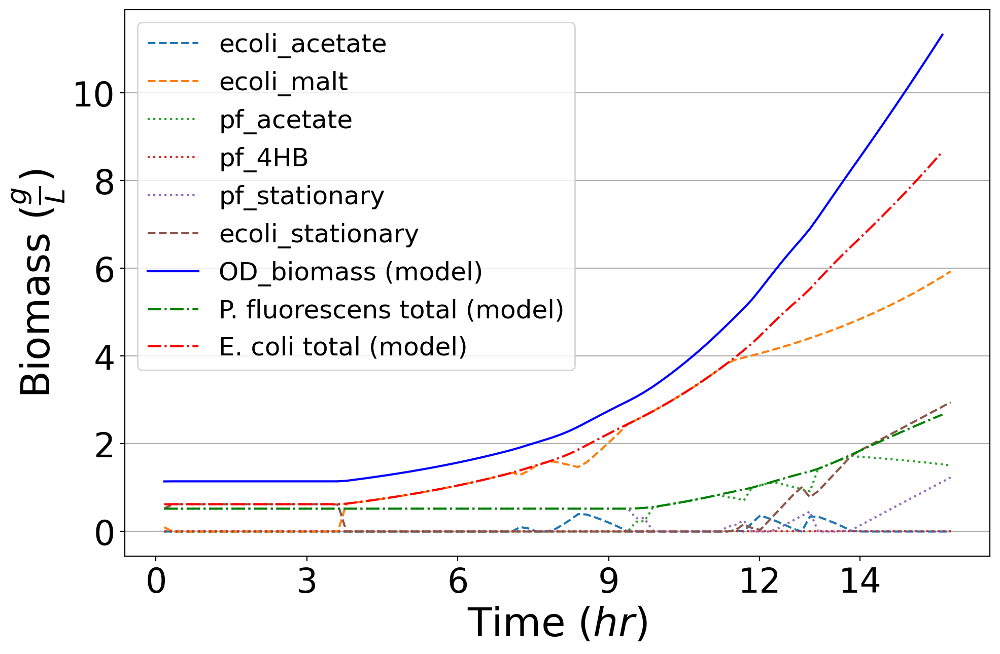

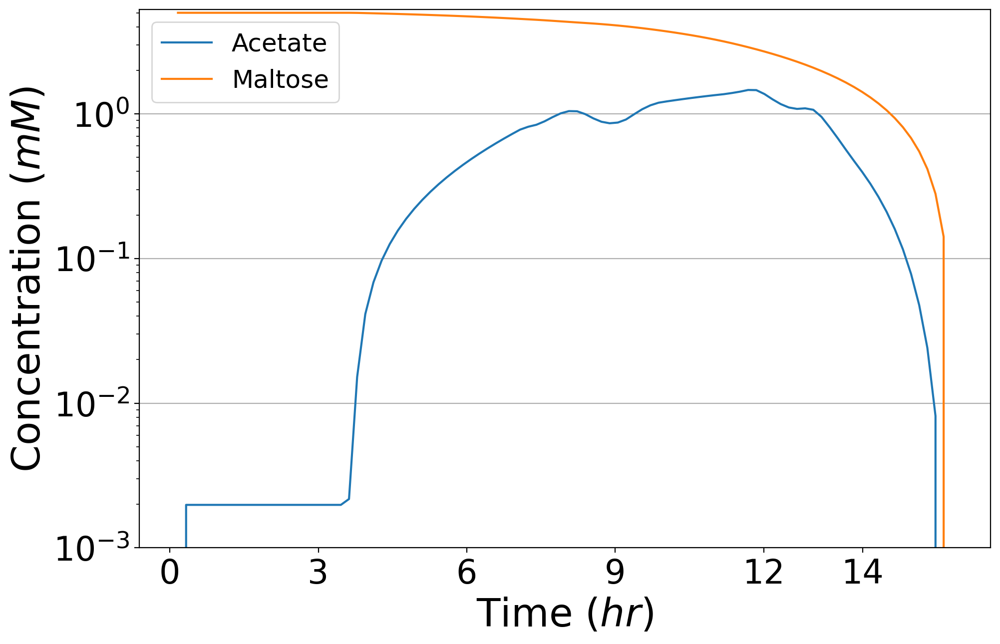

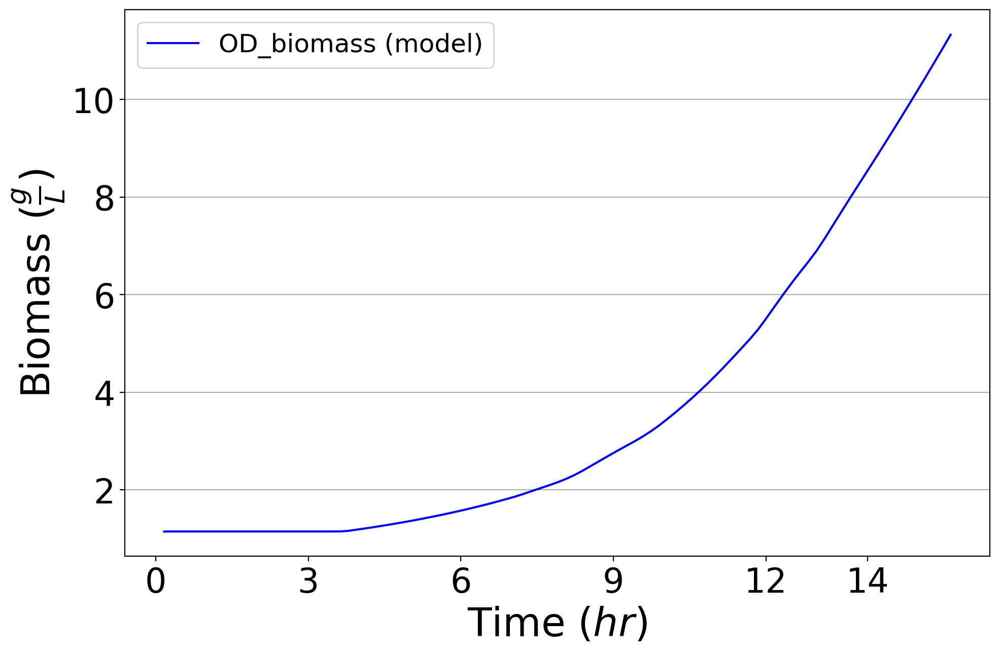

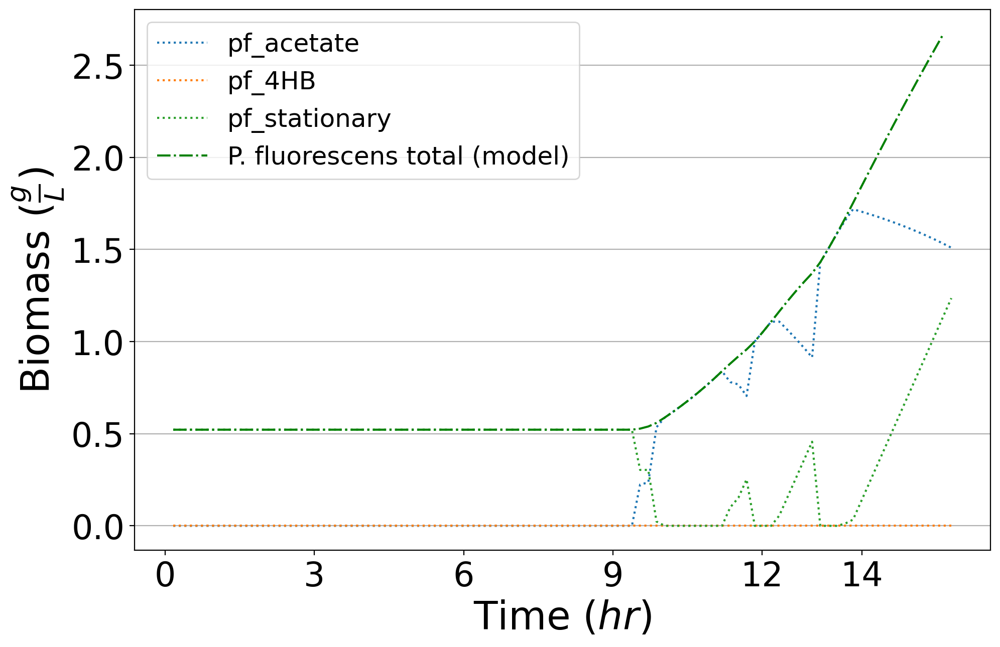

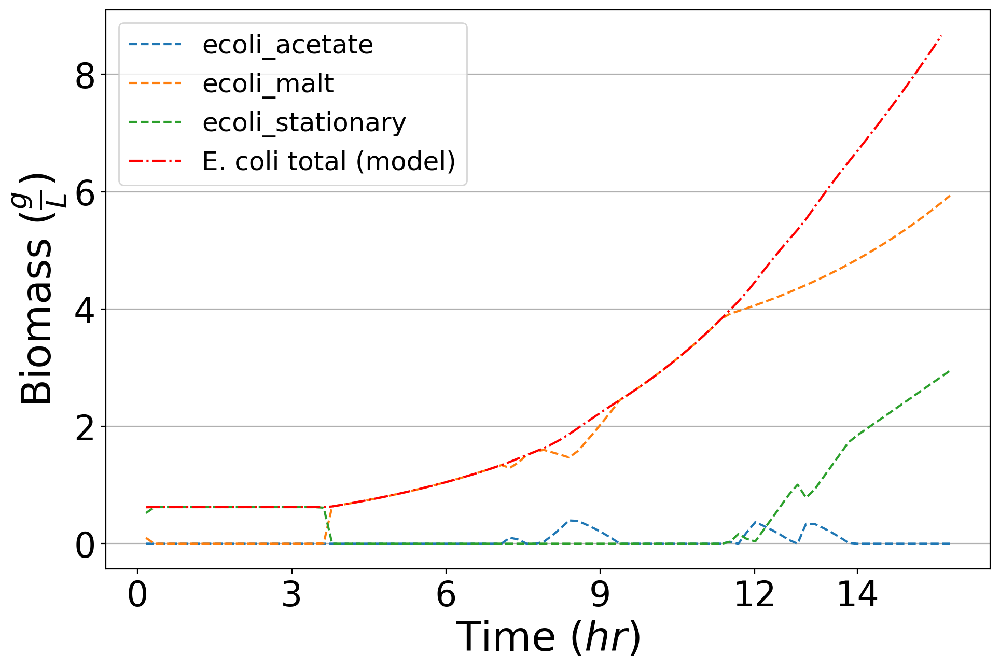

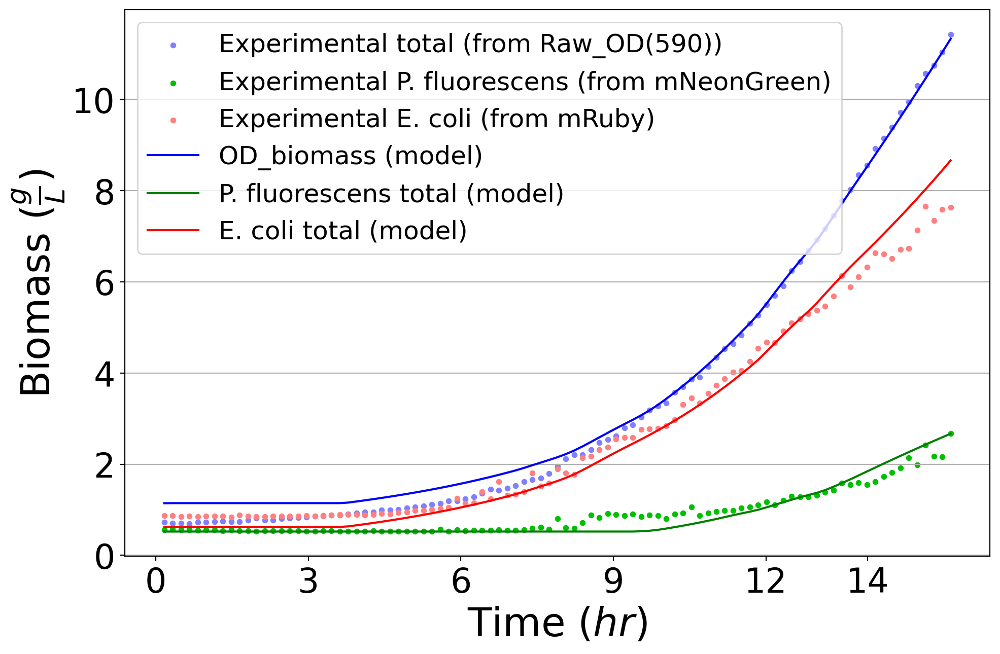

In [ ]:
%run ../mscommphitting.py
maltose_co.graph(update_graphs("G6"), "test_primals.json", "maltose_co.zip", publishing=True)

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommPhitting\mscommphitting.py:80: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


Done with concentrations and biomass loops: 0.01875 min
Done with DCC loop: 0.0020833333333333333 min
Done with the DBC & diffc loop: 0.005729166666666666 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.11640625 min


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_coculture.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 0.11354166666666667 min
starting optimization


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'test_primals.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


maltose_co.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'malt', 'acetate', '4HB'},
 'species': ['OD', 'pf', 'ecoli'],
 'trial': 'G6'}
graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00179', 'cpd00029'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle':

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G6_all species_OD,pf,ecoli_total_biomass.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G6_all species_malt,acetate,4HB phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G6_cpd00179,cpd00029_c.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Optimization completed in 87.64583333333333 minutes
Graphing completed in 0.01328125 minutes


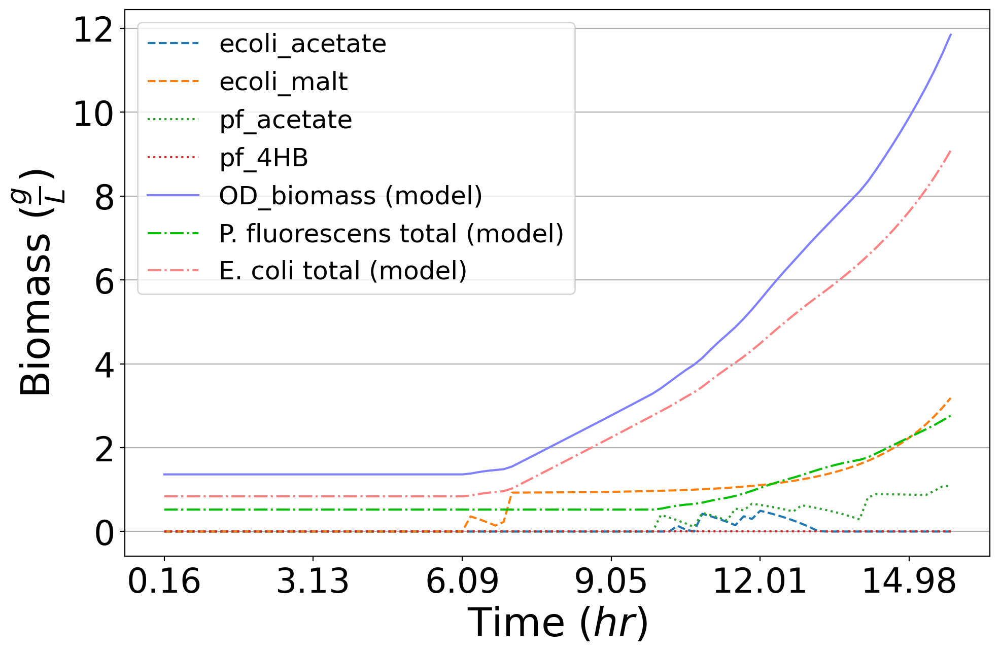

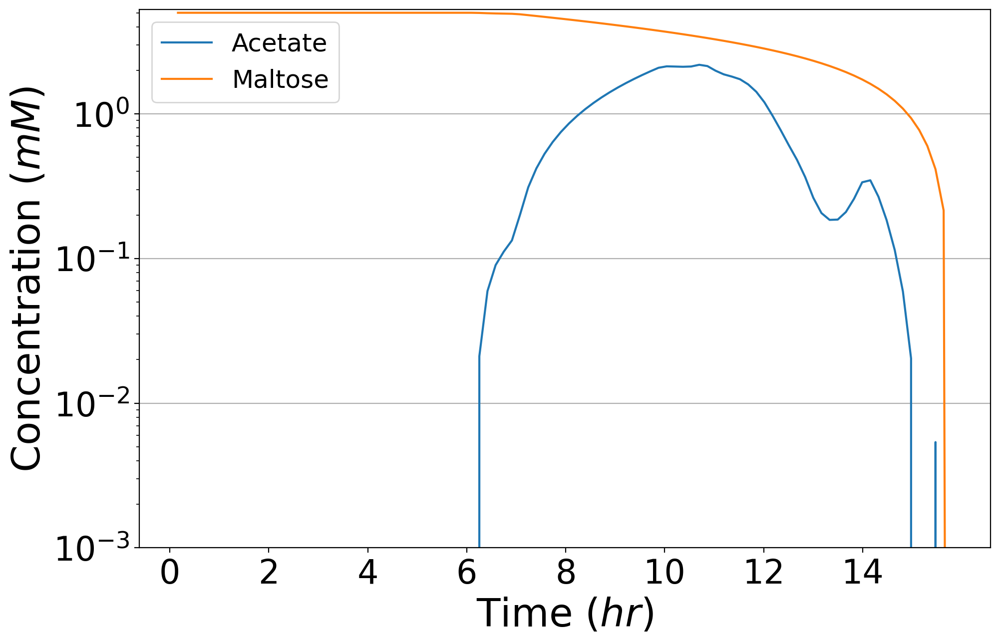

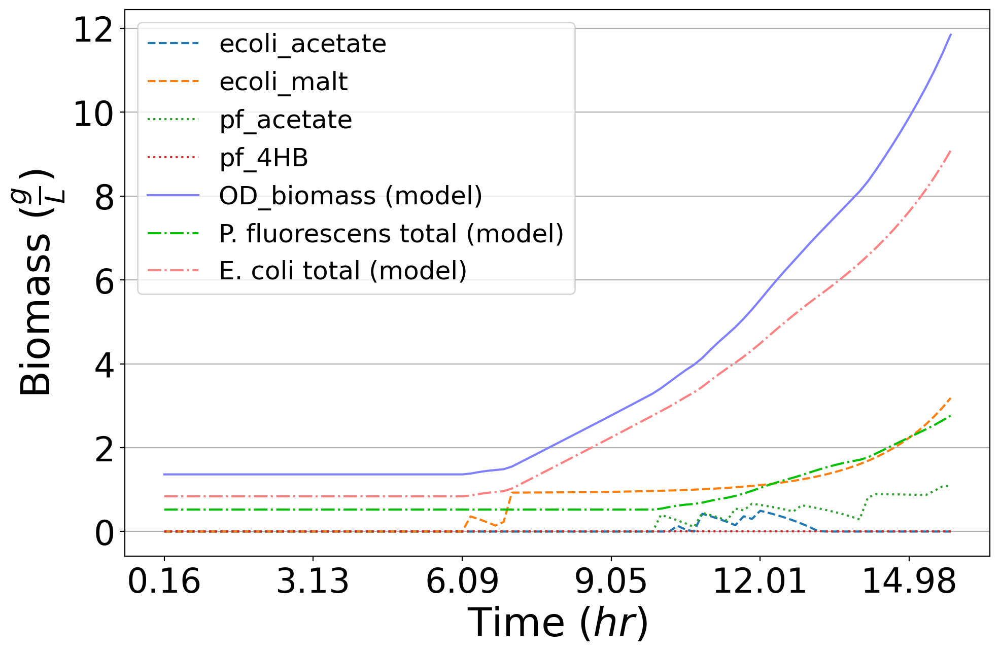

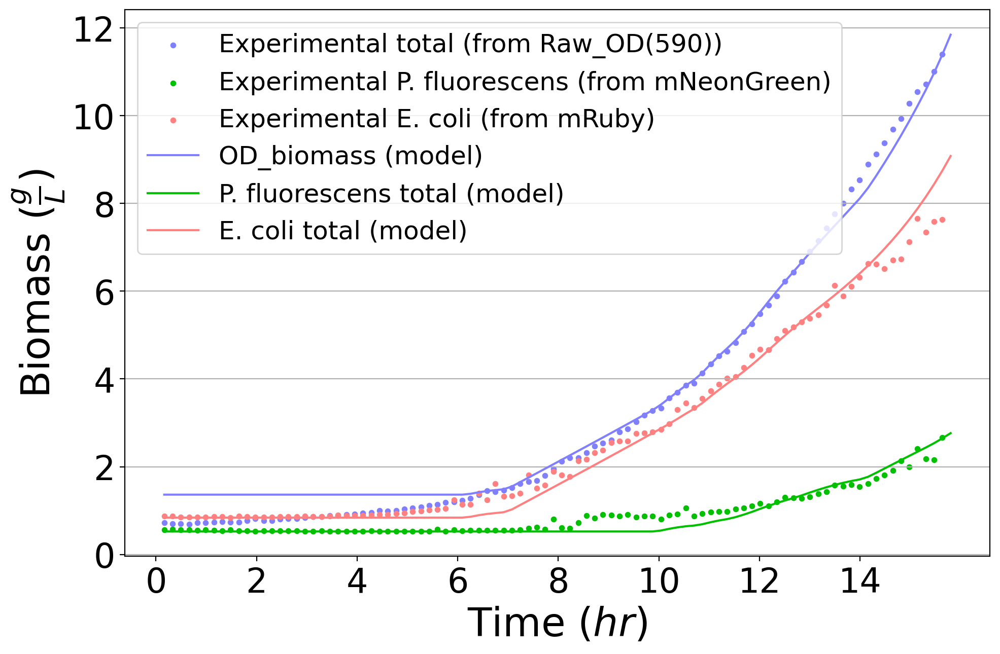

In [ ]:
%run ../mscommphitting.py

def _partition_coefs(initial_val, divisor):
    return (initial_val, initial_val/divisor, initial_val/divisor**2, initial_val/divisor**3, initial_val/divisor**4)

maltose_co = CommPhitting(fluxes_df, standardized_carbon_conc, media_conc, '../../../../ModelSEED/ModelSEEDDatabase', growth_df, experimental_metadata)
maltose_co.define_problem(
    parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 5e-3},
    mets_to_track = ["cpd00179","cpd00029"],
    rel_final_conc = {"cpd00179":0.1},
    zero_start = ["cpd00029", "cpd00136"],
    abs_final_conc = {"cpd00029":0}, # metabolomics data
    export_zip_name = 'maltose_co.zip',
    requisite_biomass = requisite_biomass,
    biomass_coefs=_partition_coefs(10, 5),
    export_lp = "maltose_coculture.lp"
)
maltose_co.compute(update_graphs("G6"), None, None, True, "test_primals.json")

In [ ]:
%run ../mscommphitting.py

# define parameters
data_timesteps: dict = None
export_zip_name: str = None
export_parameters: bool = True
export_lp: str = f'solveKcat.lp'
publishing=True
primals_export_path=None

parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 5e-3}
mets_to_track = ["cpd00179","cpd00029"]
rel_final_conc = {"cpd00179":0.1}
zero_start = ["cpd00029", "cpd00136"]
abs_final_conc = {"cpd00029":0} # metabolomics data
graphs = update_graphs("G6")
export_zip_name = 'maltose_co.zip' 
requisite_biomass = requisite_biomass
export_lp = "maltose_coculture.lp"


biomass_partition_coefs = [_partition_coefs(100, 10), _partition_coefs(4, 2), _partition_coefs(1, 2)]
kcat_primal = None

def _partition_coefs(initial_val, divisor):
    return (initial_val, initial_val/divisor, initial_val/divisor**2, initial_val/divisor**3, initial_val/divisor**4)

    
for index, coefs in enumerate(biomass_partition_coefs):
    # solve for growth rate constants with the previously solved biomasses
    new_simulation = CommPhitting(FBAHelper.parse_df(fluxes_df), standardized_carbon_conc, media_conc,
                                  '../../../../ModelSEED/ModelSEEDDatabase', growth_df, experimental_metadata)
    new_simulation.define_problem(
        parameters, mets_to_track, rel_final_conc, zero_start, abs_final_conc,
        data_timesteps, export_zip_name, export_parameters, export_lp, kcat_primal, coefs, requisite_biomass)
    time1 = process_time()
    primals_export_path = primals_export_path or re.sub(r"(.lp)", ".json", export_lp)
    new_simulation.compute(graphs, export_zip_name, None, publishing, primals_export_path)
    kcat_primal = parse_primals(new_simulation.values, "kcat", coefs, new_simulation.parameters["kcat"])
    time2 = process_time()
    print(f"Done simulating with the coefficients for biomass partitions: {index}"
          f"\n{(time2-time1)/60} minutes")
    pprint(kcat_primal)
return {k: val for k, val in new_simulation.values.items() if "kcat" in k}
# maltose_co.compute(update_graphs("G6"))

# THIS RUN WAS TERMINATED AFTER 27250 SECONDS

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommPhitting\mscommphitting.py:80: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


Done with concentrations and biomass loops: 0.03515625 min
Done with DCC loop: 0.0018229166666666667 min
Done with the DBC & diffc loop: 0.005208333333333333 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.11536458333333334 min


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_coculture.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


In [ ]:
%run ../mscommphitting.py

maltose_co = CommPhitting(fluxes_df, standardized_carbon_conc, media_conc, '../../../../ModelSEED/ModelSEEDDatabase', growth_df, experimental_metadata)
maltose_co.fit_kcat(
    parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 5e-3},
    mets_to_track = ["cpd00179","cpd00029"],
    rel_final_conc = {"cpd00179":0.1},
    zero_start = ["cpd00029", "cpd00136"],
    abs_final_conc = {"cpd00029":0}, # metabolomics data
    graphs = update_graphs("G6"),
    export_zip_name = 'maltose_co.zip', 
    requisite_biomass = requisite_biomass,
    export_lp = "maltose_coculture.lp")

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommPhitting\mscommphitting.py:80: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


Done with concentrations and biomass loops: 0.01796875 min
Done with DCC loop: 0.0020833333333333333 min
Done with the DBC & diffc loop: 0.005208333333333333 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.14557291666666666 min


#### Pseudomonas

In [8]:
%run ../data/standardized_data/datastandardization.py
growth_data_path="../data/Jeffs_data/PF-EC 4-29-22 ratios and 4HB changes.xlsx"
time1 = process_time()
experimental_metadata, growth_df, fluxes_df, standardized_carbon_conc, requisite_biomass, trial_name_conversion, data_timestep_hr, simulation_timestep, media_conc = GrowthData.process(
    community_members = {
        pf: {
            'name': 'pf',
            'phenotypes': {
                'acetate': {"consumed":["cpd00029"]}, # kbase_api.get_from_ws("93465/25/1"), #'93465/11/1'), 
                '4HB': {"consumed":["cpd00136"]} # kbase_api.get_from_ws('	93465/27/1')} #93465/15/1')}
                }
        }
    },
    data_paths = {'path':growth_data_path, 'Raw OD(590)':'OD', 'mNeonGreen':'pf'},
    species_abundances = species_abundances,
    carbon_conc_series = carbon_conc_series,
    ignore_trials = {'rows': ['C', 'D', 'E', 'F', 'G'], 'columns': [1,3,4,5,6,7,8,9,10,11,12]},
    species_identities_rows = species_identities_rows,
    significant_deviation=None
)

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommFitting\data\standardized_data\datastandardization.py:112: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


acetate {'consumed': ['cpd00029']}
4HB {'consumed': ['cpd00136']}
The model GCF_001612705.1.RAST.mdl is unable to be simulated with pFBA and yields a < None (infeasible). > error.
The ['B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12'] trials were dropped from the OD measurements per the ignore_trials parameter.
The ['B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10',

In [9]:
print(carbon_conc_series)

{'rows': {'cpd00136': {'B': 0, 'C': 0, 'D': 1, 'E': 1, 'F': 4, 'G': 4}, 'cpd00179': {'B': 5, 'C': 5, 'D': 5, 'E': 5, 'F': 5, 'G': 5}}, 'columns': {}}


In [10]:
display(requisite_biomass)

{'G1': {'pf|mNeonGreen': 0}}

In [11]:
display(experimental_metadata, growth_df, fluxes_df, standardized_carbon_conc, trial_name_conversion, data_timestep_hr, simulation_timestep, media_conc)

,trial_IDs,short_code,base_media,additional_compounds,strains,date
0,r1_pf-,G1,minimal components media,cpd00179:5:5,pf:r1,"Apr 29, 22"
1,r50_pf-,G2,minimal components media,cpd00179:5:5,pf:r50,"Apr 29, 22"
2,r20_pf-,G3,minimal components media,cpd00179:5:5,pf:r20,"Apr 29, 22"
3,r10_pf-,G4,minimal components media,cpd00179:5:5,pf:r10,"Apr 29, 22"
4,r3_pf-,G5,minimal components media,cpd00179:5:5,pf:r3,"Apr 29, 22"
5,r1_pf-,G6,minimal components media,cpd00179:5:5,pf:r1,"Apr 29, 22"
6,r1_pf-,G7,minimal components media,cpd00179:5:5,pf:r1,"Apr 29, 22"
7,r1_pf-,G8,minimal components media,cpd00179:5:5,pf:r1,"Apr 29, 22"
8,r1_pf-,G9,minimal components media,cpd00179:5:5,pf:r1,"Apr 29, 22"
9,,G10,minimal components media,cpd00179:5:5,pf:r0,"Apr 29, 22"


,trial_IDs,Time (s),OD:Raw_OD(590),pf:mNeonGreen
short_codes,,,,
G1,r1_pf-,0.0000,0.068419,23472.0
G1,r1_pf-,595.8665,0.070793,22608.0
G1,r1_pf-,1187.7460,0.066054,22663.0
G1,r1_pf-,1780.2145,0.064892,22547.0
G1,r1_pf-,2372.7100,0.065168,22284.0
G1,r1_pf-,2965.2370,0.065911,22194.0
G1,r1_pf-,3557.5625,0.065767,22015.0
G1,r1_pf-,4149.9960,0.066293,21854.0
G1,r1_pf-,4742.4155,0.067431,21309.0


,pf_acetate,pf_4HB,pf_stationary
rxn,,,
EX_cpd00001_e0,4.533296e+00,2.449417e+00,0
EX_cpd00007_e0,-2.025521e+00,-5.333032e+00,0
EX_cpd00009_e0,-7.625410e-02,-7.625410e-02,0
EX_cpd00011_e0,2.377641e+00,5.685222e+00,0
EX_cpd00012_e0,0.000000e+00,-8.351191e-15,0
EX_cpd00013_e0,-8.611666e-01,-8.611666e-01,0
EX_cpd00029_e0,-3.063614e+00,0.000000e+00,0
EX_cpd00030_e0,-2.806159e-04,-2.806159e-04,0
EX_cpd00034_e0,-2.806159e-04,-2.806159e-04,0


{'cpd00136': {'G1': 0,
  'G2': 0,
  'G3': 0,
  'G4': 0,
  'G5': 0,
  'G6': 0,
  'G7': 0,
  'G8': 0,
  'G9': 0,
  'G10': 0,
  'G11': 0,
  'G12': 0,
  'G13': 0,
  'G14': 0,
  'G15': 0,
  'G16': 0,
  'G17': 0,
  'G18': 0,
  'G19': 0,
  'G20': 0,
  'G21': 0,
  'G22': 0,
  'G23': 1,
  'G24': 1,
  'G25': 1,
  'G26': 1,
  'G27': 1,
  'G28': 1,
  'G29': 1,
  'G30': 1,
  'G31': 1,
  'G32': 1,
  'G33': 1,
  'G34': 1,
  'G35': 1,
  'G36': 1,
  'G37': 1,
  'G38': 1,
  'G39': 1,
  'G40': 1,
  'G41': 1,
  'G42': 1,
  'G43': 1,
  'G44': 1,
  'G45': 4,
  'G46': 4,
  'G47': 4,
  'G48': 4,
  'G49': 4,
  'G50': 4,
  'G51': 4,
  'G52': 4,
  'G53': 4,
  'G54': 4,
  'G55': 4,
  'G56': 4,
  'G57': 4,
  'G58': 4,
  'G59': 4,
  'G60': 4,
  'G61': 4,
  'G62': 4,
  'G63': 4,
  'G64': 4,
  'G65': 4,
  'G66': 4},
 'cpd00179': {'G1': 5,
  'G2': 5,
  'G3': 5,
  'G4': 5,
  'G5': 5,
  'G6': 5,
  'G7': 5,
  'G8': 5,
  'G9': 5,
  'G10': 5,
  'G11': 5,
  'G12': 5,
  'G13': 5,
  'G14': 5,
  'G15': 5,
  'G16': 5,
  'G17': 

{'B': {'2': ('G1', 'r1_pf-'),
  '3': ('G2', 'r50_pf-'),
  '4': ('G3', 'r20_pf-'),
  '5': ('G4', 'r10_pf-'),
  '6': ('G5', 'r3_pf-'),
  '7': ('G6', 'r1_pf-'),
  '8': ('G7', 'r1_pf-'),
  '9': ('G8', 'r1_pf-'),
  '10': ('G9', 'r1_pf-'),
  '11': ('G10', ''),
  '12': ('G11', '')},
 'C': {'2': ('G12', 'r1_pf-'),
  '3': ('G13', 'r50_pf-'),
  '4': ('G14', 'r20_pf-'),
  '5': ('G15', 'r10_pf-'),
  '6': ('G16', 'r3_pf-'),
  '7': ('G17', 'r1_pf-'),
  '8': ('G18', 'r1_pf-'),
  '9': ('G19', 'r1_pf-'),
  '10': ('G20', 'r1_pf-'),
  '11': ('G21', ''),
  '12': ('G22', '')},
 'D': {'2': ('G23', 'r1_pf-1_pf-'),
  '3': ('G24', 'r50_pf-1_pf-'),
  '4': ('G25', 'r20_pf-1_pf-'),
  '5': ('G26', 'r10_pf-1_pf-'),
  '6': ('G27', 'r3_pf-1_pf-'),
  '7': ('G28', 'r1_pf-1_pf-'),
  '8': ('G29', 'r1_pf-1_pf-'),
  '9': ('G30', 'r1_pf-1_pf-'),
  '10': ('G31', 'r1_pf-1_pf-'),
  '11': ('G32', '1_pf-'),
  '12': ('G33', '1_pf-')},
 'E': {'2': ('G34', 'r1_pf-1_pf-'),
  '3': ('G35', 'r50_pf-1_pf-'),
  '4': ('G36', 'r20_pf-1_pf-

0.16359110609103078

27.15612361111111

set()

In [1]:
growth_df[growth_df["short_codes"] == "G1"]

NameError: name 'growth_df' is not defined

In [12]:
%run ../mscommphitting.py

maltose_pf = CommPhitting(fluxes_df, standardized_carbon_conc, media_conc, growth_df, experimental_metadata)
try:
    if all([not y for x in requisite_biomass.values() for y in x.values()]):
        raise TypeError("Pseudomonas cannot grow in this media.")
    maltose_pf.fit_kcat(
        parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 5e-3},
        mets_to_track = ["cpd00179","cpd00029"],
        rel_final_conc = {"cpd00179":0.2},
        zero_start = ["cpd00029"],
        abs_final_conc = {"cpd00029":0.1}, # metabolomics data
        graphs = update_graphs("G1"),
        msdb_path = '../../../../ModelSEED/ModelSEEDDatabase',
        export_zip_name = 'simple_kinetics_loop.zip', 
        requisite_biomass = requisite_biomass,
        publishing = True,
        export_lp = "maltose_pf.lp")
except (NoFluxError, FeasibilityError, TypeError) as e:
    print(e)

Pseudomonas cannot grow in this media.


C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommFitting\mscommfitting.py:78: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


#### E. coli

In [5]:
%run ../data/standardized_data/datastandardization.py
growth_data_path="../data/Jeffs_data/PF-EC 4-29-22 ratios and 4HB changes.xlsx"
time1 = process_time()
experimental_metadata, growth_df, fluxes_df, standardized_carbon_conc, requisite_biomass, trial_name_conversion, data_timestep_hr, simulation_timestep, media_conc = GrowthData.process(
    community_members = {
        ecoli: {
            'name': 'ecoli', 
            'phenotypes': {
                'acetate': {"consumed":["cpd00029"]}, #kbase_api.get_from_ws('93465/13/1'), 
                'malt': {"consumed":["cpd00179"],
                         "excreted":["cpd00029"]} #kbase_api.get_from_ws("93465/23/1")} #'93465/9/1')}   # !!! The phenotype name must align with the experimental IDs for the graphs to find the appropriate data
            }
        }
    },
    data_paths = {'path':growth_data_path, 'Raw OD(590)':'OD', 'mRuby':'ecoli'},
    species_abundances = species_abundances,
    carbon_conc_series = carbon_conc_series,
    ignore_trials = {'rows': ['C', 'D', 'E', 'F', 'G'], 'columns': [1,2,3,4,5,6,7,8,9,10,12]},
    species_identities_rows = species_identities_rows
)

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommFitting\data\standardized_data\datastandardization.py:112: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


acetate {'consumed': ['cpd00029']}
malt {'consumed': ['cpd00179'], 'excreted': ['cpd00029']}
The ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B12', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12'] trials were dropped from the OD measurements per the ignore_trials parameter.
The [81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166] t

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommFitting\mscommfitting.py:79: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


Done with concentrations and biomass loops: 0.0036458333333333334 min
Done with DCC loop: 0.00078125 min
Done with the DBC & diffc loop: 0.0013020833333333333 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.06953125 min
Done exporting the content: 0.030208333333333334 min
starting optimization
maltose_ecoli.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'malt', 'acetate', 'stationary'},
 'species': ['OD', 'ecoli'],
 'trial': 'G10'}
graph_1
{'content': 'conc',
 'experimental_data': False,


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_ecoli.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 0.030989583333333334 min
starting optimization


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_ecoli.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


maltose_ecoli.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'malt', 'acetate', 'stationary'},
 'species': ['OD', 'ecoli'],
 'trial': 'G10'}
graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00179', 'cpd00029'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linest

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G10_all species_OD,ecoli_total_biomass.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G10_cpd00179,cpd00029_c.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G10_all species_malt,acetate,stationary phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done simulating with the coefficients for biomass partitions: 1
0.10026041666666667 minutes
{'ecoli': {'acetate': 9.16575, 'malt': 1.6500000000000001}}
Done with concentrations and biomass loops: 0.00390625 min
Done with DCC loop: 0.00078125 min
Done with the DBC & diffc loop: 0.0015625 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.05234375 min


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_ecoli.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 0.065625 min
starting optimization
maltose_ecoli.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'malt', 'acetate', 'stationary'},
 'species': ['OD', 'ecoli'],
 'trial': 'G10'}


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_ecoli.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00179', 'cpd00029'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'trial': 'G10'}
graph_2
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype':

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G10_all species_OD,ecoli_total_biomass.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G10_cpd00179,cpd00029_c.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G10_all species_malt,acetate,stationary phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


{}

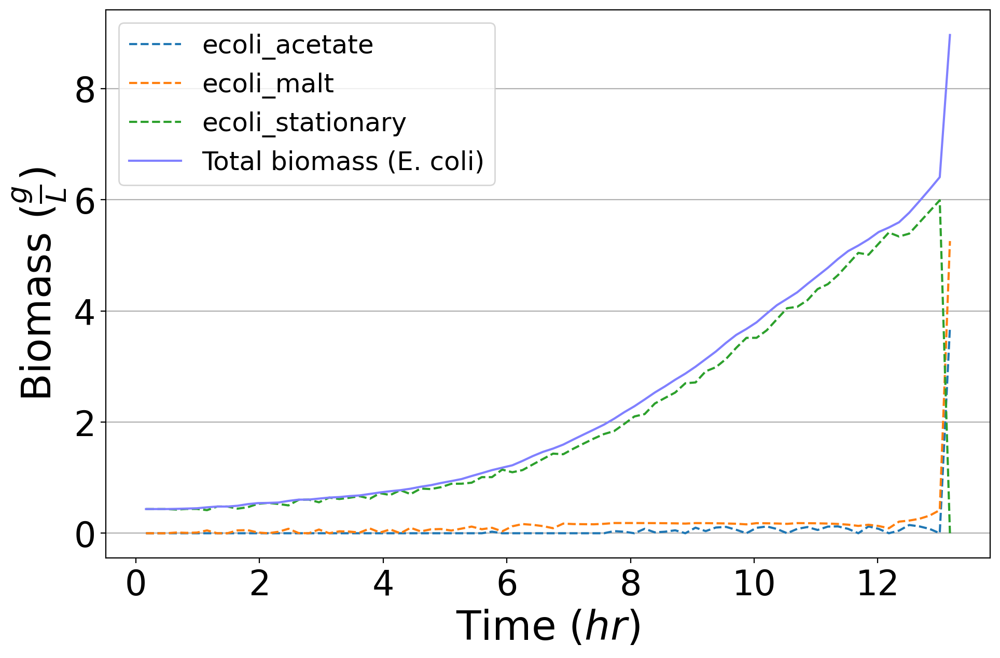

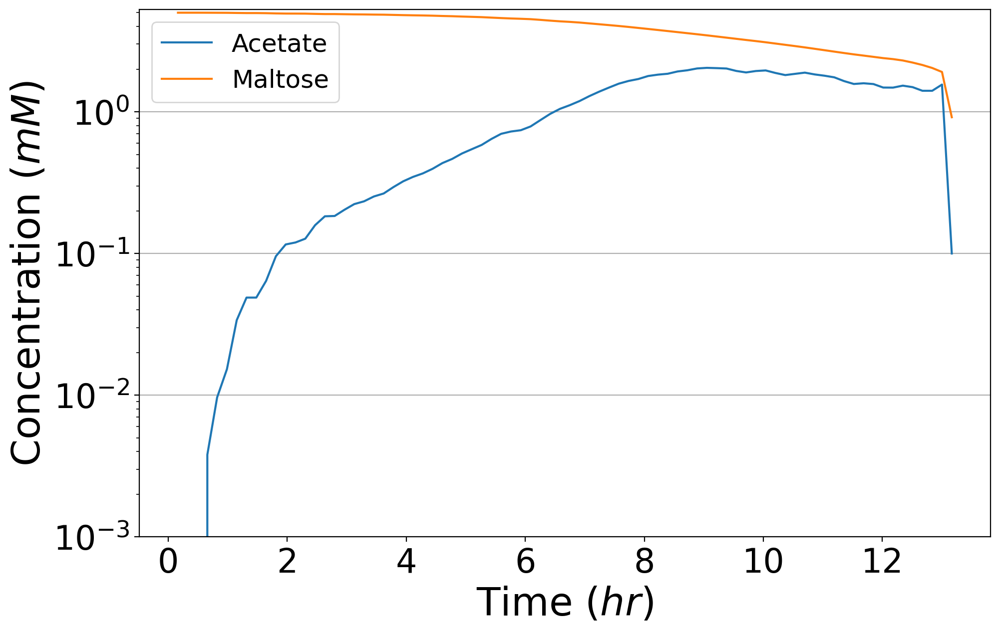

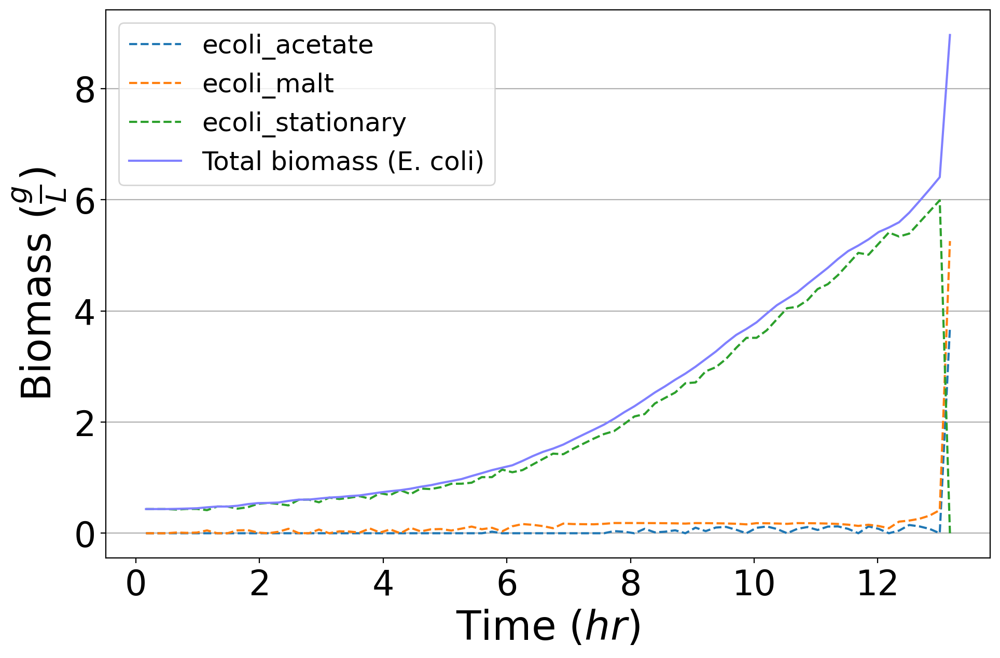

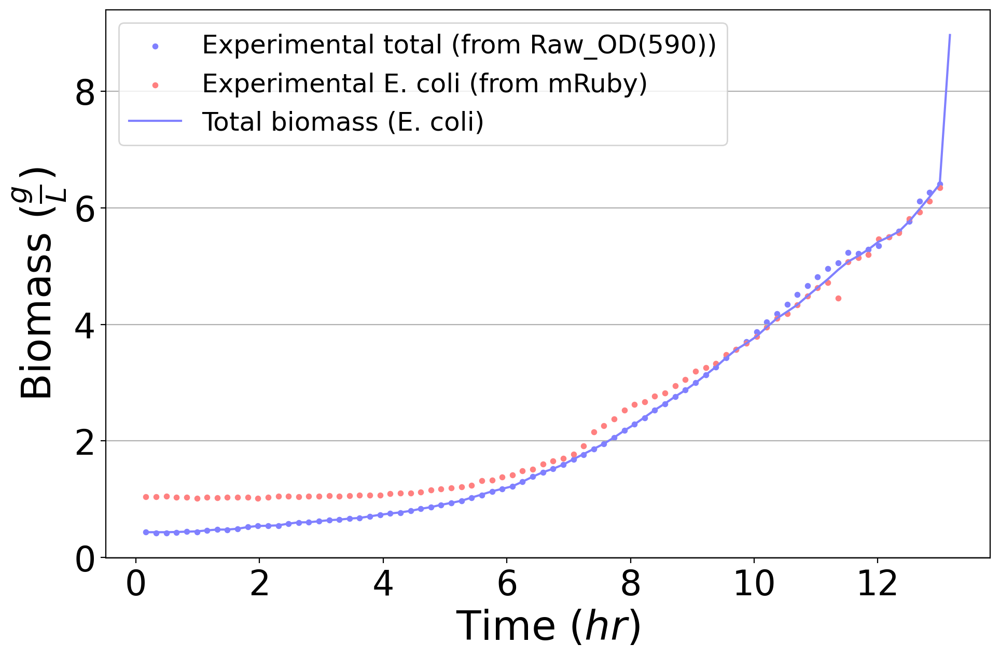

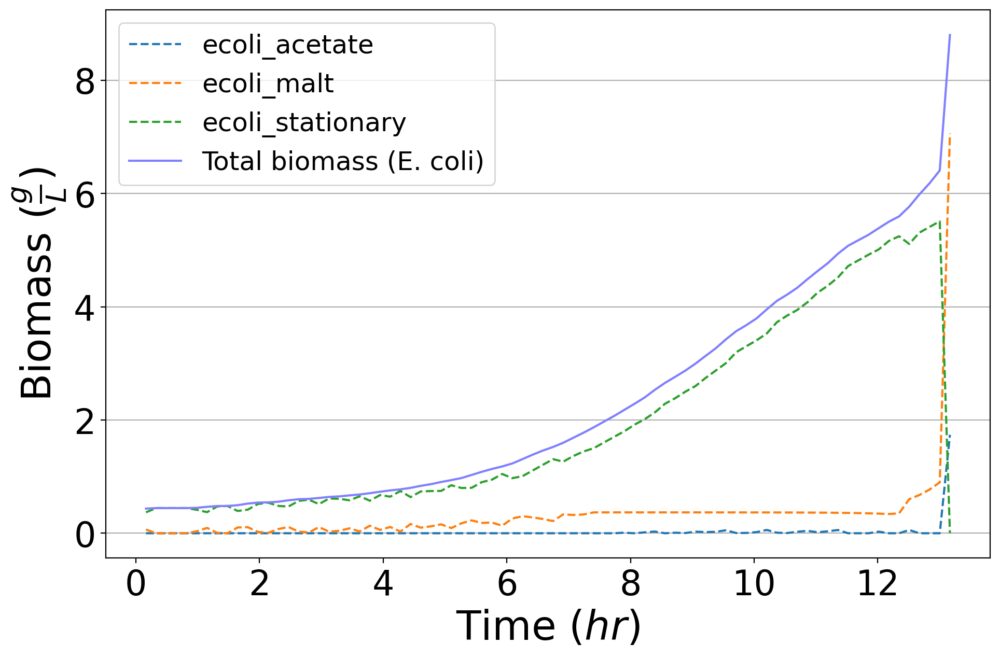

...

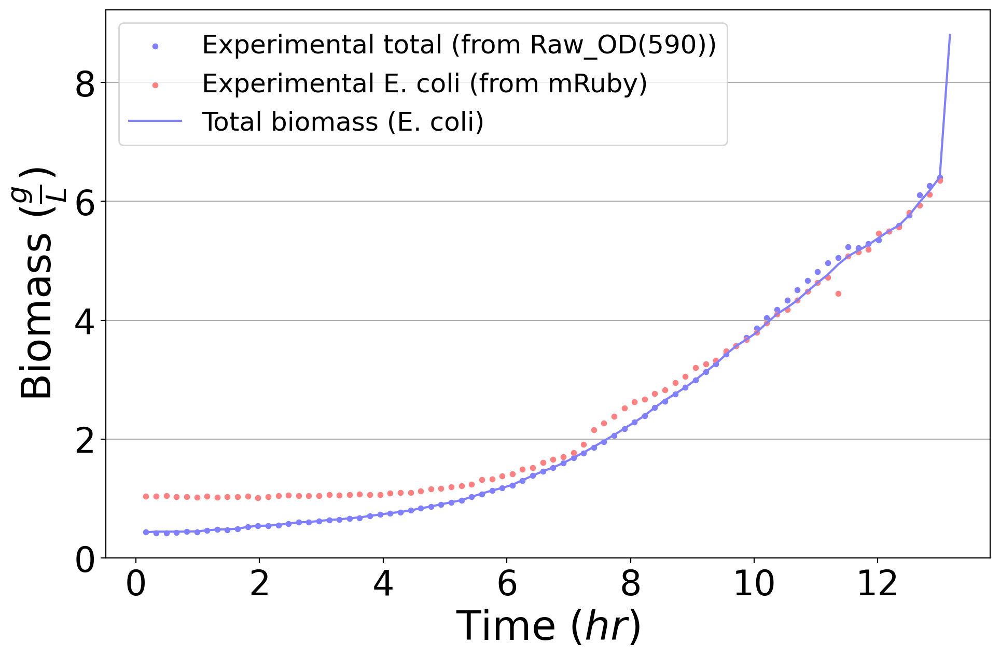

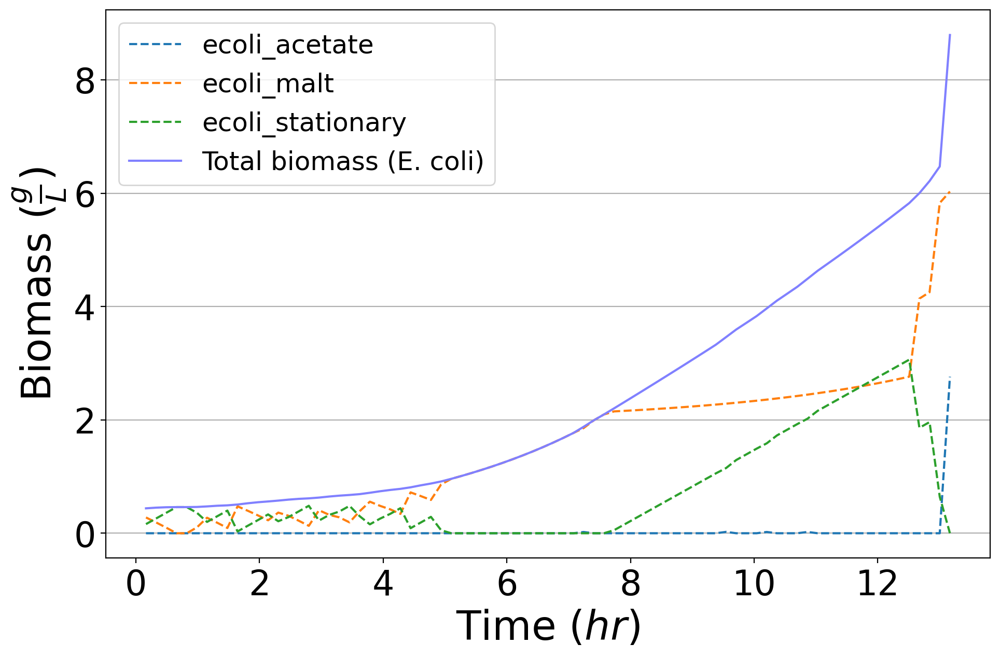

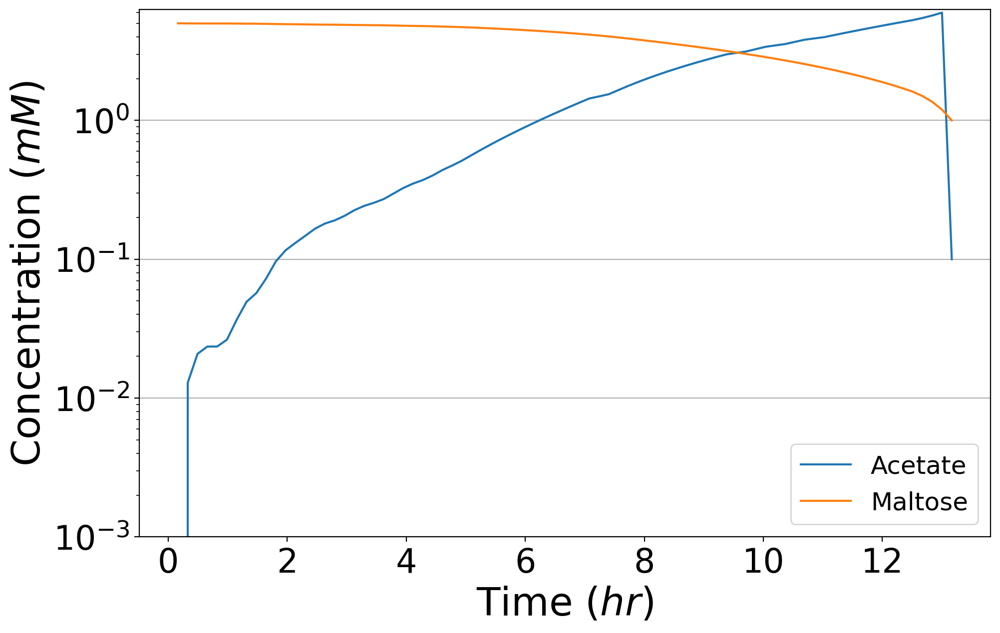

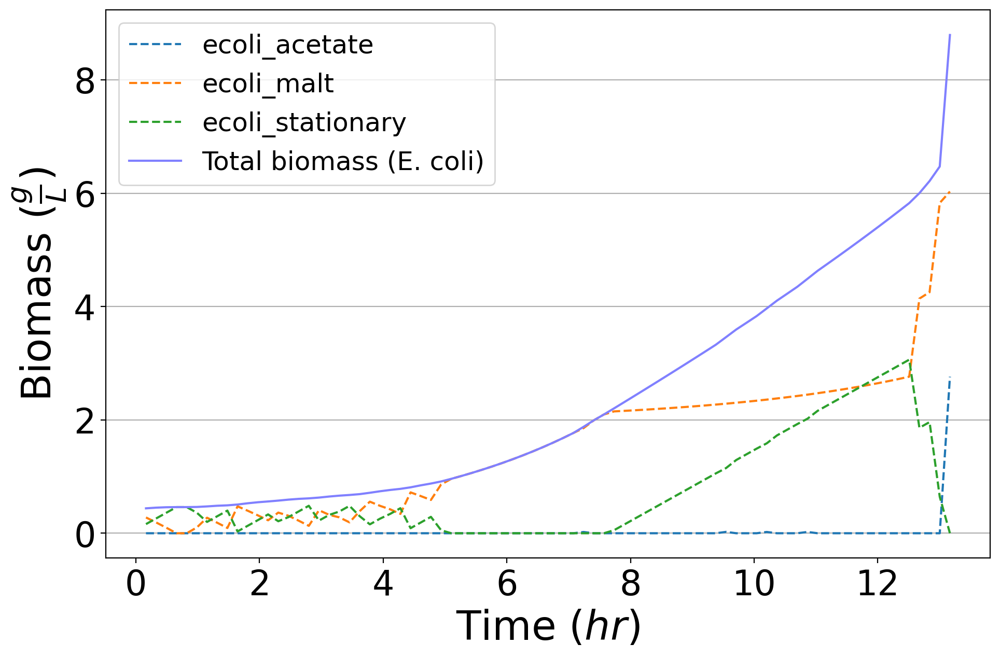

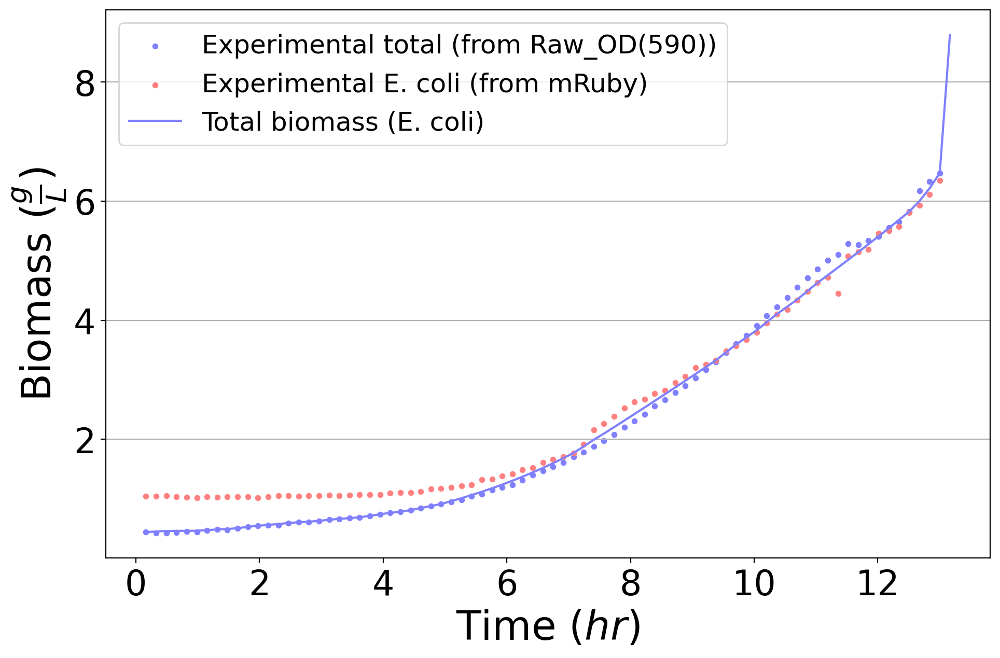

In [6]:
%run ../mscommphitting.py

maltose_ecoli = CommPhitting(fluxes_df, standardized_carbon_conc, media_conc, '../../../../ModelSEED/ModelSEEDDatabase', growth_df, experimental_metadata)
maltose_ecoli.fit_kcat(
    parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 5e-3},
    mets_to_track = ["cpd00179","cpd00029"],
    rel_final_conc = {"cpd00179":0.2},
    zero_start = ["cpd00029", "cpd00136"],
    abs_final_conc = {"cpd00029":0.1}, # metabolomics data
    graphs = update_graphs("G10"),
    export_zip_name = 'maltose_ecoli.zip', 
    requisite_biomass = requisite_biomass,
    publishing = True,
    export_lp = "maltose_ecoli.lp")

# Maltose + 4HB

#### Coculture

In [5]:
%run ../data/standardized_data/datastandardization.py
growth_data_path="../data/Jeffs_data/PF-EC 4-29-22 ratios and 4HB changes.xlsx"
time1 = process_time()
experimental_metadata, growth_df, fluxes_df, standardized_carbon_conc, requisite_biomass, trial_name_conversion, data_timestep_hr, simulation_timestep, media_conc = GrowthData.process(
    community_members = {
        ecoli: {
            'name': 'ecoli', 
            'phenotypes': {
                'acetate': {"consumed":["cpd00029"]}, #kbase_api.get_from_ws('93465/13/1'), 
                'malt': {"consumed":["cpd00179"],
                         "excreted":["cpd00029"]} #kbase_api.get_from_ws("93465/23/1")} #'93465/9/1')}   # !!! The phenotype name must align with the experimental IDs for the graphs to find the appropriate data
                }
        },
        pf: {
            'name': 'pf',
            'phenotypes': {
                'acetate': {"consumed":["cpd00029"]}, # kbase_api.get_from_ws("93465/25/1"), #'93465/11/1'), 
                '4HB': {"consumed":["cpd00136"]} # kbase_api.get_from_ws('	93465/27/1')} #93465/15/1')}
                }
        }
    },
    data_paths = {'path':growth_data_path, 'Raw OD(590)':'OD', 'mNeonGreen':'pf', 'mRuby':'ecoli'},
    species_abundances = species_abundances,
    carbon_conc_series = carbon_conc_series,
    ignore_trials = {'rows': ['C', 'D', 'E', 'B', 'G'], 'columns': [1,2,3,4,5,6,8,9,10,11,12]},
    species_identities_rows = species_identities_rows
)
print(f"{(process_time()-time1)/60} minutes")

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommPhitting\data\standardized_data\datastandardization.py:112: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


acetate {'consumed': ['cpd00029']}
malt {'consumed': ['cpd00179'], 'excreted': ['cpd00029']}
acetate {'consumed': ['cpd00029']}
4HB {'consumed': ['cpd00136']}
The model GCF_001612705.1.RAST.mdl is unable to be simulated with pFBA and yields a < None (infeasible). > error.
The ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'F2', 'F3', 'F4', 'F5', 'F6', 'F8', 'F9', 'F10', 'F11', 'F12', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12'] trials were dropped from the OD measurements per the ignore_trials parameter.
The [98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144

In [13]:
display(growth_df, fluxes_df)

,trial_IDs,Time (s),OD:Raw_OD(590),pf:mNeonGreen,ecoli:mRuby
short_codes,,,,,
G50,r1_ecoli_mRuby-r1_pf-4_pf-5_ecoli,17.607000,0.067028,12718.0,7787.0
G50,r1_ecoli_mRuby-r1_pf-4_pf-5_ecoli,613.747000,0.072643,12163.0,7382.0
G50,r1_ecoli_mRuby-r1_pf-4_pf-5_ecoli,1205.628000,0.071685,12134.0,7109.0
G50,r1_ecoli_mRuby-r1_pf-4_pf-5_ecoli,1798.107000,0.068629,12364.0,7054.0
G50,r1_ecoli_mRuby-r1_pf-4_pf-5_ecoli,2390.592333,0.069214,11804.0,7076.0
G50,r1_ecoli_mRuby-r1_pf-4_pf-5_ecoli,2983.113000,0.074460,11742.0,7025.0
G50,r1_ecoli_mRuby-r1_pf-4_pf-5_ecoli,3575.437667,0.072345,11787.0,6979.0
G50,r1_ecoli_mRuby-r1_pf-4_pf-5_ecoli,4167.869000,0.076835,11893.0,7049.0
G50,r1_ecoli_mRuby-r1_pf-4_pf-5_ecoli,4760.280000,0.078890,11725.0,7063.0


,ecoli_acetate,ecoli_malt,pf_acetate,pf_4HB
rxn,,,,
EX_cpd00001_e0,4.544367e+00,1.678364e+00,4.533296e+00,2.449417
EX_cpd00007_e0,-2.035609e+00,-6.452599e-01,-2.025521e+00,-5.333032
EX_cpd00009_e0,-7.625410e-02,-7.625410e-02,-7.625410e-02,-0.076254
EX_cpd00011_e0,2.388151e+00,1.675475e-01,2.377641e+00,5.685222
EX_cpd00013_e0,-8.611666e-01,-8.611666e-01,-8.611666e-01,-0.861167
EX_cpd00029_e0,-3.069851e+00,1.081686e+00,-3.063614e+00,0.000000
EX_cpd00030_e0,-2.806159e-04,-2.806159e-04,-2.806159e-04,-0.000281
EX_cpd00034_e0,-2.806159e-04,-2.806159e-04,-2.806159e-04,-0.000281
EX_cpd00047_e0,0.000000e+00,1.660648e+00,0.000000e+00,0.000000


In [16]:
trial_name_conversion

{'B': {'2': ('G1', 'r1_pf-5_ecoli'),
  '3': ('G2', 'r1_ecoli_mRuby-r50_pf-5_ecoli'),
  '4': ('G3', 'r1_ecoli_mRuby-r20_pf-5_ecoli'),
  '5': ('G4', 'r1_ecoli_mRuby-r10_pf-5_ecoli'),
  '6': ('G5', 'r1_ecoli_mRuby-r3_pf-5_ecoli'),
  '7': ('G6', 'r1_ecoli_mRuby-r1_pf-5_ecoli'),
  '8': ('G7', 'r3_ecoli_mRuby-r1_pf-5_ecoli'),
  '9': ('G8', 'r10_ecoli_mRuby-r1_pf-5_ecoli'),
  '10': ('G9', 'r20_ecoli_mRuby-r1_pf-5_ecoli'),
  '11': ('G10', 'r1_ecoli_mRuby-5_ecoli'),
  '12': ('G11', '5_ecoli')},
 'C': {'2': ('G12', 'r1_pf-5_ecoli'),
  '3': ('G13', 'r1_ecoli_ACS-r50_pf-5_ecoli'),
  '4': ('G14', 'r1_ecoli_ACS-r20_pf-5_ecoli'),
  '5': ('G15', 'r1_ecoli_ACS-r10_pf-5_ecoli'),
  '6': ('G16', 'r1_ecoli_ACS-r3_pf-5_ecoli'),
  '7': ('G17', 'r1_ecoli_ACS-r1_pf-5_ecoli'),
  '8': ('G18', 'r3_ecoli_ACS-r1_pf-5_ecoli'),
  '9': ('G19', 'r10_ecoli_ACS-r1_pf-5_ecoli'),
  '10': ('G20', 'r20_ecoli_ACS-r1_pf-5_ecoli'),
  '11': ('G21', 'r1_ecoli_ACS-5_ecoli'),
  '12': ('G22', '5_ecoli')},
 'D': {'2': ('G23', 'r1_pf-

In [13]:
display(requisite_biomass)

{'G50': {'pf|mNeonGreen': rxn
  EX_cpd00001_e0    1.811757e+00
  EX_cpd00007_e0   -3.944677e+00
  EX_cpd00009_e0   -5.640278e-02
  EX_cpd00011_e0    4.205181e+00
  EX_cpd00012_e0   -6.177115e-15
  EX_cpd00013_e0   -6.369781e-01
  EX_cpd00030_e0   -2.075628e-04
  EX_cpd00034_e0   -2.075628e-04
  EX_cpd00048_e0   -1.674589e-02
  EX_cpd00058_e0   -2.075628e-04
  EX_cpd00063_e0   -2.075628e-04
  EX_cpd00067_e0   -1.511501e+00
  EX_cpd00099_e0   -2.075628e-04
  EX_cpd00116_e0    2.075628e-04
  EX_cpd00136_e0   -9.969478e-01
  EX_cpd00149_e0   -2.075628e-04
  EX_cpd00205_e0   -2.075628e-04
  EX_cpd00239_e0    1.613103e-14
  EX_cpd00254_e0   -2.075628e-04
  EX_cpd10515_e0   -6.226885e-04
  EX_cpd10516_e0   -2.075628e-04
  bio               7.396688e-02
  Name: pf_4HB, dtype: float64,
  'ecoli|mRuby': rxn
  EX_cpd00001_e0    8.463390e+00
  EX_cpd00007_e0   -3.253815e+00
  EX_cpd00009_e0   -3.845222e-01
  EX_cpd00011_e0    8.448821e-01
  EX_cpd00013_e0   -4.342556e+00
  EX_cpd00029_e0    5.4545

In [ ]:
%run ../mscommphitting.py

maltose_4HB_commfit = CommPhitting(fluxes_df, standardized_carbon_conc, media_conc, '../../../../ModelSEED/ModelSEEDDatabase', growth_df, experimental_metadata)
maltose_4HB_commfit.fit_kcat(
    parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 5e-3},
    mets_to_track = ["cpd00179","cpd00029","cpd00136"],
    rel_final_conc = {"cpd00179":0.2, "cpd00136":0.2},
    zero_start = ["cpd00029"],
    abs_final_conc = {"cpd00029":0.1}, # metabolomics data
    graphs = update_graphs("G50"),
    export_zip_name = 'maltose_4HB_commfit.zip', 
    requisite_biomass = requisite_biomass,
    publishing = True,
    export_lp = "maltose_4HB_coculture.lp")

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommPhitting\mscommphitting.py:79: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


Done with concentrations and biomass loops: 0.04140625 min
Done with DCC loop: 0.00234375 min
Done with the DBC & diffc loop: 0.005729166666666666 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.12421875 min


#### Pseudomonas

In [5]:
%run ../data/standardized_data/datastandardization.py
growth_data_path="../data/Jeffs_data/PF-EC 4-29-22 ratios and 4HB changes.xlsx"
time1 = process_time()
experimental_metadata, growth_df, fluxes_df, standardized_carbon_conc, requisite_biomass, trial_name_conversion, data_timestep_hr, simulation_timestep, media_conc = GrowthData.process(
    community_members = {
        pf: {
            'name': 'pf',
            'phenotypes': {
                'acetate': {"consumed":["cpd00029"]}, # kbase_api.get_from_ws("93465/25/1"), #'93465/11/1'), 
                '4HB': {"consumed":["cpd00136"]} # kbase_api.get_from_ws('	93465/27/1')} #93465/15/1')}
                }
        }
    },
    data_paths = {'path':growth_data_path, 'Raw OD(590)':'OD', 'mNeonGreen':'pf'},
    species_abundances = species_abundances,
    carbon_conc_series = carbon_conc_series,
    ignore_trials = {'rows': ['C', 'D', 'E', 'B', 'G'], 'columns': [1,3,4,5,6,7,8,9,10,11,12]},
    species_identities_rows = species_identities_rows
)
print(f"{(process_time()-time1)/60} minutes")

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommFitting\data\standardized_data\datastandardization.py:112: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


acetate {'consumed': ['cpd00029']}
4HB {'consumed': ['cpd00136']}
The model GCF_001612705.1.RAST.mdl is unable to be simulated with pFBA and yields a < None (infeasible). > error.
The ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12'] trials were dropped from the OD measurements per the ignore_trials parameter.
The [62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 13

In [ ]:
display(fluxes_df)

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommFitting\mscommfitting.py:79: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


Done with concentrations and biomass loops: 0.0020833333333333333 min
Done with DCC loop: 0.00026041666666666666 min
Done with the DBC & diffc loop: 0.00078125 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.03411458333333333 min
Done exporting the content: 0.021354166666666667 min
starting optimization
maltose_4HB_pf.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'acetate', '4HB', 'stationary'},
 'species': ['OD', 'pf'],
 'trial': 'G45'}
graph_1
{'content': 'conc',
 'experimental_data': 

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_4HB_pf.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 0.021354166666666667 min
starting optimization


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_4HB_pf.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


maltose_4HB_pf.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'acetate', '4HB', 'stationary'},
 'species': ['OD', 'pf'],
 'trial': 'G45'}
graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00179', 'cpd00136'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G45_all species_OD,pf_total_biomass.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G45_cpd00179,cpd00136_c.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G45_all species_acetate,4HB,stationary phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done simulating with the coefficients for biomass partitions: 1
0.090625 minutes
{'pf': {'4HB': 0.3663, 'acetate': 125.12362500000002}}
Done with concentrations and biomass loops: 0.0020833333333333333 min
Done with DCC loop: 0.00026041666666666666 min
Done with the DBC & diffc loop: 0.00078125 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.07005208333333333 min


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_4HB_pf.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 0.02109375 min
starting optimization


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_4HB_pf.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


maltose_4HB_pf.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'acetate', '4HB', 'stationary'},
 'species': ['OD', 'pf'],
 'trial': 'G45'}
graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00179', 'cpd00136'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G45_all species_OD,pf_total_biomass.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G45_cpd00179,cpd00136_c.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G45_all species_acetate,4HB,stationary phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


{}

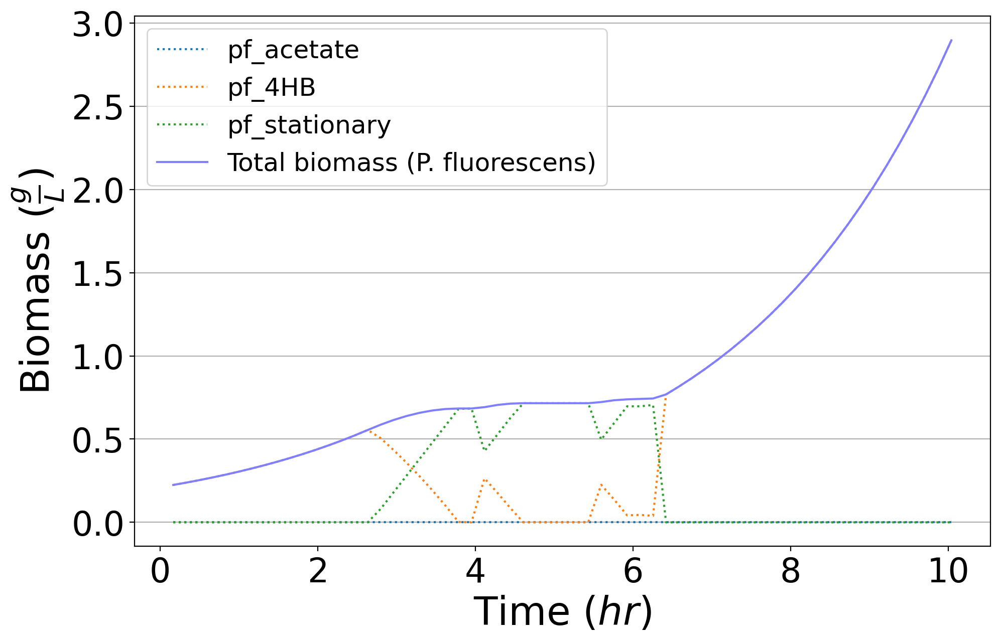

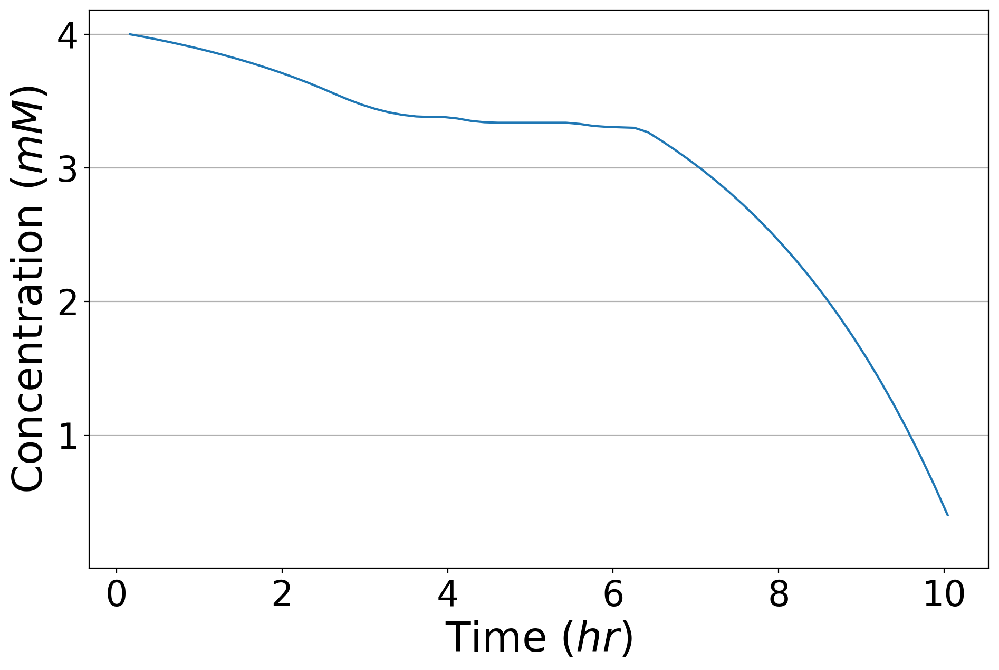

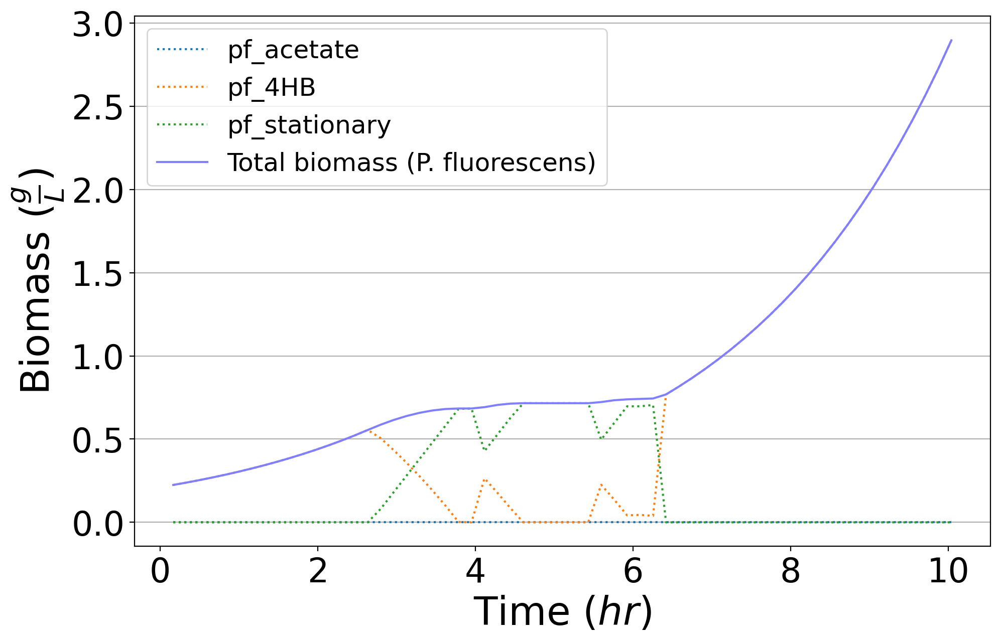

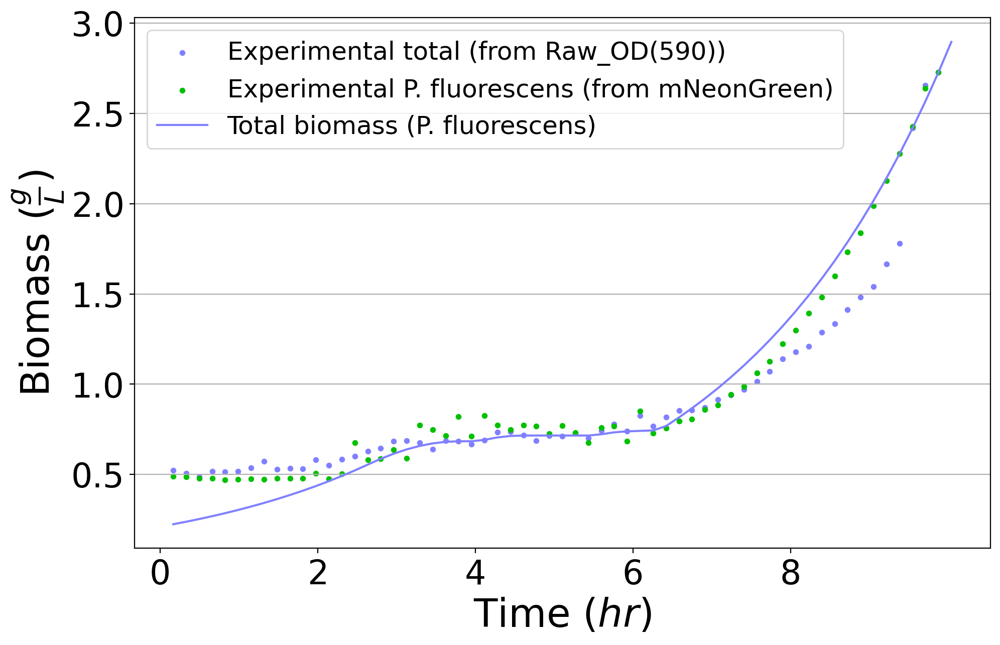

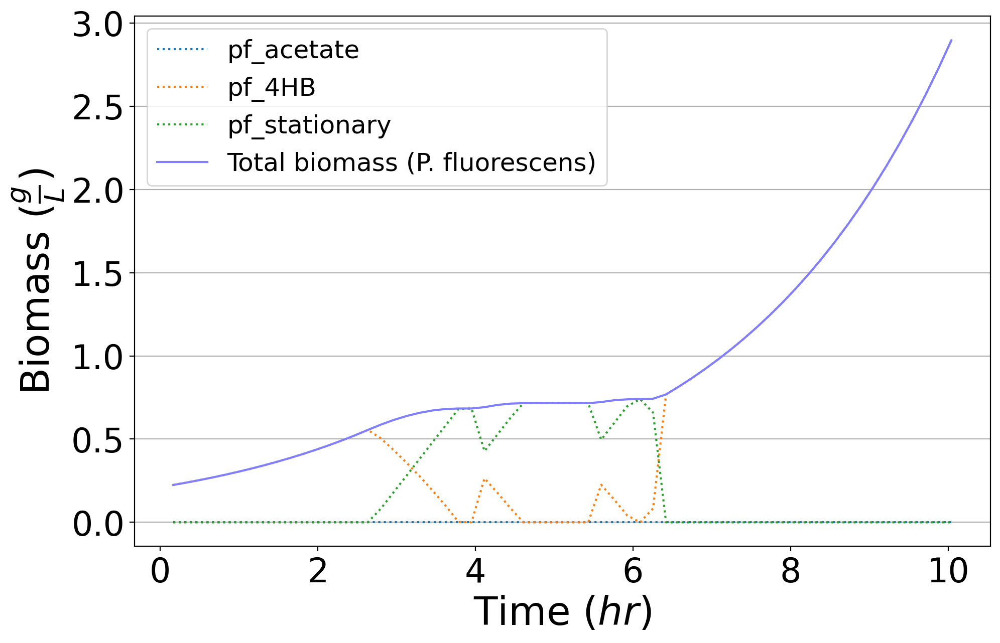

...

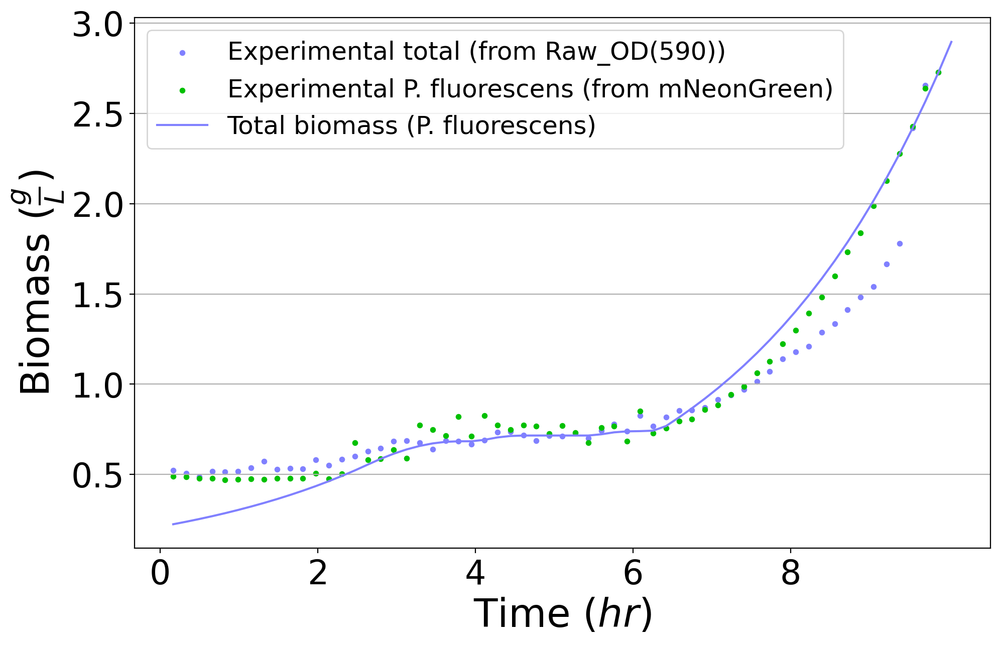

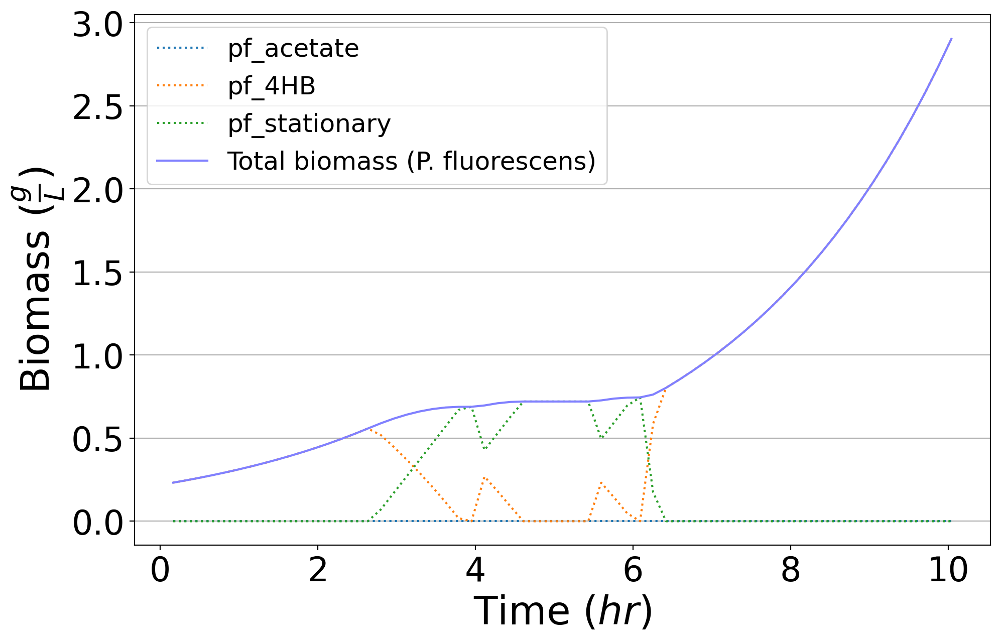

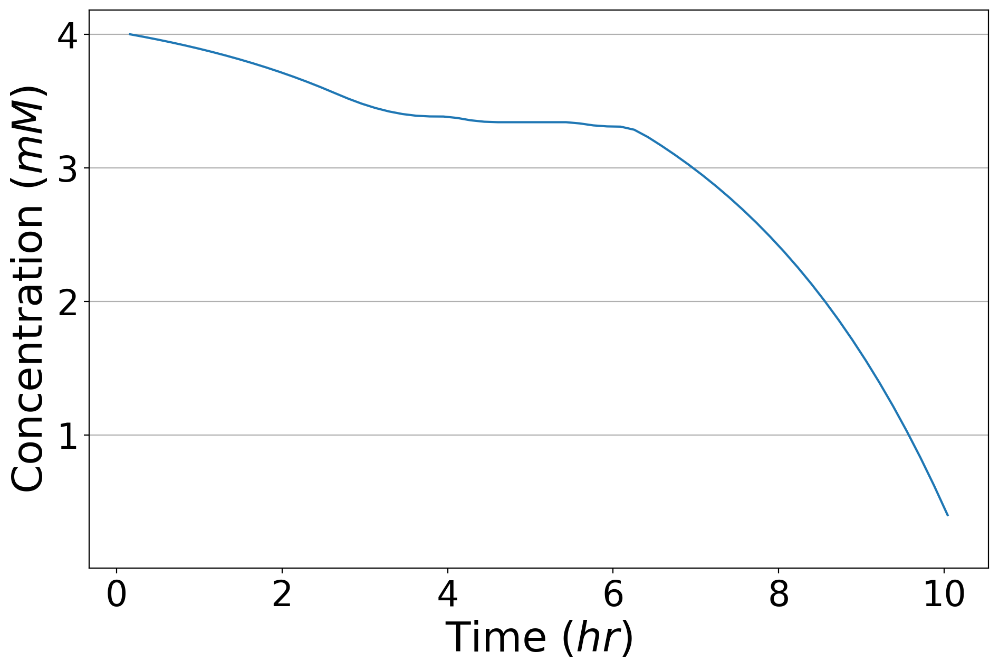

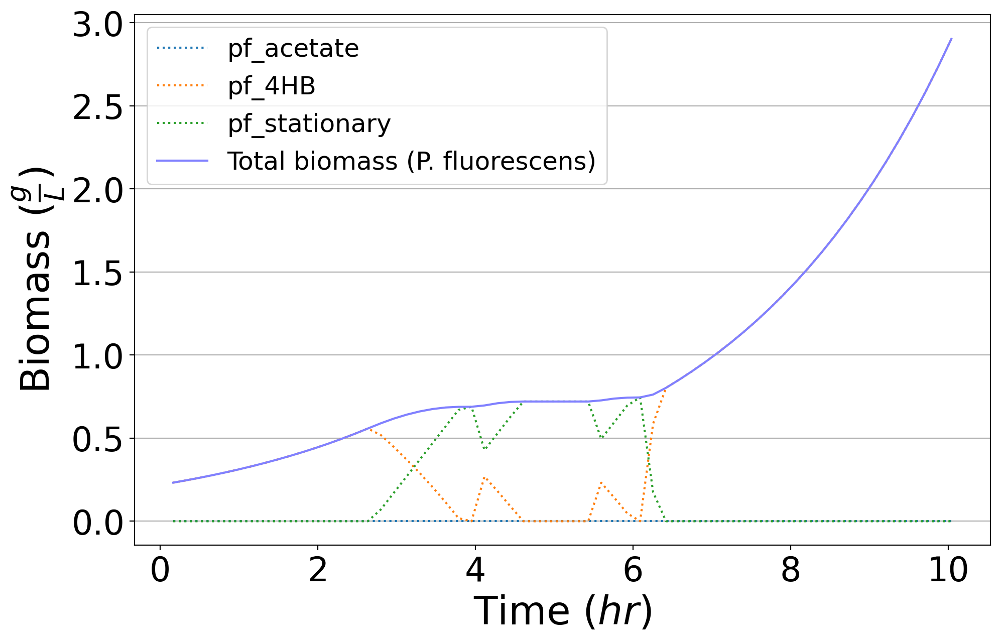

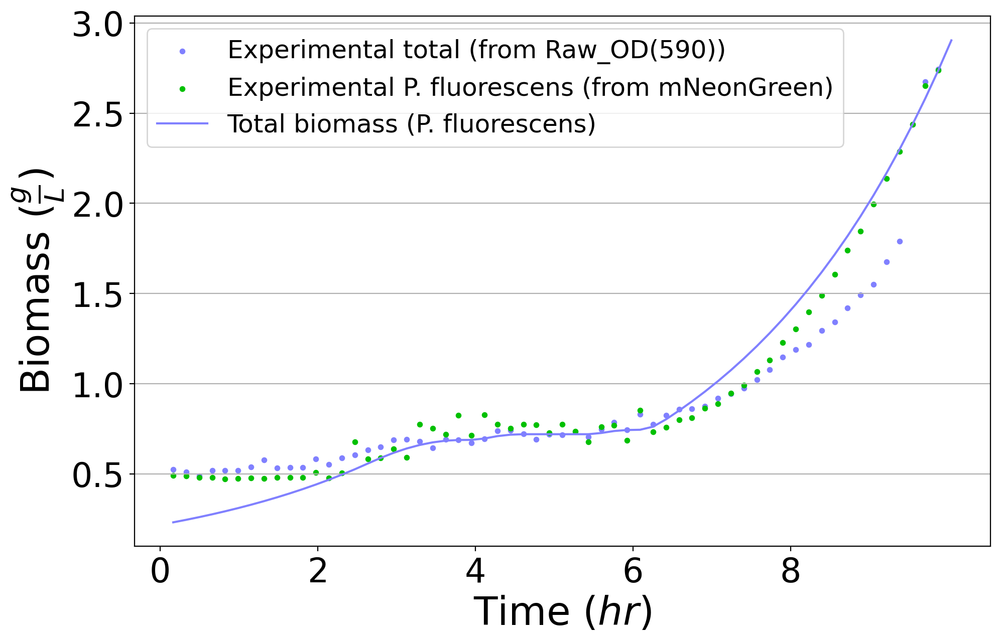

In [9]:
%run ../mscommphitting.py
maltose_4HB_pf = CommPhitting(fluxes_df, standardized_carbon_conc, media_conc, '../../../../ModelSEED/ModelSEEDDatabase', growth_df, experimental_metadata)
maltose_4HB_pf.fit_kcat(
    parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 1},
    mets_to_track = ["cpd00179","cpd00136"],
    rel_final_conc = {"cpd00136":0.1},
    zero_start = ["cpd00029"],
    # abs_final_conc = {"cpd00029":0.1}, # metabolomics data
    graphs = update_graphs("G45"),
    export_zip_name = 'maltose_4HB_pf.zip', 
    requisite_biomass = requisite_biomass,
    publishing = True,
    export_lp = "maltose_4HB_pf.lp")

#### E. coli

In [5]:
%run ../data/standardized_data/datastandardization.py
growth_data_path="../data/Jeffs_data/PF-EC 4-29-22 ratios and 4HB changes.xlsx"
time1 = process_time()
experimental_metadata, growth_df, fluxes_df, standardized_carbon_conc, requisite_biomass, trial_name_conversion, data_timestep_hr, simulation_timestep, media_conc = GrowthData.process(
    community_members = {
        ecoli: {
            'name': 'ecoli', 
            'phenotypes': {
                'acetate': {"consumed":["cpd00029"]}, #kbase_api.get_from_ws('93465/13/1'), 
                'malt': {"consumed":["cpd00179"],
                         "excreted":["cpd00029"]} #kbase_api.get_from_ws("93465/23/1")} #'93465/9/1')}   # !!! The phenotype name must align with the experimental IDs for the graphs to find the appropriate data
            }
        }
    },
    data_paths = {'path':growth_data_path, 'Raw OD(590)':'OD', 'mRuby':'ecoli'},
    species_abundances = species_abundances,
    carbon_conc_series = carbon_conc_series,
    ignore_trials = {'rows': ['C', 'D', 'E', 'B', 'G'], 'columns': [1,2,3,4,5,6,7,8,9,10,12]},
    species_identities_rows = species_identities_rows
)
print(f"{(process_time()-time1)/60} minutes")

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommFitting\data\standardized_data\datastandardization.py:112: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


acetate {'consumed': ['cpd00029']}
malt {'consumed': ['cpd00179'], 'excreted': ['cpd00029']}
The ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F12', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12'] trials were dropped from the OD measurements per the ignore_trials parameter.
The [100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166] timesteps (with [1.15536203 1.16174438 1.03174849 0.99776876 1.0127485  1.007

In [6]:
# display(experimental_metadata, growth_df, fluxes_df)

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommFitting\mscommfitting.py:79: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


Done with concentrations and biomass loops: 0.005989583333333334 min
Done with DCC loop: 0.0013020833333333333 min
Done with the DBC & diffc loop: 0.0020833333333333333 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.08671875 min
Done exporting the content: 0.038802083333333334 min
starting optimization
maltose_4HB_ecoli.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'acetate', 'malt', 'stationary'},
 'species': ['OD', 'ecoli'],
 'trial': 'G54'}
graph_1
{'content': 'conc',
 'experimental_

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_4HB_ecoli.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 0.03854166666666667 min
starting optimization
maltose_4HB_ecoli.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'acetate', 'malt', 'stationary'},
 'species': ['OD', 'ecoli'],
 'trial': 'G54'}


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_4HB_ecoli.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00179', 'cpd00029'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'trial': 'G54'}
graph_2
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype':

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G54_cpd00179,cpd00029_c.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G54_all species_acetate,malt,stationary phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G54_all species_OD,ecoli_total_biomass.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done simulating with the coefficients for biomass partitions: 1
0.13072916666666667 minutes
{'ecoli': {'acetate': 12.83205, 'malt': 0.165}}
Done with concentrations and biomass loops: 0.005989583333333334 min
Done with DCC loop: 0.0013020833333333333 min
Done with the DBC & diffc loop: 0.00234375 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.06458333333333334 min


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_4HB_ecoli.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 0.03828125 min
starting optimization


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'maltose_4HB_ecoli.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


maltose_4HB_ecoli.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'acetate', 'malt', 'stationary'},
 'species': ['OD', 'ecoli'],
 'trial': 'G54'}
graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00179', 'cpd00029'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'li

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G54_cpd00179,cpd00029_c.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G54_all species_acetate,malt,stationary phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G54_all species_OD,ecoli_total_biomass.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


{}

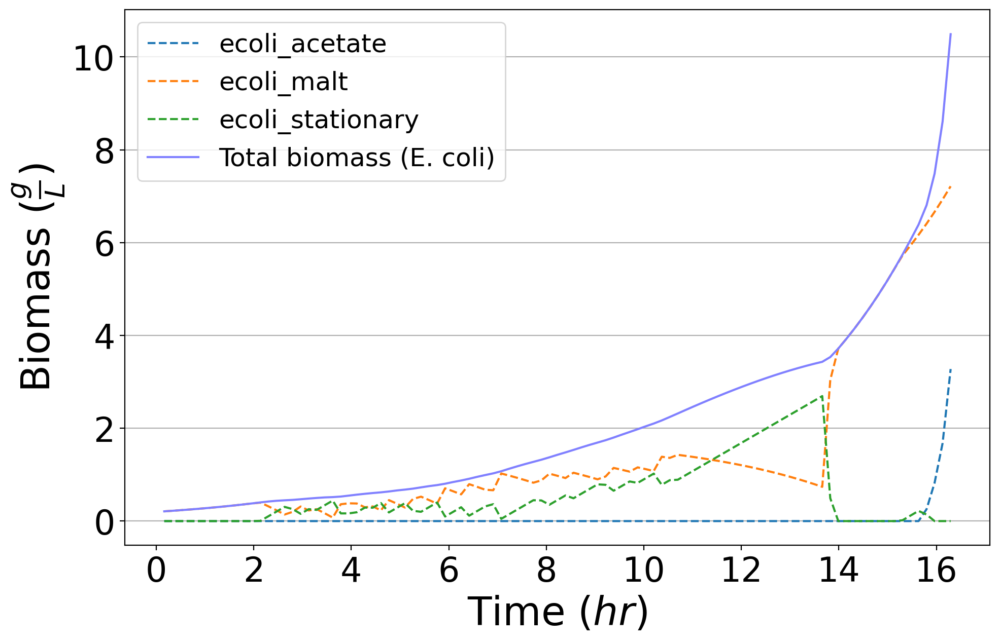

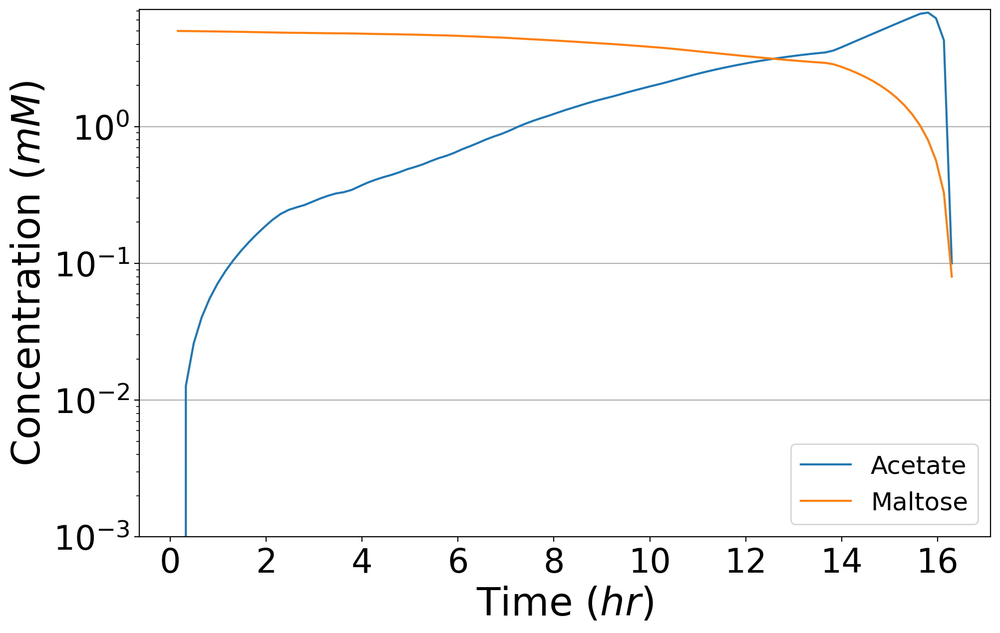

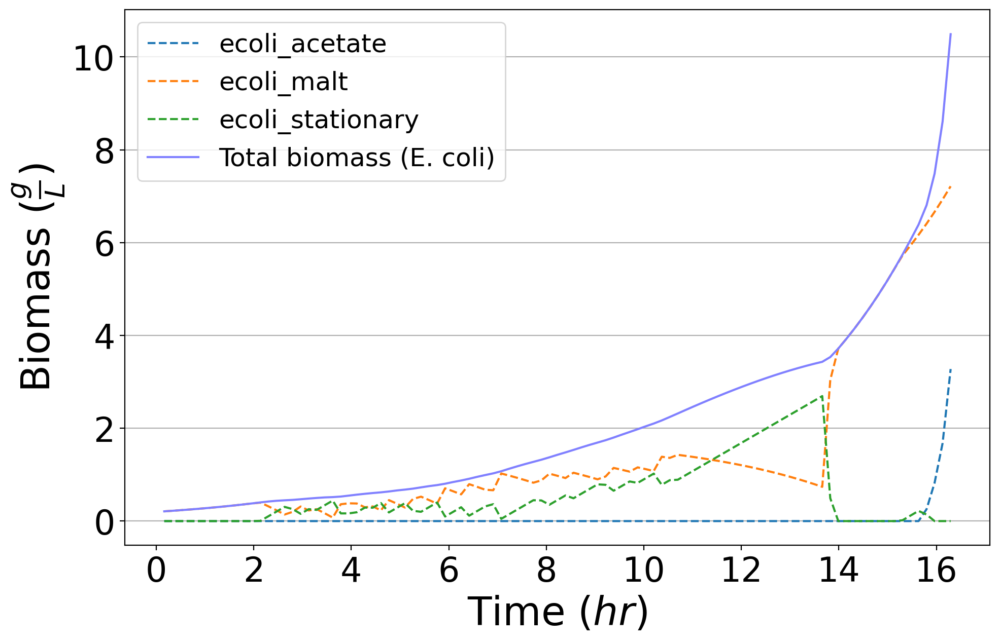

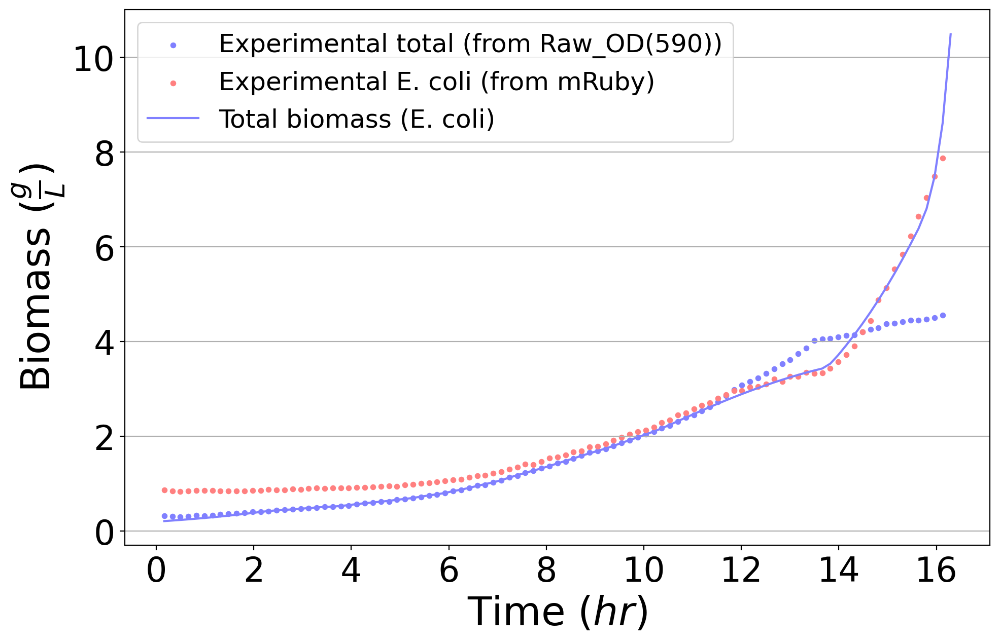

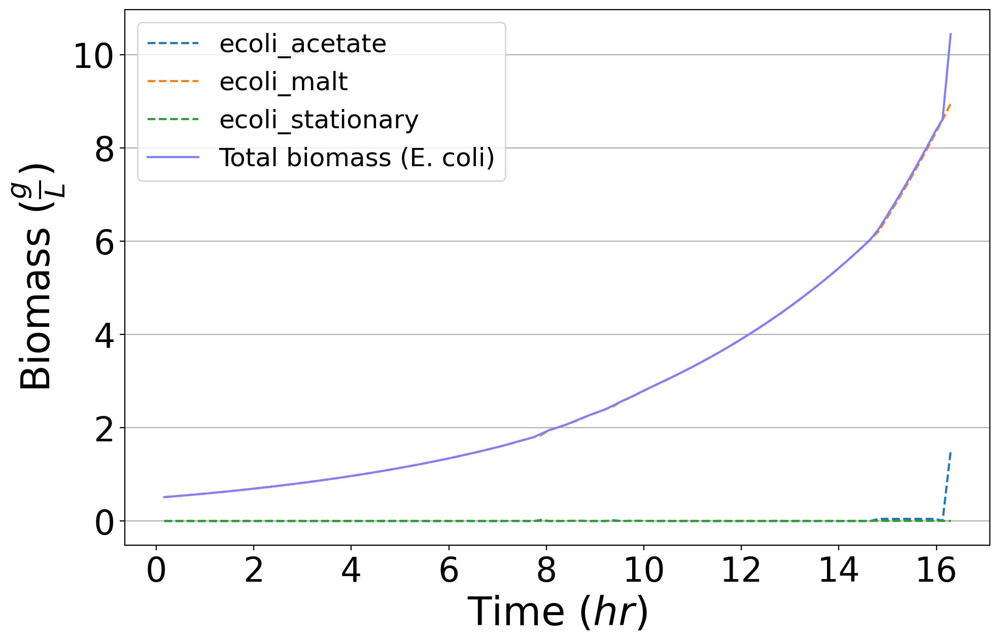

...

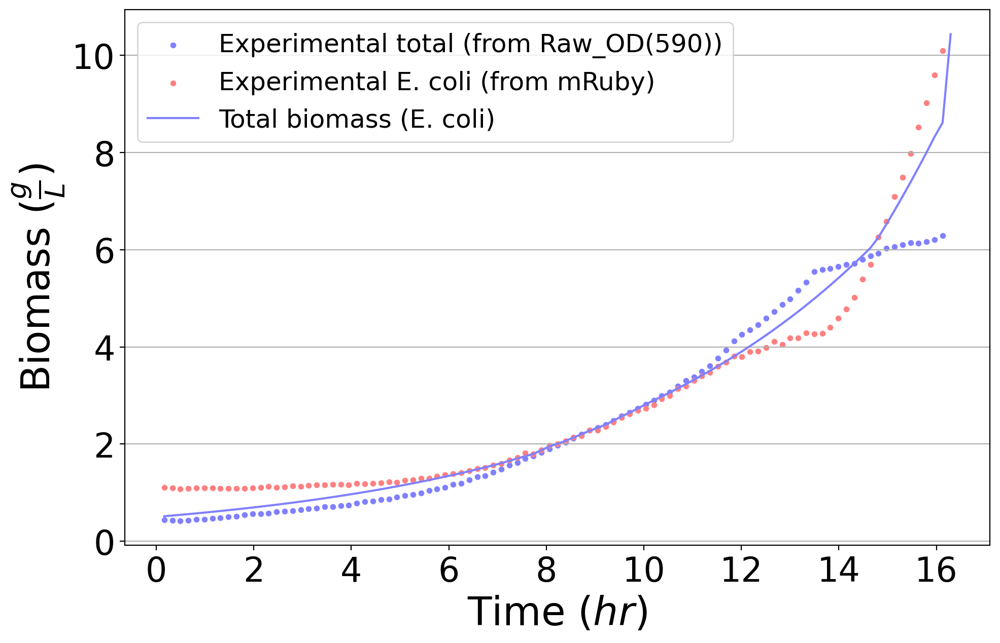

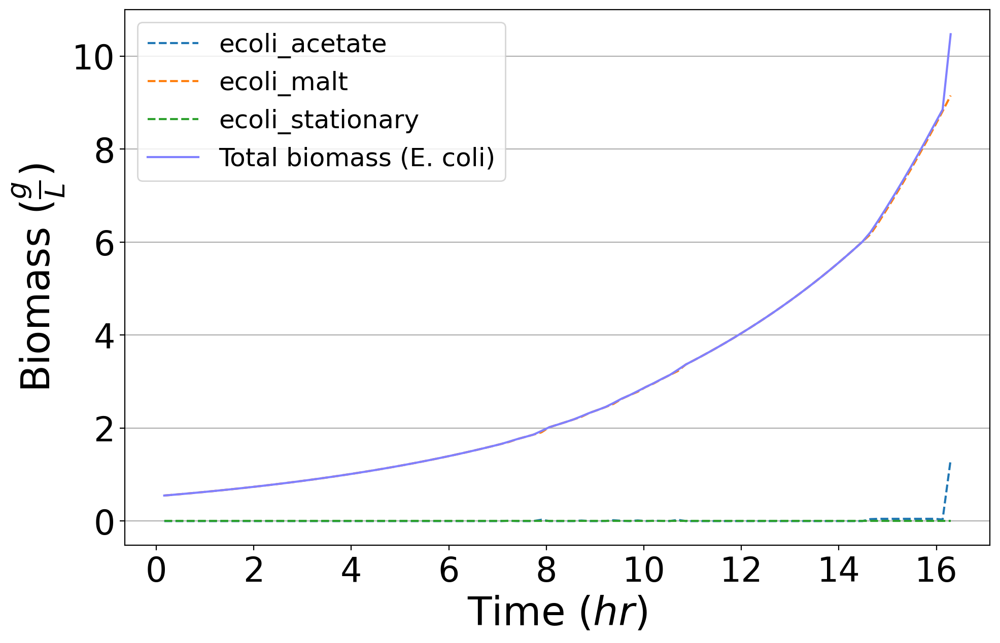

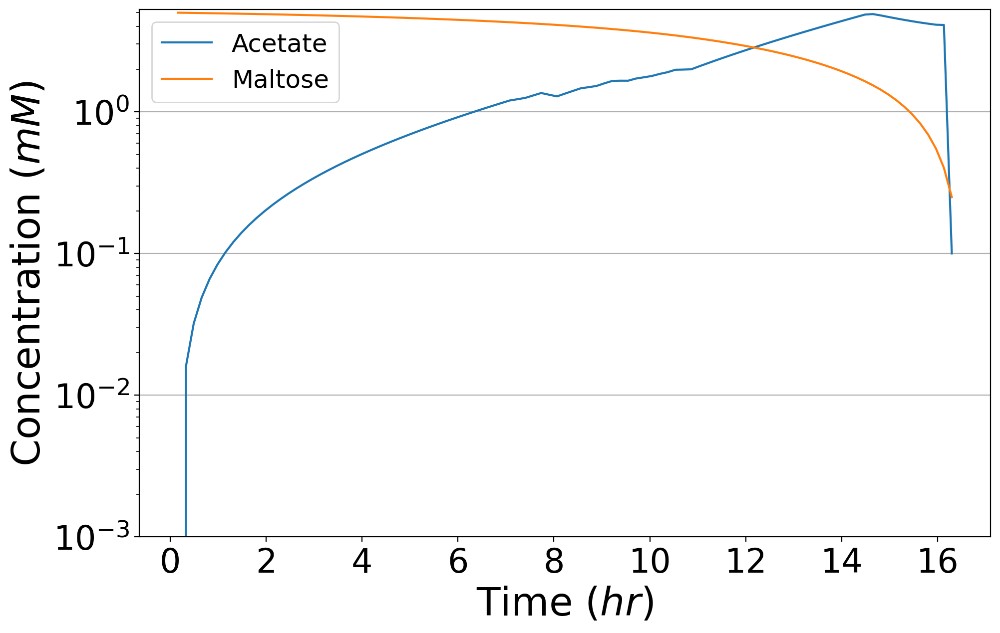

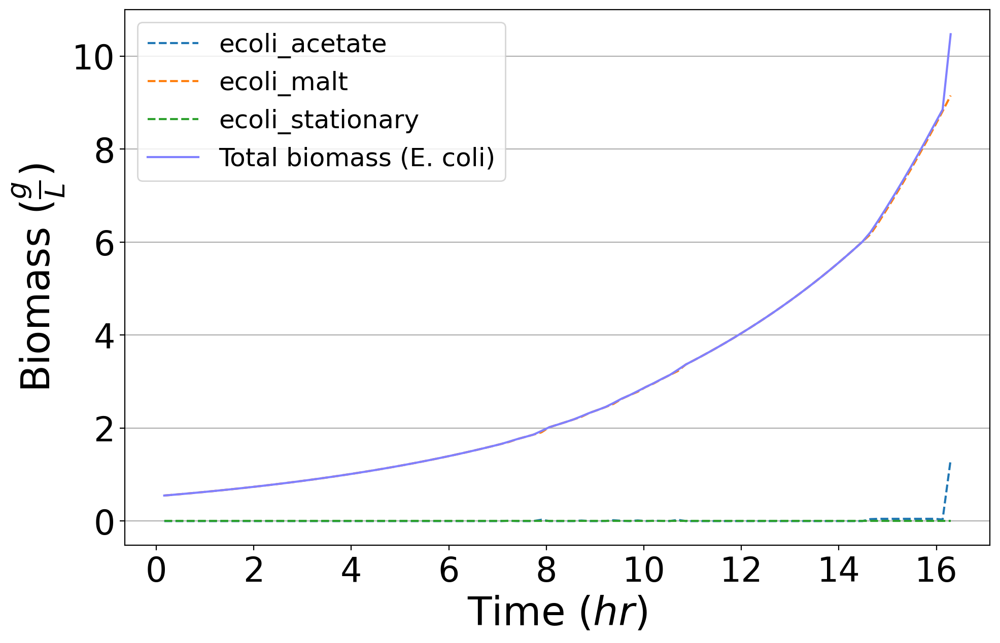

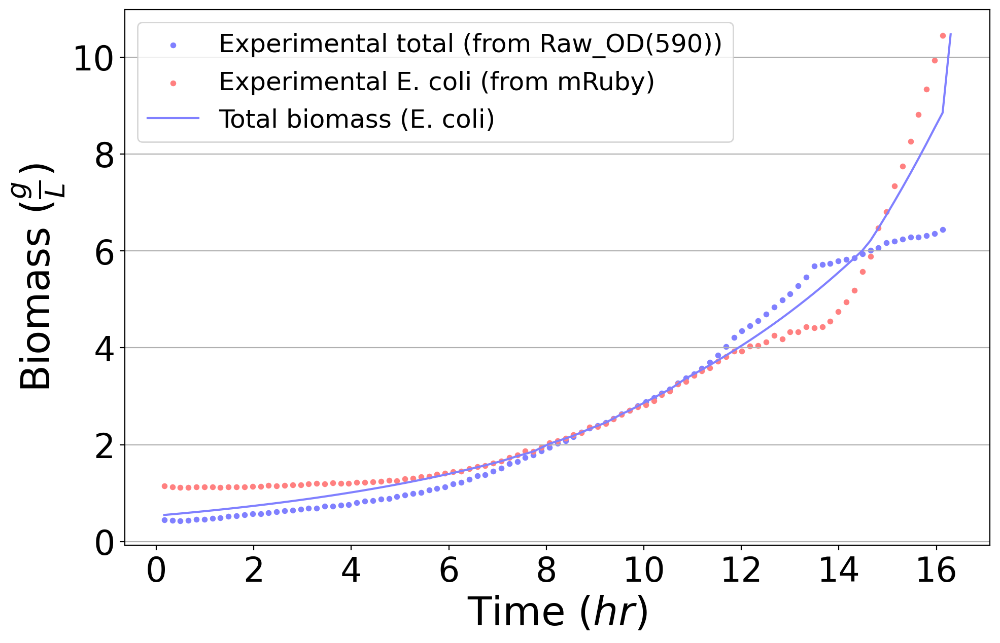

In [13]:
%run ../mscommphitting.py
maltose_4HB_ecoli = CommPhitting(fluxes_df, standardized_carbon_conc, media_conc, '../../../../ModelSEED/ModelSEEDDatabase', growth_df, experimental_metadata)
maltose_4HB_ecoli.fit_kcat(
    parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 1},
    mets_to_track = ["cpd00179","cpd00029"],
    rel_final_conc = {"cpd00179":0.05},
    zero_start = ["cpd00029"],
    abs_final_conc = {"cpd00029":0.1}, # metabolomics data
    graphs = update_graphs("G54"),
    export_zip_name = 'maltose_4HB_ecoli.zip', 
    requisite_biomass = requisite_biomass,
    publishing = True,
    export_lp = "maltose_4HB_ecoli.lp")

# Acetate

#### Coculture

In [5]:
%run ../data/standardized_data/datastandardization.py
growth_data_path="../data/Jeffs_data/PF-EC-PFEC on Acetate 6-17-22.xlsx"
time1 = process_time()
experimental_metadata, growth_df, fluxes_df, standardized_carbon_conc, requisite_biomass, trial_name_conversion, data_timestep_hr, simulation_timestep, media_conc = GrowthData.process(
    community_members = {
        ecoli: {
            'name': 'ecoli', 
            'phenotypes': {
                'acetate': {"consumed":["cpd00029"]}, #kbase_api.get_from_ws('93465/13/1'), 
                'malt': {"consumed":["cpd00179"],
                         "excreted":["cpd00029"]} #kbase_api.get_from_ws("93465/23/1")} #'93465/9/1')}   # !!! The phenotype name must align with the experimental IDs for the graphs to find the appropriate data
                }
        },
        pf: {
            'name': 'pf',
            'phenotypes': {
                'acetate': {"consumed":["cpd00029"]}, # kbase_api.get_from_ws("93465/25/1"), #'93465/11/1'), 
                '4HB': {"consumed":["cpd00136"]} # kbase_api.get_from_ws('	93465/27/1')} #93465/15/1')}
                }
        }
    },
    data_paths = {'path':growth_data_path, 'Raw OD(590)':'OD', 'Fluorescence':'pf', 'Fluorescence 1':'ecoli'},
    species_abundances = {num:{"ecoli":1, "pf":1} for num in range(1,13)},
    carbon_conc_series = {'columns': {'cpd00029': {2:100, 3: 50, 4: 25, 5: 12.5, 6: 6.25, 7: 3}}},
    ignore_trials = {'rows': ['C', 'D', 'B', 'F'], 'columns': [1,2,4,5,6,7,8,9,10,11,12]},
    species_identities_rows = {
        1:{"ecoli":"mRuby"},
        2:{"ecoli":"ACS"},
        3:{"pf":""},
        4:{"ecoli":"mRuby"},
        5:{"ecoli":"ACS"},
    },
    significant_deviation=None
)
print(f"{(process_time()-time1)/60} minutes")

acetate {'consumed': ['cpd00029']}
malt {'consumed': ['cpd00179'], 'excreted': ['cpd00029']}
acetate {'consumed': ['cpd00029']}
4HB {'consumed': ['cpd00136']}
The model GCF_001612705.1.RAST.mdl is unable to be simulated with pFBA and yields a < None (infeasible). > error.
The ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'E2', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'G2', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12'] trials were dropped from the OD measurements per the ignore_trials parameter.
The [109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 15

In [6]:
requisite_biomass

{'G38': {'ecoli|Fluorescence 1': rxn
  EX_cpd00001_e0    3.327337e+01
  EX_cpd00007_e0   -1.490451e+01
  EX_cpd00009_e0   -5.583243e-01
  EX_cpd00011_e0    1.748578e+01
  EX_cpd00013_e0   -6.305369e+00
  EX_cpd00029_e0   -2.247712e+01
  EX_cpd00030_e0   -2.054639e-03
  EX_cpd00034_e0   -2.054639e-03
  EX_cpd00048_e0   -1.657656e-01
  EX_cpd00058_e0   -2.054639e-03
  EX_cpd00063_e0   -2.054639e-03
  EX_cpd00067_e0   -1.769990e+01
  EX_cpd00099_e0   -2.054639e-03
  EX_cpd00116_e0    2.054639e-03
  EX_cpd00149_e0   -2.054639e-03
  EX_cpd00205_e0   -2.054639e-03
  EX_cpd00254_e0   -2.054639e-03
  EX_cpd10515_e0   -8.218558e-03
  EX_cpd10516_e0   -5.790147e-12
  EX_cpd15378_e0    2.054639e-03
  bio               7.321892e-01
  Name: ecoli_acetate, dtype: float64,
  'pf|Fluorescence': rxn
  EX_cpd00001_e0    3.332759e+01
  EX_cpd00007_e0   -1.489109e+01
  EX_cpd00009_e0   -5.605999e-01
  EX_cpd00011_e0    1.747978e+01
  EX_cpd00013_e0   -6.331068e+00
  EX_cpd00029_e0   -2.252288e+01
  EX_cpd

Done with concentrations and biomass loops: 0.0234375 min
Done with DCC loop: 0.003125 min
Done with the DBC & diffc loop: 0.0067708333333333336 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.178125 min
Done exporting the content: 0.07994791666666666 min
starting optimization
acetate_commfit.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'malt', 'acetate', '4HB', 'stationary'},
 'species': ['OD', 'pf', 'ecoli'],
 'trial': 'G38'}
graph_1
{'content': 'conc',
 'experimental_data': False,
 '

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'acetate_coculture.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 0.08020833333333334 min
starting optimization


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'acetate_coculture.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


acetate_commfit.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'malt', 'acetate', '4HB', 'stationary'},
 'species': ['OD', 'pf', 'ecoli'],
 'trial': 'G38'}
graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00029'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'lin

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G38_all species_malt,acetate,4HB,stationary phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G38_all species_OD,pf,ecoli_total_biomass.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G38_cpd00029_c.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done simulating with the coefficients for biomass partitions: 1
0.64375 minutes
{'ecoli': {'acetate': 11.915475, 'malt': 2.838825},
 'pf': {'4HB': 0.281325, 'acetate': 0.3663}}
Done with concentrations and biomass loops: 0.026822916666666665 min
Done with DCC loop: 0.0033854166666666668 min
Done with the DBC & diffc loop: 0.0078125 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.13958333333333334 min


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'acetate_coculture.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 0.14322916666666666 min
starting optimization
acetate_commfit.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'malt', 'acetate', '4HB', 'stationary'},
 'species': ['OD', 'pf', 'ecoli'],
 'trial': 'G38'}


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'acetate_coculture.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00029'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'trial': 'G38'}
graph_2
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'malt', 'a

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G38_all species_malt,acetate,4HB,stationary phenotypes_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G38_all species_OD,pf,ecoli_total_biomass.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G38_cpd00029_c.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


{}

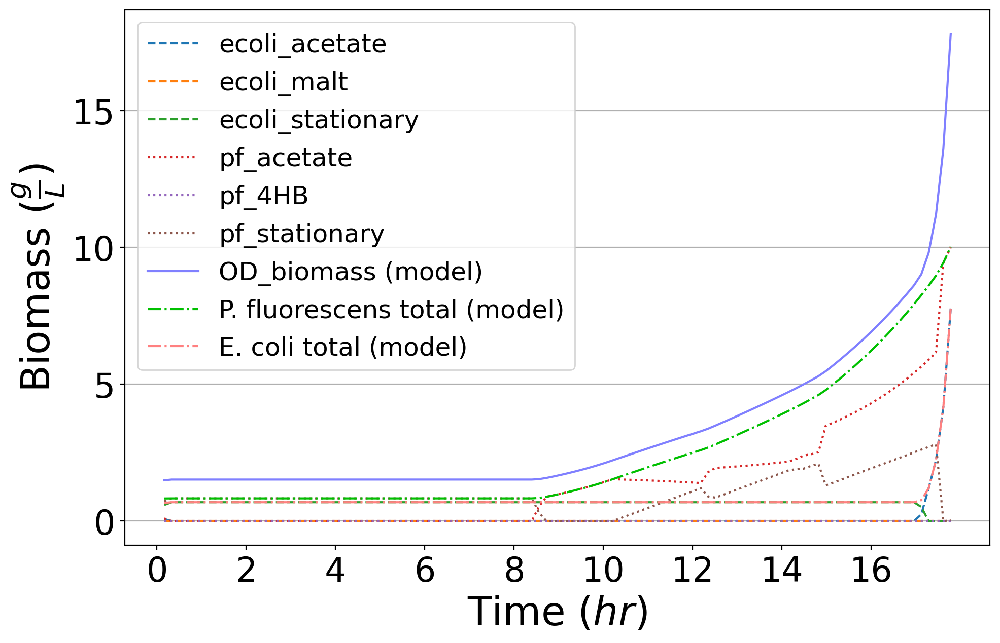

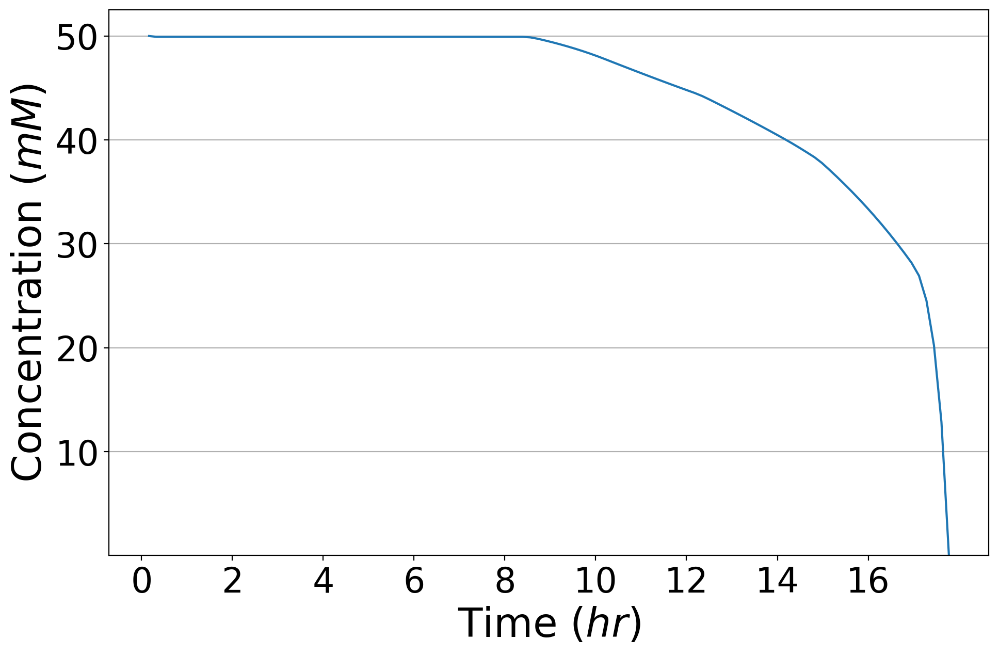

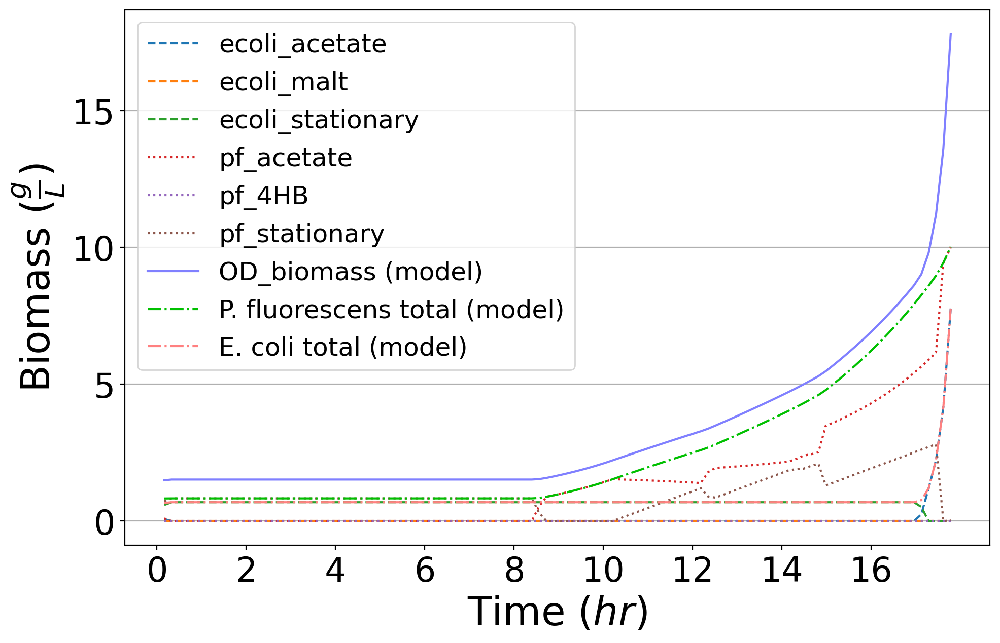

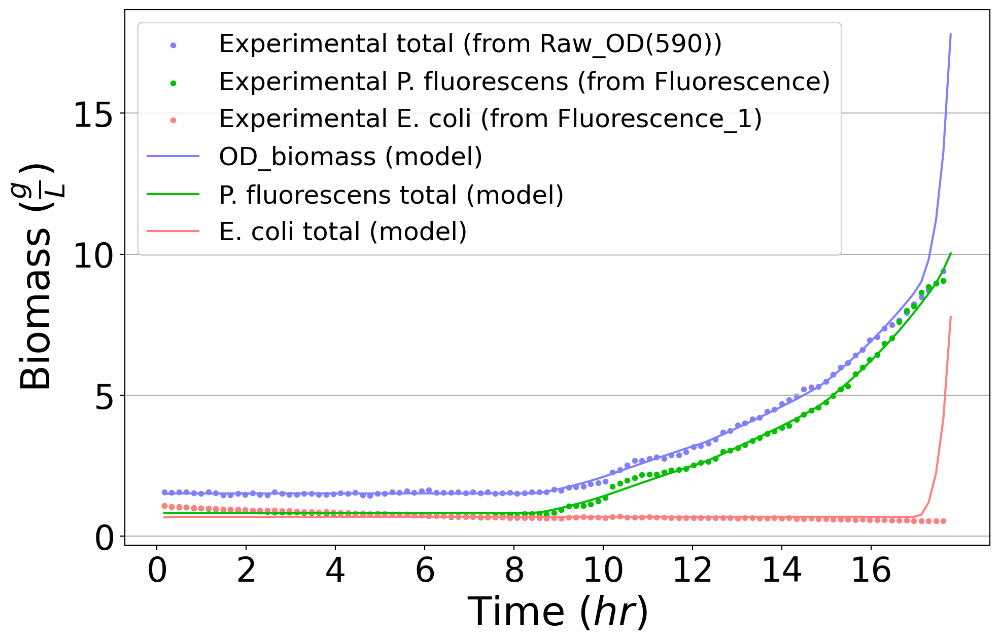

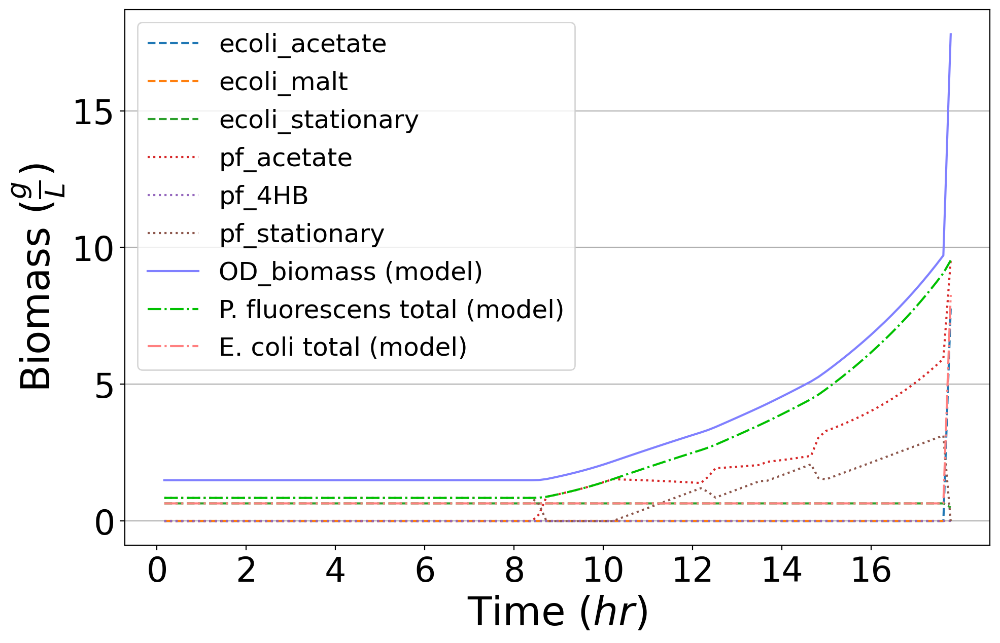

...

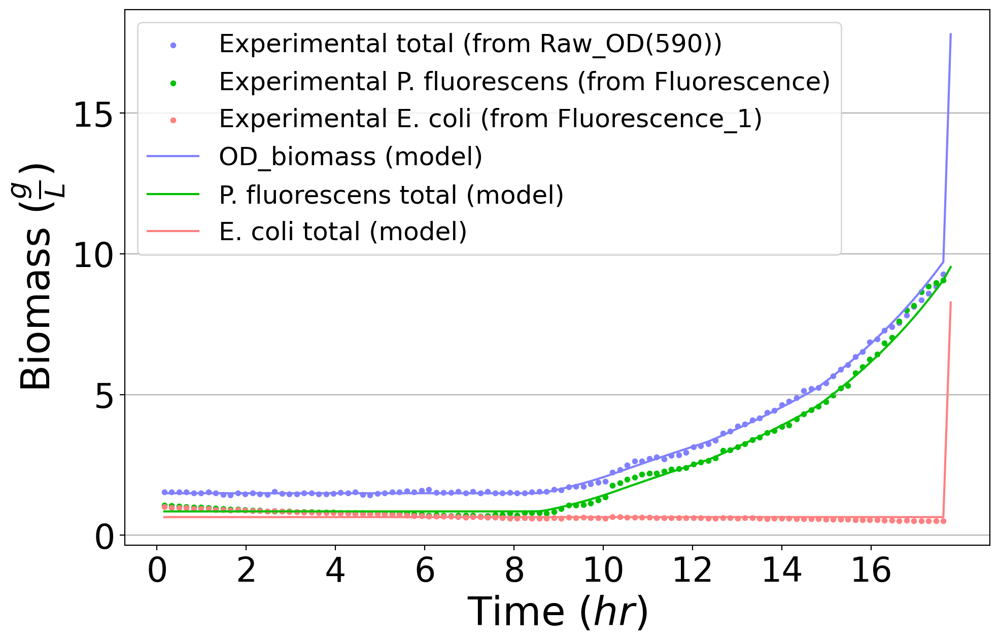

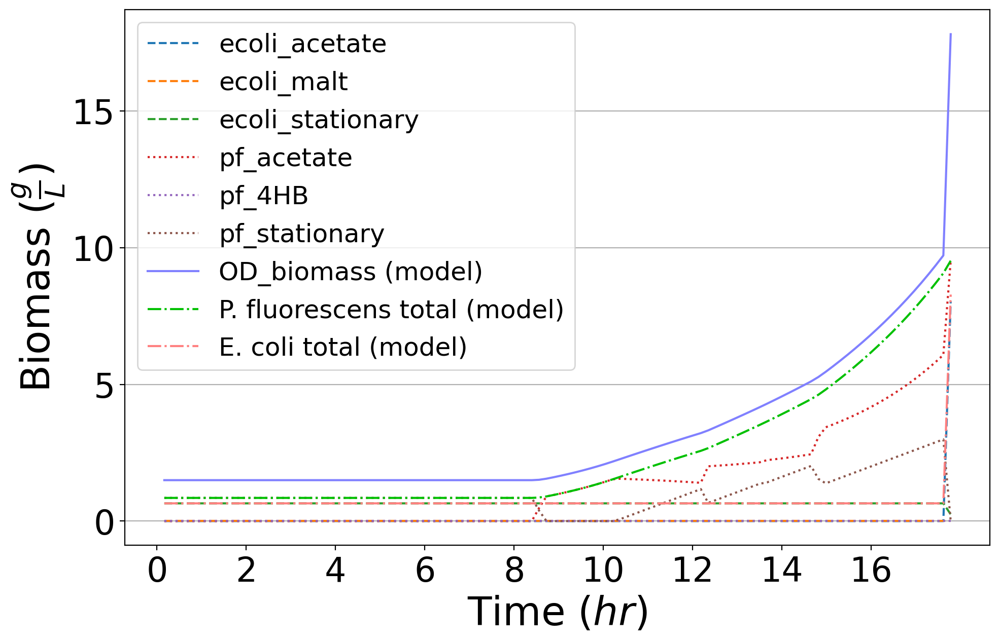

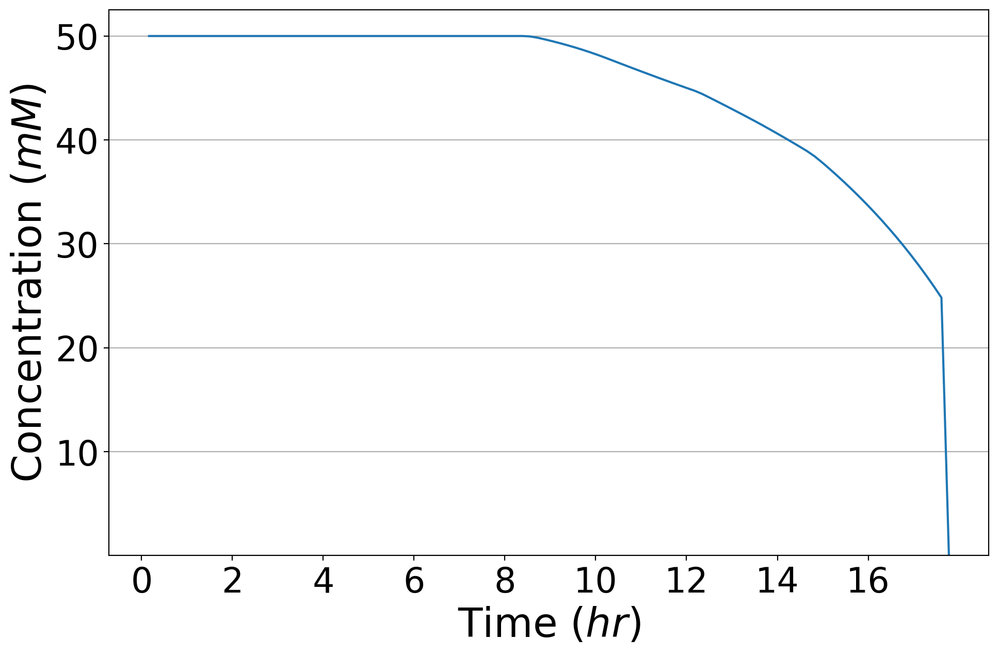

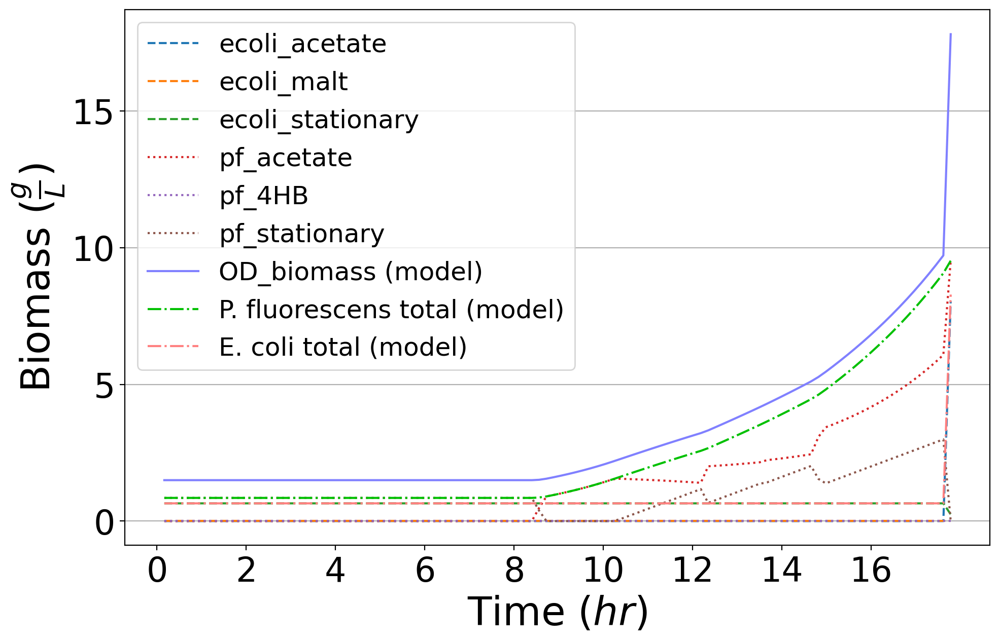

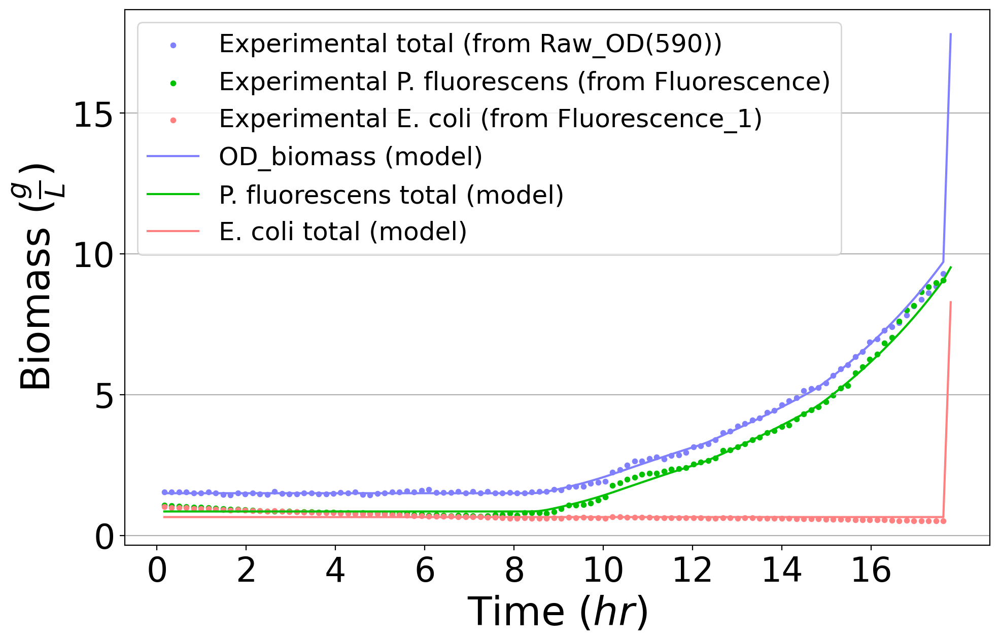

In [8]:
%run ../mscommphitting.py

acetate_commfit = CommPhitting(fluxes_df, standardized_carbon_conc, media_conc, '../../../../ModelSEED/ModelSEEDDatabase', growth_df, experimental_metadata)
acetate_commfit.fit_kcat(
    parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 5e-3},
    mets_to_track = ["cpd00029"],
    rel_final_conc = {"cpd00029":0.0001},
    zero_start = ["cpd00136", "cpd00179"],
    graphs = update_graphs("G38"),
    export_zip_name = 'acetate_commfit.zip', 
    requisite_biomass = requisite_biomass,
    publishing = True,
    export_lp = "acetate_coculture.lp")

#### Pseudomonas

In [9]:
%run ../data/standardized_data/datastandardization.py
growth_data_path="../data/Jeffs_data/PF-EC-PFEC on Acetate 6-17-22.xlsx"
time1 = process_time()
experimental_metadata, growth_df, fluxes_df, standardized_carbon_conc, requisite_biomass, trial_name_conversion, data_timestep_hr, simulation_timestep, media_conc = GrowthData.process(
    community_members = {
        pf: {
            'name': 'pf',
            'phenotypes': {
                'acetate': {"consumed":["cpd00029"]}, # kbase_api.get_from_ws("93465/25/1"), #'93465/11/1'), 
                '4HB': {"consumed":["cpd00136"]} # kbase_api.get_from_ws('	93465/27/1')} #93465/15/1')}
                }
        }
    },
    data_paths = {'path':growth_data_path, 'Raw OD(590)':'OD', 'Fluorescence':'pf'},
    species_abundances = {num:{"ecoli":1, "pf":1} for num in range(1,13)},
    carbon_conc_series = {'columns': {'cpd00029': {2:100, 3: 50, 4: 25, 5: 12.5, 6: 6.25, 7: 3}}},
    ignore_trials = {'rows': ['C', 'E', 'B', 'F'], 'columns': [1,2,4,5,6,7,8,9,10,11,12]},
    species_identities_rows = {
        1:{"ecoli":"mRuby"},
        2:{"ecoli":"ACS"},
        3:{"pf":""},
        4:{"ecoli":"mRuby"},
        5:{"ecoli":"ACS"},
    },
    significant_deviation=None
)
print(f"{(process_time()-time1)/60} minutes")

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommFitting\data\standardized_data\datastandardization.py:112: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


acetate {'consumed': ['cpd00029']}
4HB {'consumed': ['cpd00136']}
The model GCF_001612705.1.RAST.mdl is unable to be simulated with pFBA and yields a < None (infeasible). > error.
The ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'D2', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'G2', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12'] trials were dropped from the OD measurements per the ignore_trials parameter.
The [104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159] timesteps (with [0.52237614 0.51705334 0.50796007 

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommFitting\mscommfitting.py:79: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


Done with concentrations and biomass loops: 0.005989583333333334 min
Done with DCC loop: 0.00078125 min
Done with the DBC & diffc loop: 0.0020833333333333333 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.0609375 min
Done exporting the content: 0.03723958333333333 min
starting optimization
acetate_pf.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'malt', 'acetate', '4HB', 'stationary'},
 'species': ['OD', 'pf', 'ecoli'],
 'trial': 'G26'}
graph_1
{'content': 'conc',
 'experimental_data': 

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'acetate_pf.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 0.03802083333333333 min
starting optimization


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'acetate_pf.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


acetate_pf.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'malt', 'acetate', '4HB', 'stationary'},
 'species': ['OD', 'pf', 'ecoli'],
 'trial': 'G26'}
graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00029'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyl

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G26_cpd00029_c.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G26_OD,pf,ecoli_OD,pf,ecoli species_total_biomass.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G26_OD,pf,ecoli_OD,pf,ecoli species_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done simulating with the coefficients for biomass partitions: 1
0.04348958333333333 minutes
{'pf': {'4HB': 1.2375, 'acetate': 0.274725}}
Done with concentrations and biomass loops: 0.005989583333333334 min
Done with DCC loop: 0.00078125 min
Done with the DBC & diffc loop: 0.0020833333333333333 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.062239583333333334 min


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'acetate_pf.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 0.0375 min
starting optimization


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'acetate_pf.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


acetate_pf.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'malt', 'acetate', '4HB', 'stationary'},
 'species': ['OD', 'pf', 'ecoli'],
 'trial': 'G26'}
graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00029'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyl

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G26_cpd00029_c.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G26_OD,pf,ecoli_OD,pf,ecoli species_total_biomass.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G26_OD,pf,ecoli_OD,pf,ecoli species_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done simulating with the coefficients for biomass partitions: 2
0.04140625 minutes
{'pf': {'4HB': 0.27070312500000004, 'acetate': 0.26613984375}}


{}

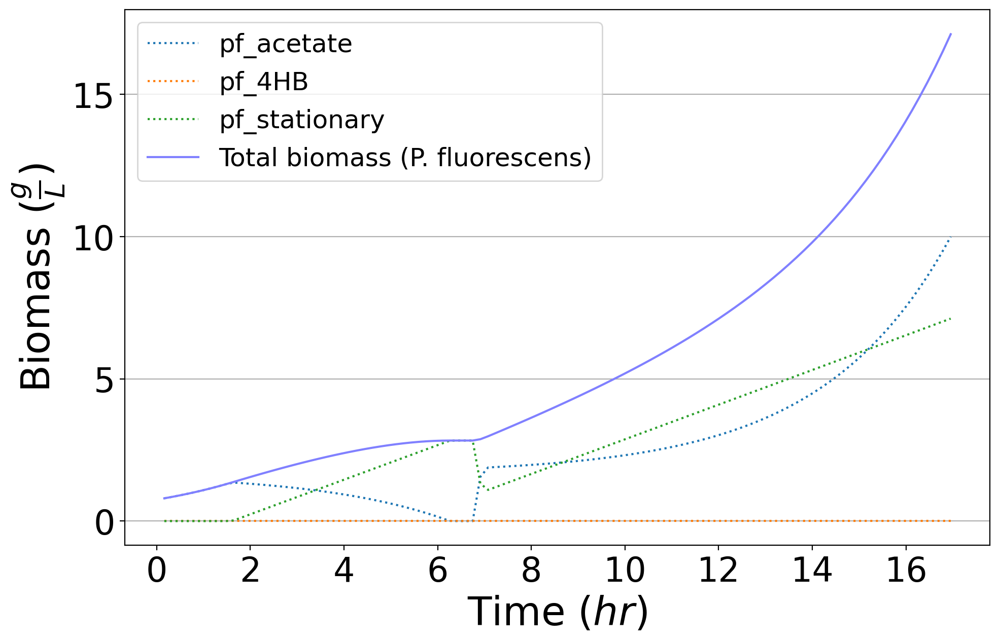

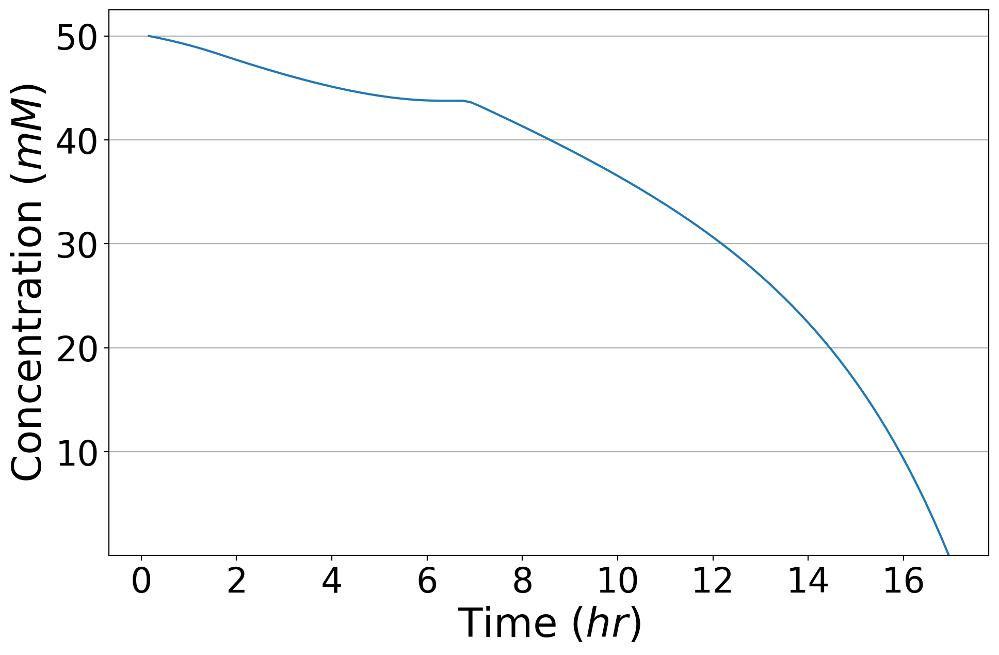

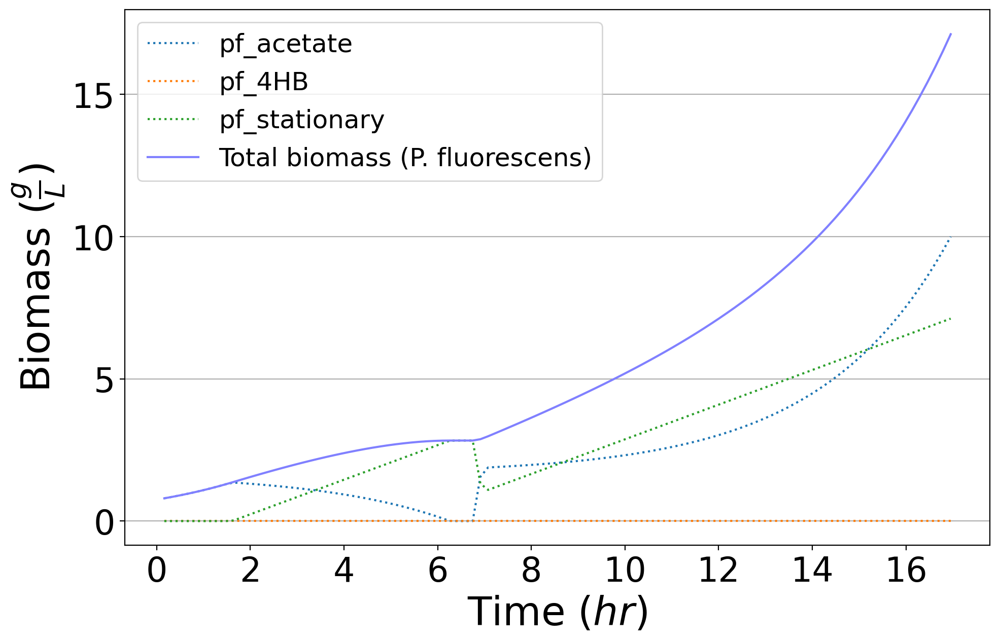

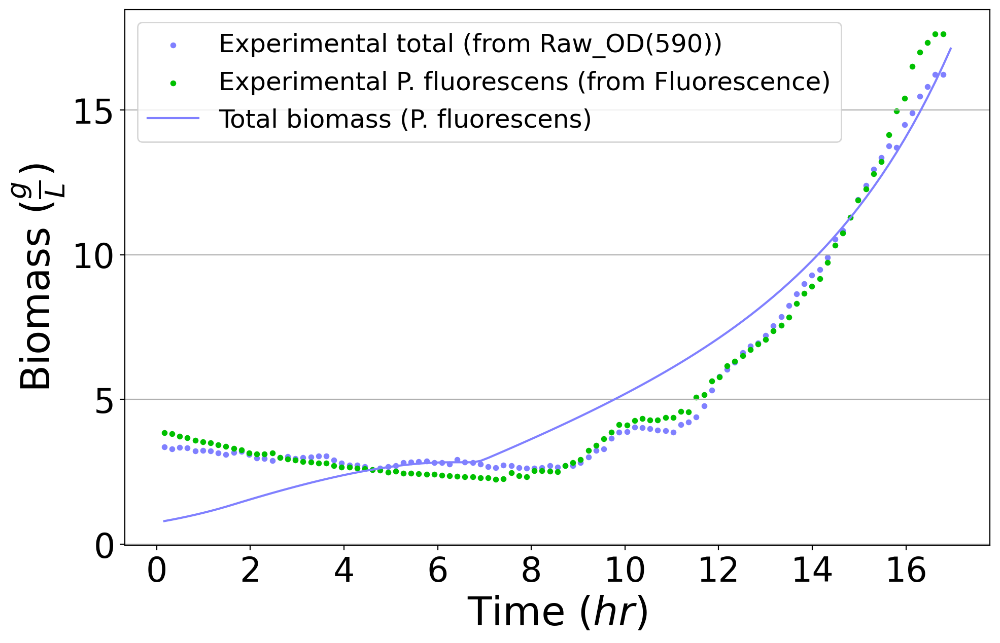

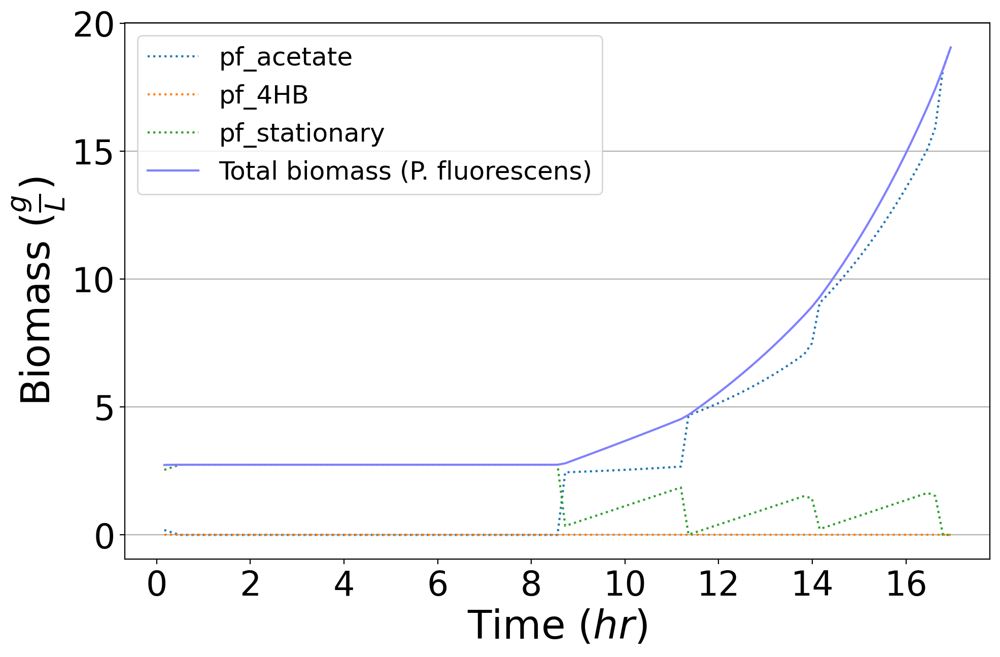

...

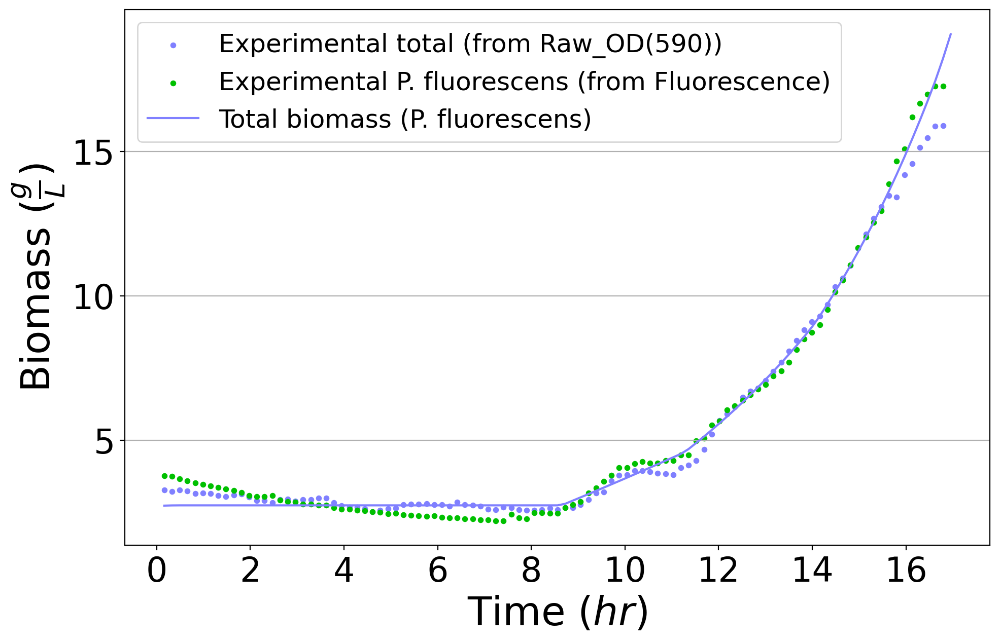

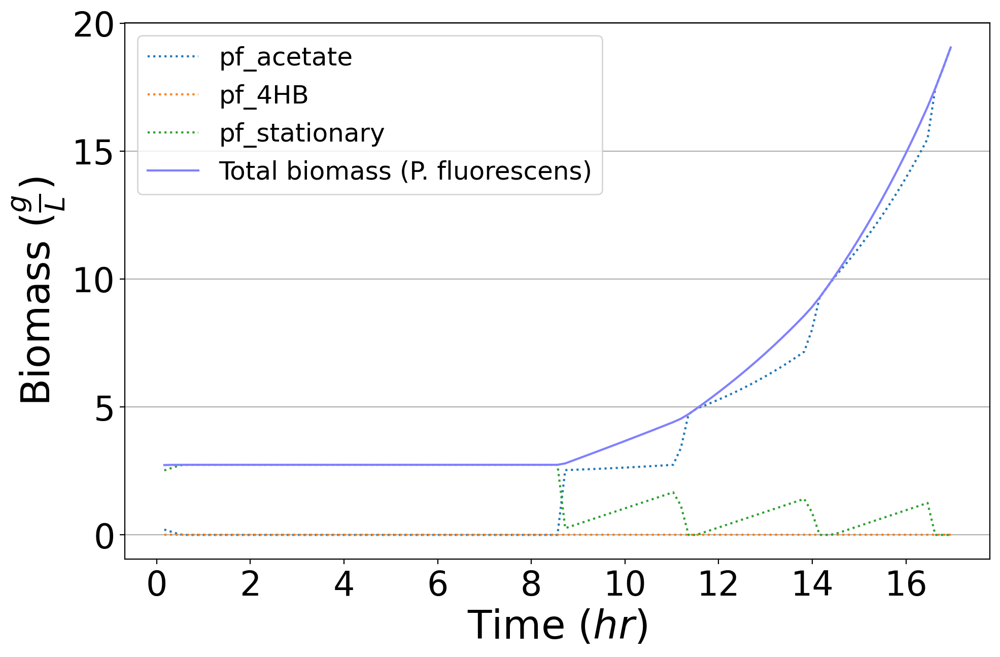

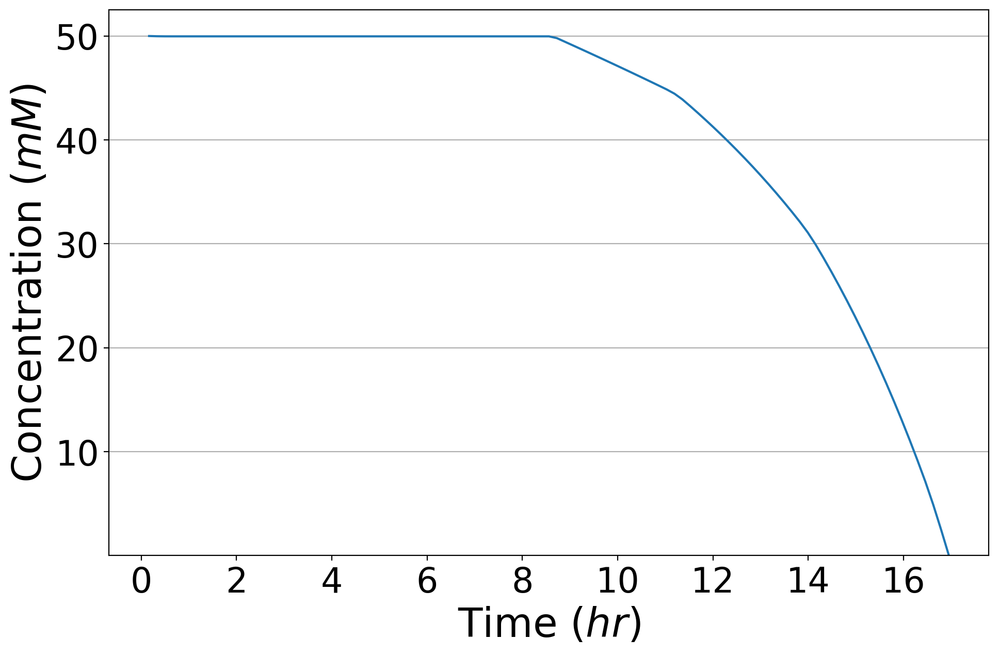

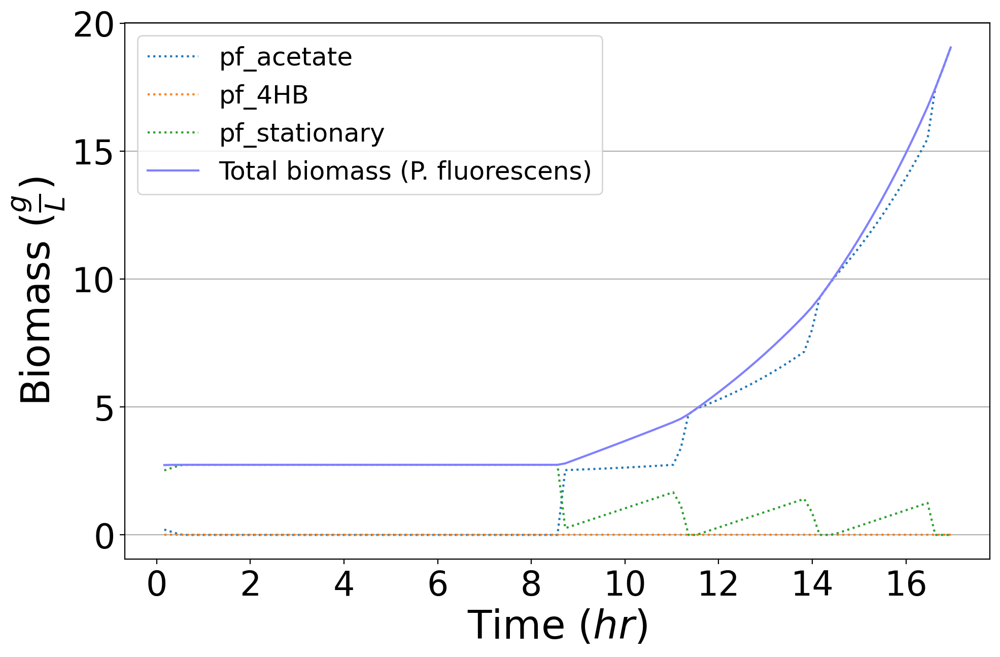

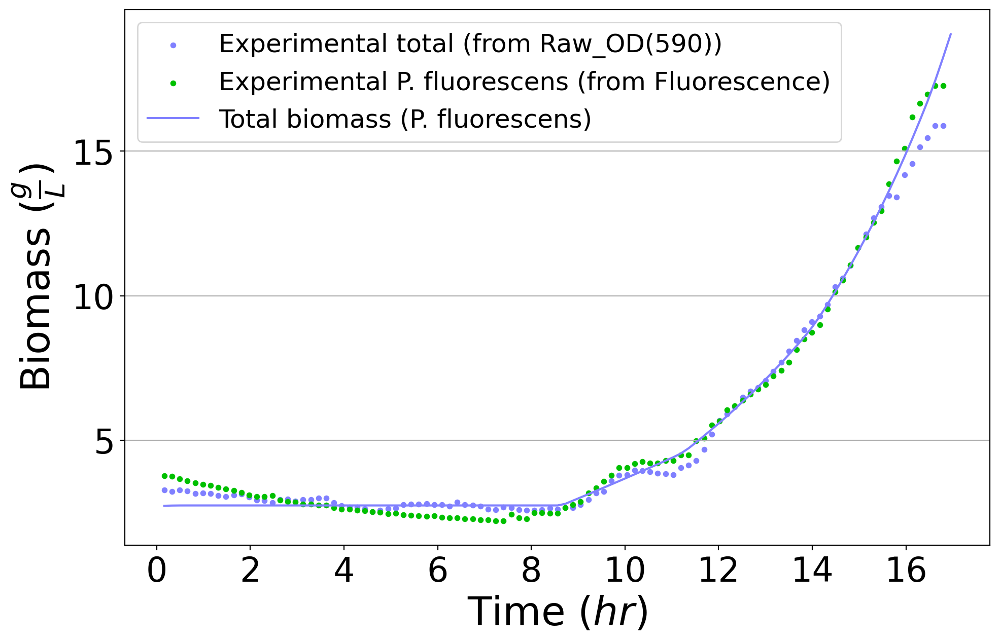

In [10]:
%run ../mscommphitting.py

acetate_pf = CommPhitting(fluxes_df, standardized_carbon_conc, media_conc, '../../../../ModelSEED/ModelSEEDDatabase', growth_df, experimental_metadata)
acetate_pf.fit_kcat(
    parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 5e-3},
    mets_to_track = ["cpd00029"],
    rel_final_conc = {"cpd00029":0.0001},
    zero_start = ["cpd00136", "cpd00179"],
    graphs = update_graphs("G26"),
    export_zip_name = 'acetate_pf.zip', 
    requisite_biomass = requisite_biomass,
    publishing = True,
    export_lp = "acetate_pf.lp")

#### E. coli

In [11]:
%run ../data/standardized_data/datastandardization.py
growth_data_path="../data/Jeffs_data/PF-EC-PFEC on Acetate 6-17-22.xlsx"
time1 = process_time()
experimental_metadata, growth_df, fluxes_df, standardized_carbon_conc, requisite_biomass, trial_name_conversion, data_timestep_hr, simulation_timestep, media_conc = GrowthData.process(
    community_members = {
        ecoli: {
            'name': 'ecoli', 
            'phenotypes': {
                'acetate': {"consumed":["cpd00029"]}, #kbase_api.get_from_ws('93465/13/1'), 
                'malt': {"consumed":["cpd00179"],
                         "excreted":["cpd00029"]} #kbase_api.get_from_ws("93465/23/1")} #'93465/9/1')}   # !!! The phenotype name must align with the experimental IDs for the graphs to find the appropriate data
                }
        }
    },
    data_paths = {'path':growth_data_path, 'Raw OD(590)':'OD','Fluorescence 1':'ecoli'},
    species_abundances = {num:{"ecoli":1, "pf":1} for num in range(1,13)},
    carbon_conc_series = {'columns': {'cpd00029': {2:100, 3: 50, 4: 25, 5: 12.5, 6: 6.25, 7: 3}}},
    ignore_trials = {'rows': ['C', 'E', 'D', 'F'], 'columns': [1,2,4,5,6,7,8,9,10,11,12]},
    species_identities_rows = {
        1:{"ecoli":"mRuby"},
        2:{"ecoli":"ACS"},
        3:{"pf":""},
        4:{"ecoli":"mRuby"},
        5:{"ecoli":"ACS"},
    },
    significant_deviation=None
)
print(f"{(process_time()-time1)/60} minutes")

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommFitting\data\standardized_data\datastandardization.py:112: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


acetate {'consumed': ['cpd00029']}
malt {'consumed': ['cpd00179'], 'excreted': ['cpd00029']}
The ['B2', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'G2', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12'] trials were dropped from the OD measurements per the ignore_trials parameter.
The ['B2', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'B12', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'E12', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10', 'F11', 'F12', 'G2', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12'] trials were dro

C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommFitting\mscommfitting.py:79: DeprecationWarning: invalid escape sequence \_
  met_id = re.sub('(\_\w\d+)', '', met)


Done with concentrations and biomass loops: 0.015364583333333333 min
Done with DCC loop: 0.0033854166666666668 min
Done with the DBC & diffc loop: 0.005729166666666666 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.17213541666666668 min
Done exporting the content: 0.06536458333333334 min
starting optimization
acetate_ecoli.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'malt', 'acetate', '4HB', 'stationary'},
 'species': ['OD', 'pf', 'ecoli'],
 'trial': 'G2'}
graph_1
{'content': 'conc',


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'acetate_ecoli.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 0.06510416666666667 min
starting optimization


C:\Users\Andrew Freiburger\Documents\Argonne\ProjectNotebooks\CommunityModeling\CommFitting\mscommfitting.py:875: UserWarning: The conversion factor 5e-06 optimized to a bound, which may be indicative of an error, such as improper kinetic rates.
  warnings.warn(f"The conversion factor {value} optimized to a bound, which may be "
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'acetate_ecoli.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


acetate_ecoli.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'malt', 'acetate', '4HB', 'stationary'},
 'species': ['OD', 'pf', 'ecoli'],
 'trial': 'G2'}
graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00029'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linest

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G2_OD,pf,ecoli_OD,pf,ecoli species_total_biomass.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G2_cpd00029_c.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G2_OD,pf,ecoli_OD,pf,ecoli species_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done simulating with the coefficients for biomass partitions: 1
0.12473958333333333 minutes
{'ecoli': {'acetate': 11.915475, 'malt': 1.2375}}
Done with concentrations and biomass loops: 0.01484375 min
Done with DCC loop: 0.003125 min
Done with the DBC & diffc loop: 0.005729166666666666 min
Solver: <class 'optlang.glpk_interface.Model'>
Done with loading the variables, constraints, and objective: 0.11223958333333334 min


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'parameters.csv'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'acetate_ecoli.lp'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'CommPhitting.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


Done exporting the content: 0.065625 min
starting optimization


C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'acetate_ecoli.json'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


acetate_ecoli.zip
graph_0
{'content': 'biomass',
 'experimental_data': False,
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linestyle': 'dotted',
                     'name': 'P. fluorescens'}},
 'parsed': False,
 'phenotype': {'malt', 'acetate', '4HB', 'stationary'},
 'species': ['OD', 'pf', 'ecoli'],
 'trial': 'G2'}
graph_1
{'content': 'conc',
 'experimental_data': False,
 'mets': ['cpd00029'],
 'painting': {'OD': {'color': 'blue',
                     'linestyle': 'solid',
                     'name': 'Total biomass'},
              'ecoli': {'color': 'red',
                        'linestyle': 'dashed',
                        'name': 'E. coli'},
              'pf': {'color': 'green',
                     'linest

C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G2_OD,pf,ecoli_OD,pf,ecoli species_total_biomass.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G2_cpd00029_c.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)
C:\Users\Andrew Freiburger\AppData\Local\Programs\Python\Python39\lib\zipfile.py:1514: UserWarning: Duplicate name: 'G2_OD,pf,ecoli_OD,pf,ecoli species_b_.jpg'
  return self._open_to_write(zinfo, force_zip64=force_zip64)


{}

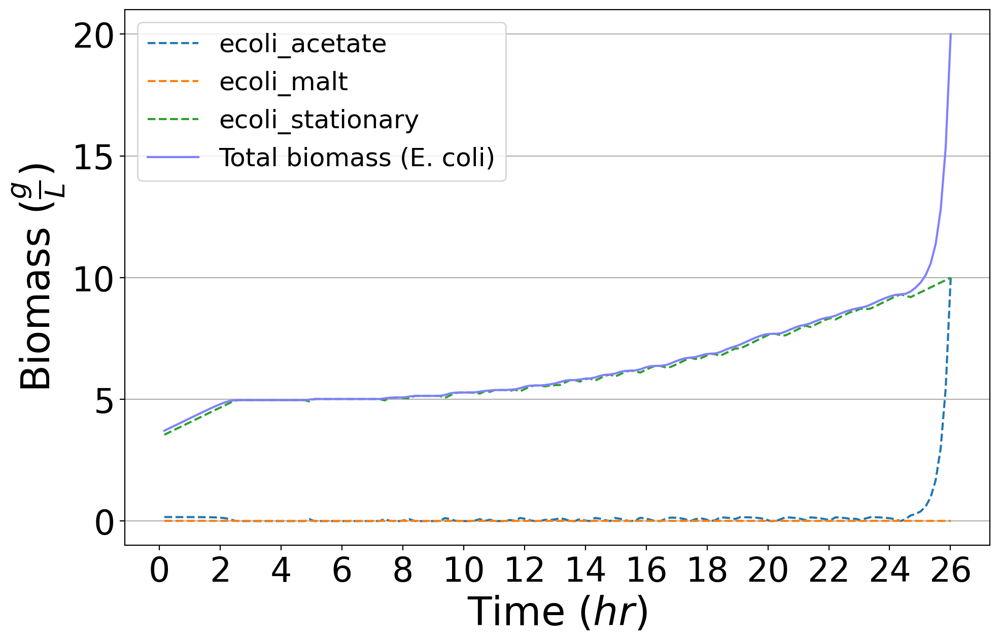

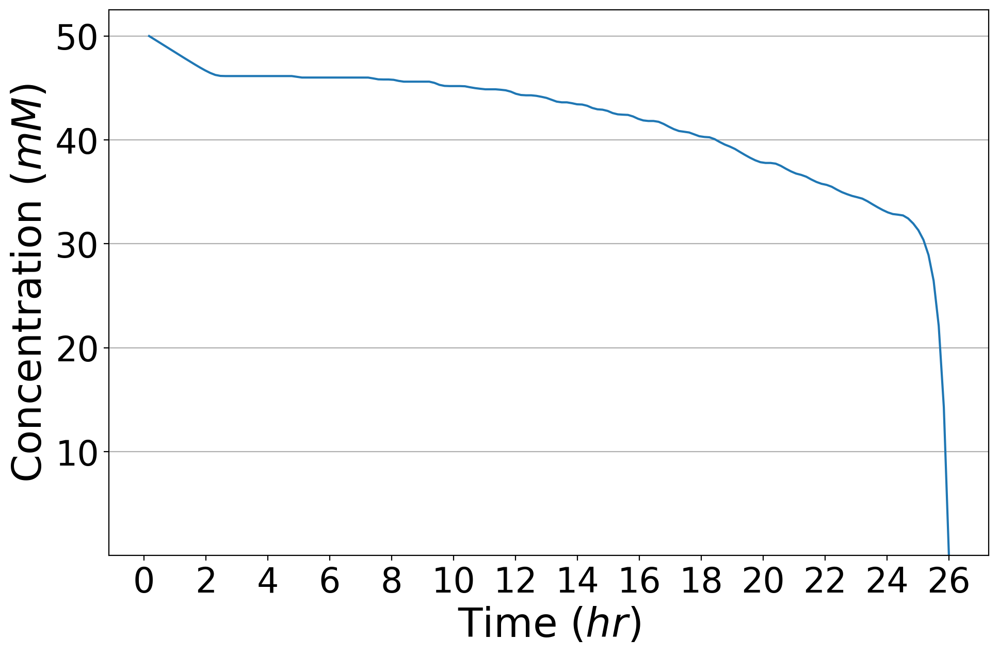

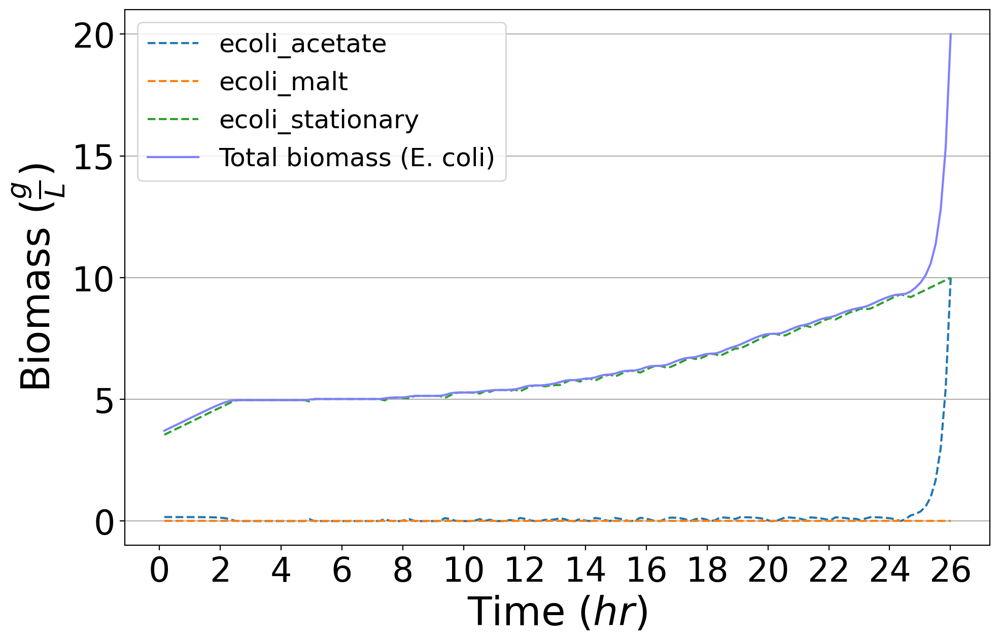

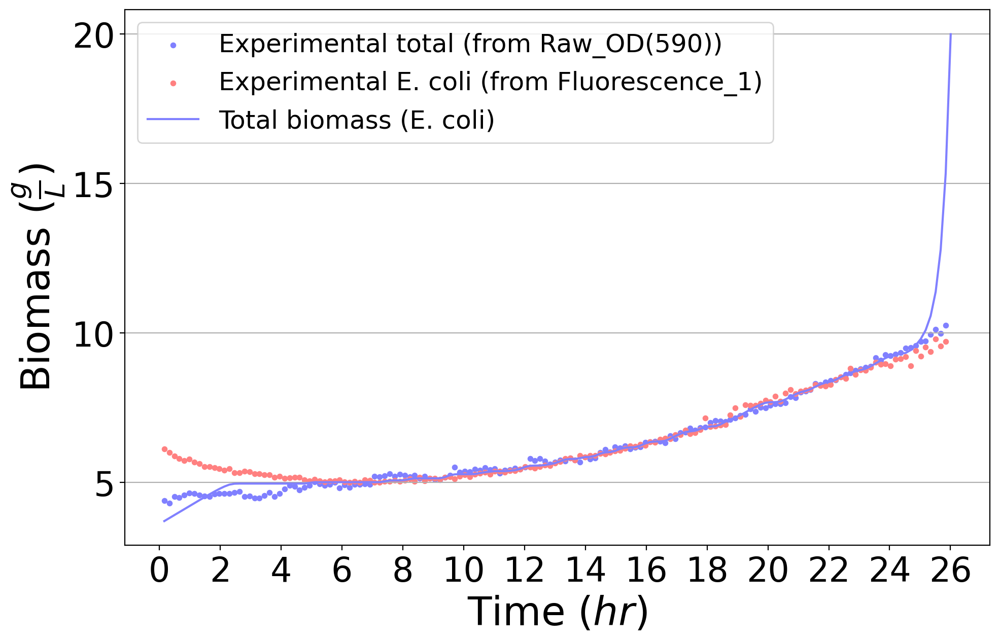

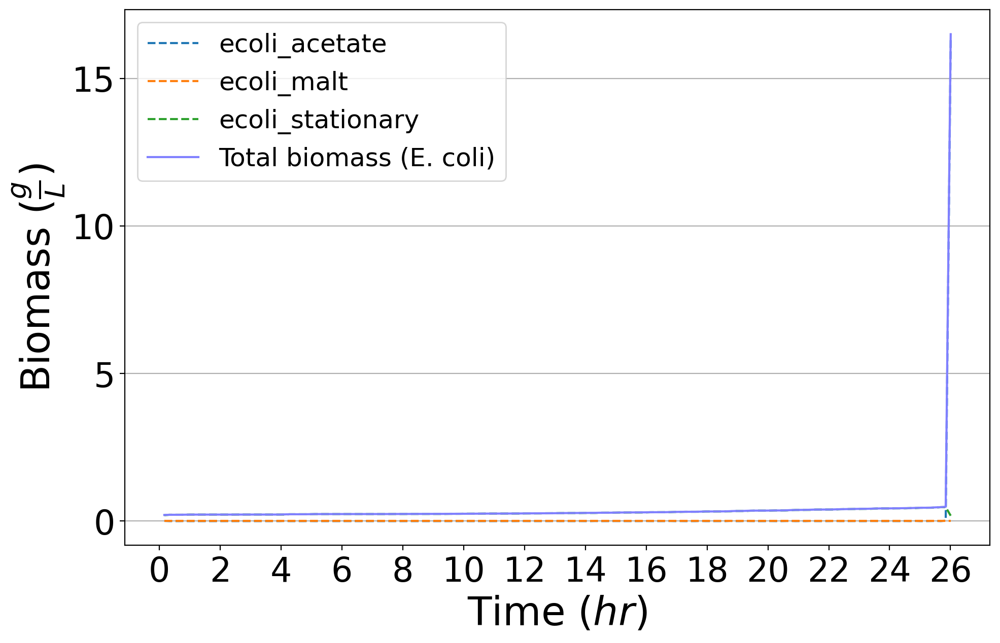

...

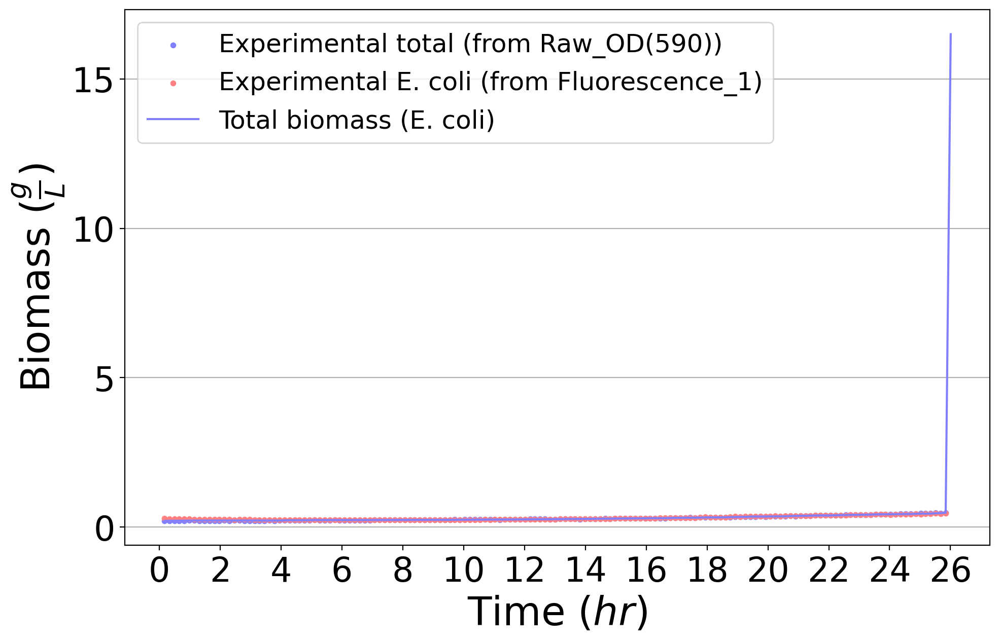

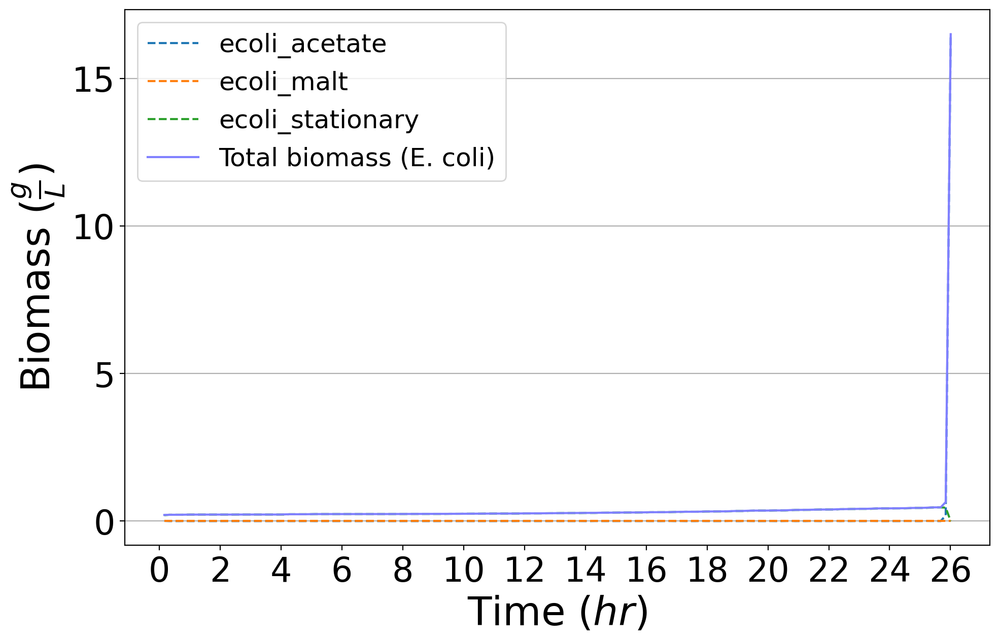

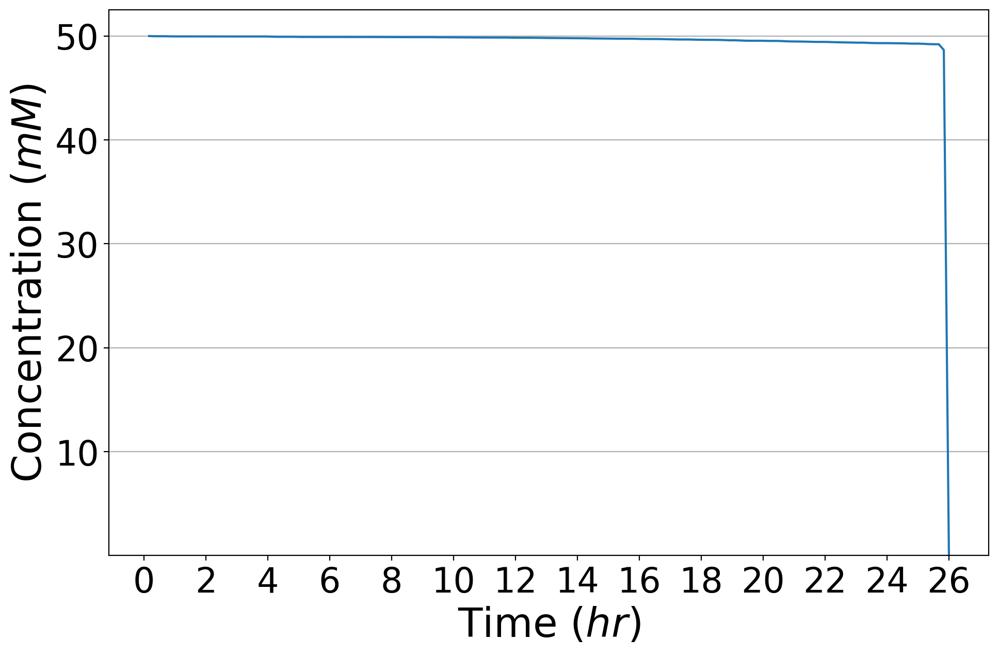

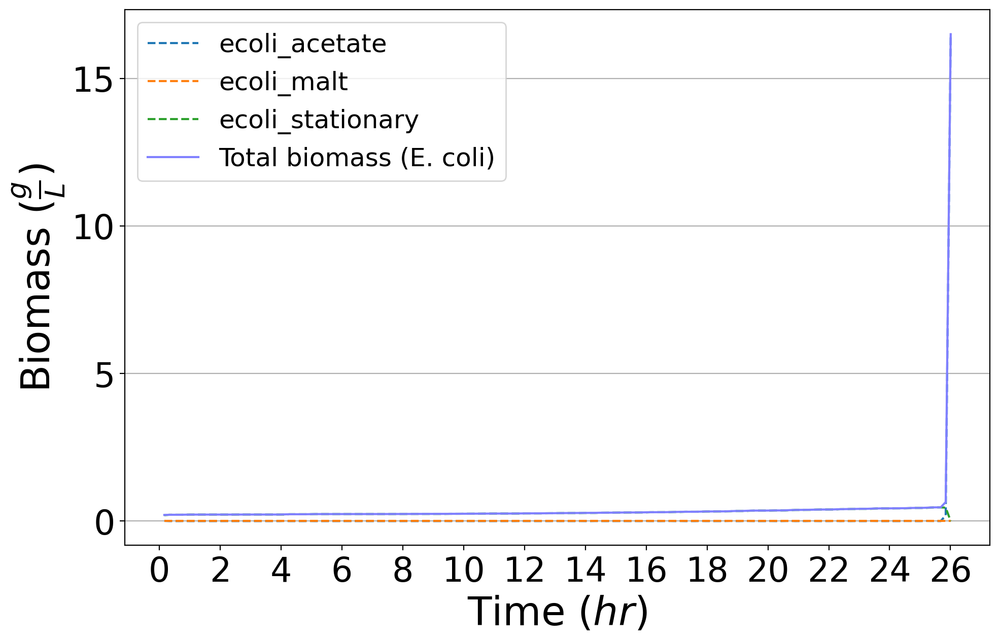

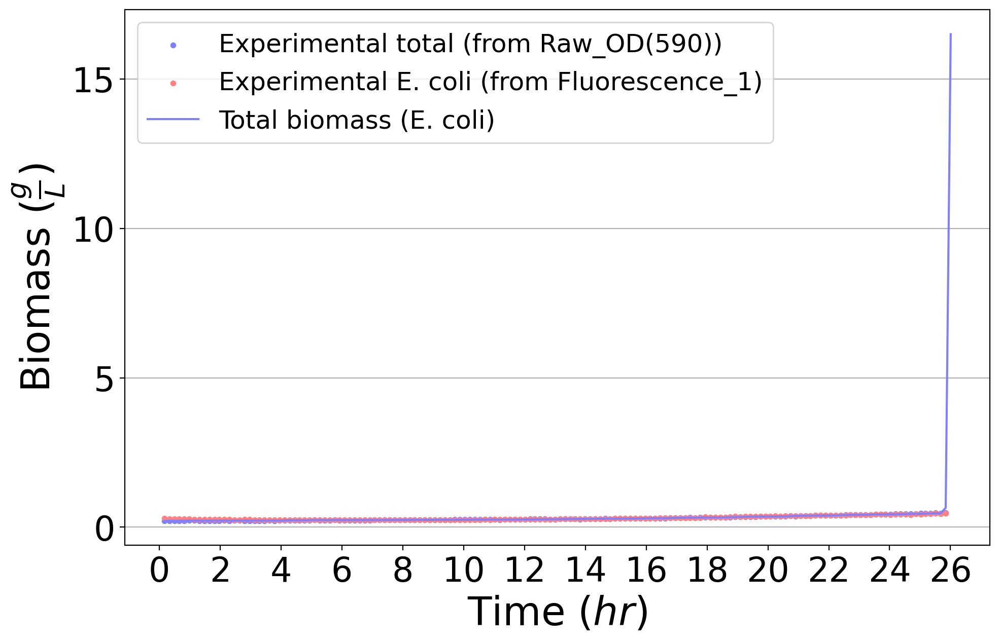

In [12]:
%run ../mscommphitting.py

acetate_ecoli = CommPhitting(fluxes_df, standardized_carbon_conc, media_conc, '../../../../ModelSEED/ModelSEEDDatabase', growth_df, experimental_metadata)
acetate_ecoli.fit_kcat(
    parameters = {'cvmin': .1, 'bcv': 0.0001, "stationary": 5e-3},
    mets_to_track = ["cpd00029"],
    rel_final_conc = {"cpd00029":0.00001},
    zero_start = ["cpd00136", "cpd00179"],
    graphs = update_graphs("G2"),
    export_zip_name = 'acetate_ecoli.zip', 
    requisite_biomass = requisite_biomass,
    publishing = True,
    export_lp = "acetate_ecoli.lp")

# SteadyCom

In [7]:
# import the models
from cobra.io import load_json_model
ecoli = load_json_model("../ecoli.json")
pf = load_json_model("../pf.json")

In [ ]:
%run ../../../../ModelSEED/ModelSEEDpy/modelseedpy/community/mssteadycom.py


# Acquire metabolic profiles for the requested phenotypes

In [9]:
%run ../../../../ModelSEED/ModelSEEDpy/modelseedpy/community/commhelper.py

phenotype_descriptions = {
    ecoli: {
        'name': 'ecoli',
        'phenotypes': {
            'alpha-D-lactose': {"consumed":["cpd00208"]},
            'D-Glucose': {"consumed":["cpd00027"]},
            'D-Mannitol': {"consumed":["cpd00314"]},
            'N-Acetyl-D-glucosamine': {"consumed":["cpd00122"]},
            'methyl-d-lactate': {"consumed":["cpd24428"]},
            'Neu5Ac': {"consumed":["cpd00232"]},
            'Maltose': {"consumed":["cpd00179"]},
            'D-Mannose': {"consumed":["cpd00138"]},
            'D-Fructose': {"consumed":["cpd00082"]},
            'Galactose': {"consumed":["cpd00108"]},
            }
    },
}
fluxes, members = phenotypes(phenotype_descriptions, all_phenotypes=False, phenotype_flux_threshold=0.1)



 GCF_000005845.2.RAST.mdl
EX_cpd00208_e0
EX_cpd00027_e0
EX_cpd00314_e0
EX_cpd00122_e0


KeyError: 'EX_cpd24428_e0'